## ⚙️ Import Libraries

In [139]:
import os
from datetime import datetime

import numpy as np
import pandas as pd

import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl

import matplotlib.pyplot as plt
%matplotlib inline

np.random.seed(42)
tf.random.set_seed(42)

print(f"TensorFlow version: {tf.__version__}")
print(f"Keras version: {tfk.__version__}")
print(f"GPU devices: {len(tf.config.list_physical_devices('GPU'))}")

TensorFlow version: 2.16.1
Keras version: 3.3.3
GPU devices: 2


## ⏳ Load the Data (no outlier)

In [140]:
from sklearn.model_selection import train_test_split
import numpy as np
data = np.load("/kaggle/input/normal2/cleaned_data.npz")

X_train = data["training_set_filtered"]

y_train = data["masks_filtered"]

X_test = data["test_set"]
print(y_train[0].shape)
print(f"Test X shape: {X_test.shape}")

# Perform train-validation split (80-20 split)
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.2, random_state=42
)

print(f"Train set: {X_train.shape}, {y_train.shape}")
print(f"Validation set: {X_val.shape}, {y_val.shape}")

(64, 128)
Test X shape: (10022, 64, 128)
Train set: (2004, 64, 128), (2004, 64, 128)
Validation set: (501, 64, 128), (501, 64, 128)


### Outliers removed

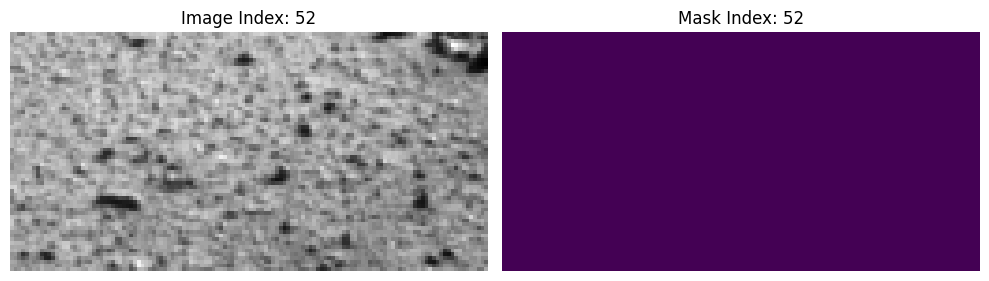

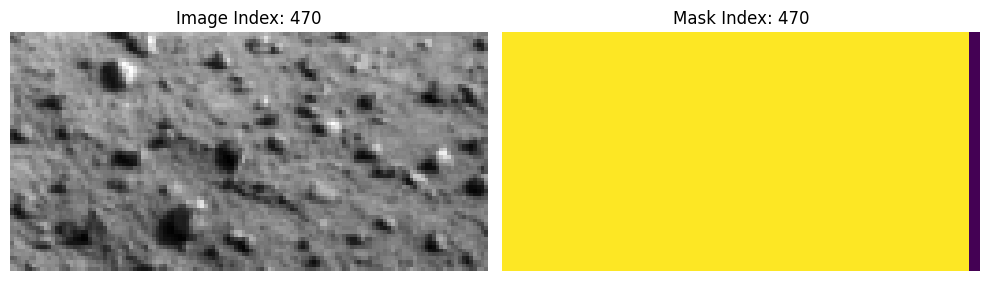

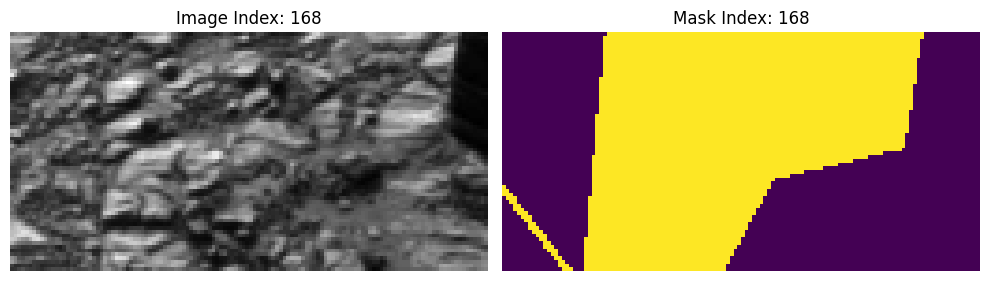

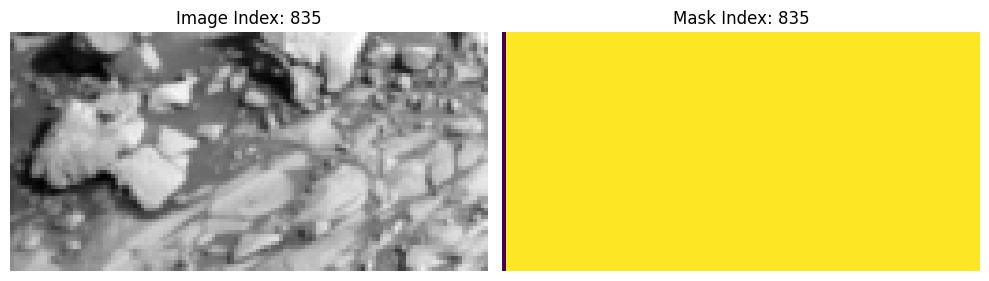

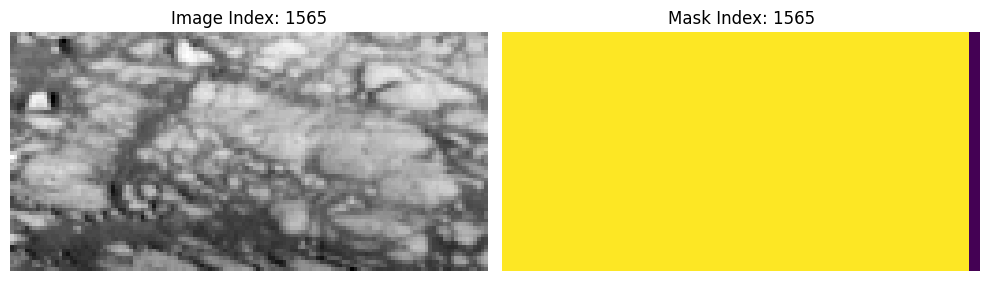

In [141]:
import random

# Visualize random image-mask pairs
for _ in range(5):
    idx = random.randint(0, len(X_train) - 1)
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))

    # Display input image
    ax[0].imshow(X_train[idx], cmap="gray")
    ax[0].set_title(f"Image Index: {idx}")
    ax[0].axis("off")

    # Display corresponding mask
    ax[1].imshow(y_train[idx], cmap="viridis")
    ax[1].set_title(f"Mask Index: {idx}")
    ax[1].axis("off")

    plt.tight_layout()
    plt.show()

## LETS DO SOME AUGMENTATION!!

## invert image and noise

/tmp/ipykernel_23/1632159539.py:66: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(len(images), 6, i * 6 + 3)
/tmp/ipykernel_23/1632159539.py:88: UserWarning: tight_layout not applied: number of columns in subplot specifications must be multiples of one another.
  plt.tight_layout()


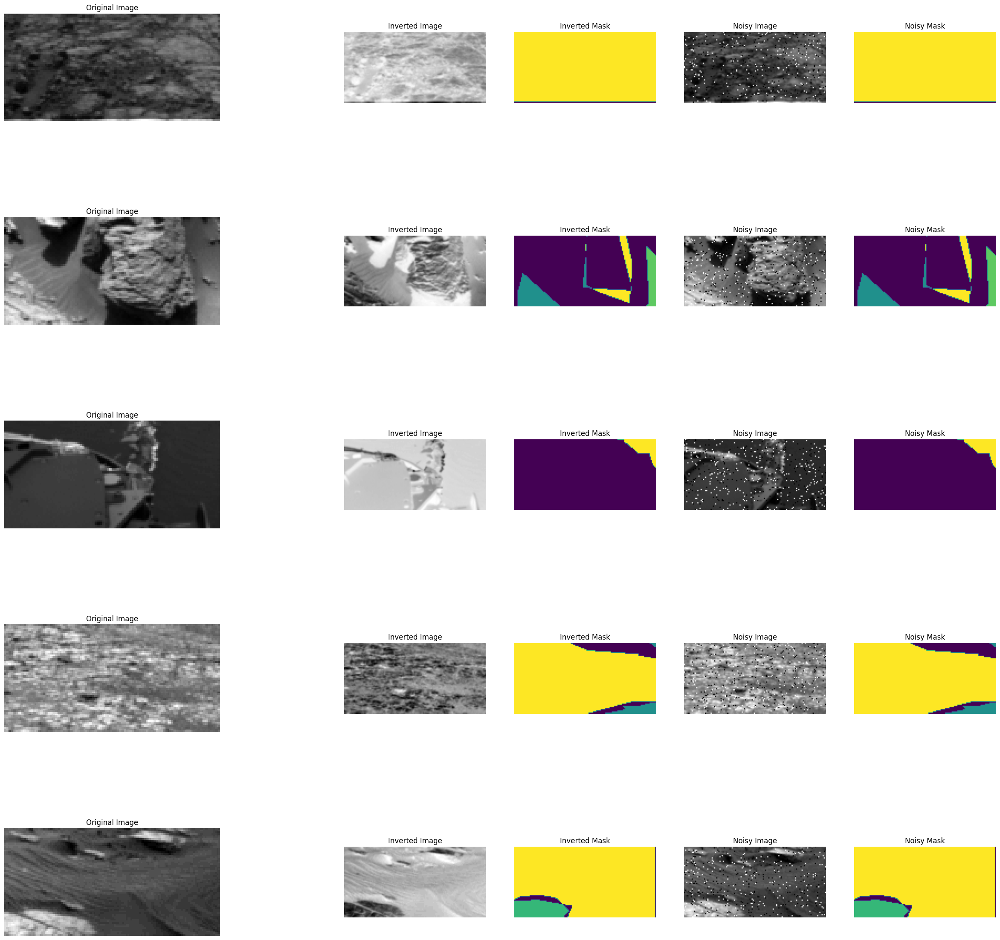

In [142]:


import numpy as np
from skimage.util import random_noise

# Define augmentation functions with mask handling
def invert_image(image, mask):
    return 255 - image, mask  # Mask remains unchanged

def add_salt_and_pepper_noise(image, mask, prob=0.03):
    """
    Add salt-and-pepper noise to an image while maintaining its original value range.

    Args:
        image (np.ndarray): Input image.
        mask (np.ndarray): Corresponding mask (unchanged).
        prob (float): Probability of noise per pixel.

    Returns:
        noisy_image (np.ndarray): Image with noise applied.
        mask (np.ndarray): Unchanged mask.
    """
    # Save the original range
    original_min = image.min()
    original_max = image.max()

    # Normalize the image to [0, 1]
    normalized_image = (image - original_min) / (original_max - original_min)

    # Generate random noise map
    random_map = np.random.random(image.shape)
    noisy_image = normalized_image.copy()
    noisy_image[random_map < prob] = 0  # Pepper
    noisy_image[random_map > (1 - prob)] = 1  # Salt

    # Rescale back to the original range
    noisy_image = noisy_image * (original_max - original_min) + original_min
    noisy_image = noisy_image.astype(image.dtype)  # Ensure the original data type is preserved

    return noisy_image, mask

"""def rotate_image(image, mask, angle):
    rotated_image = rotate(image, angle, reshape=False, mode='constant', cval=0)
    rotated_mask = rotate(mask, angle, reshape=False, mode='constant', order=0)
    return rotated_image, rotated_mask"""
"""
def adjust_brightness(image, mask, factor=1.2):
    brightened_image = np.clip(image * factor, 0, 255).astype(np.uint8)
    return brightened_image, mask  # Mask remains unchanged"""

# Visualize augmentations with masks
def visualize_all_augmentations(images, masks):
    plt.figure(figsize=(30, 30))
    for i, (image, mask) in enumerate(zip(images, masks)):
        # Original image and mask
        plt.subplot(len(images), 4, i * 4 + 1)
        plt.imshow(image, cmap="gray")
        plt.title("Original Image")
        plt.axis("off")

        plt.subplot(len(images), 4, i * 4 + 2)
        plt.imshow(mask, cmap="viridis")
        plt.title("Original Mask")
        plt.axis("off")

        # Inversion
        inverted_image, inverted_mask = invert_image(image, mask)
        plt.subplot(len(images), 6, i * 6 + 3)
        plt.imshow(inverted_image, cmap="gray")
        plt.title("Inverted Image")
        plt.axis("off")

        plt.subplot(len(images), 6, i * 6 + 4)
        plt.imshow(inverted_mask, cmap="viridis")
        plt.title("Inverted Mask")
        plt.axis("off")

        # Noise
        noisy_image, noisy_mask = add_salt_and_pepper_noise(image, mask)
        plt.subplot(len(images), 6, i * 6 + 5)
        plt.imshow(noisy_image, cmap="gray")
        plt.title("Noisy Image")
        plt.axis("off")

        plt.subplot(len(images), 6, i * 6 + 6)
        plt.imshow(noisy_mask, cmap="viridis")
        plt.title("Noisy Mask")
        plt.axis("off")

    plt.tight_layout()
    plt.show()


# Randomly select 5 samples from the dataset
random_indices = np.random.choice(len(X_train), size=5, replace=False)
sample_images = X_train[random_indices]
sample_masks = y_train[random_indices]

# Visualize augmentations
visualize_all_augmentations(sample_images, sample_masks)


### rotation

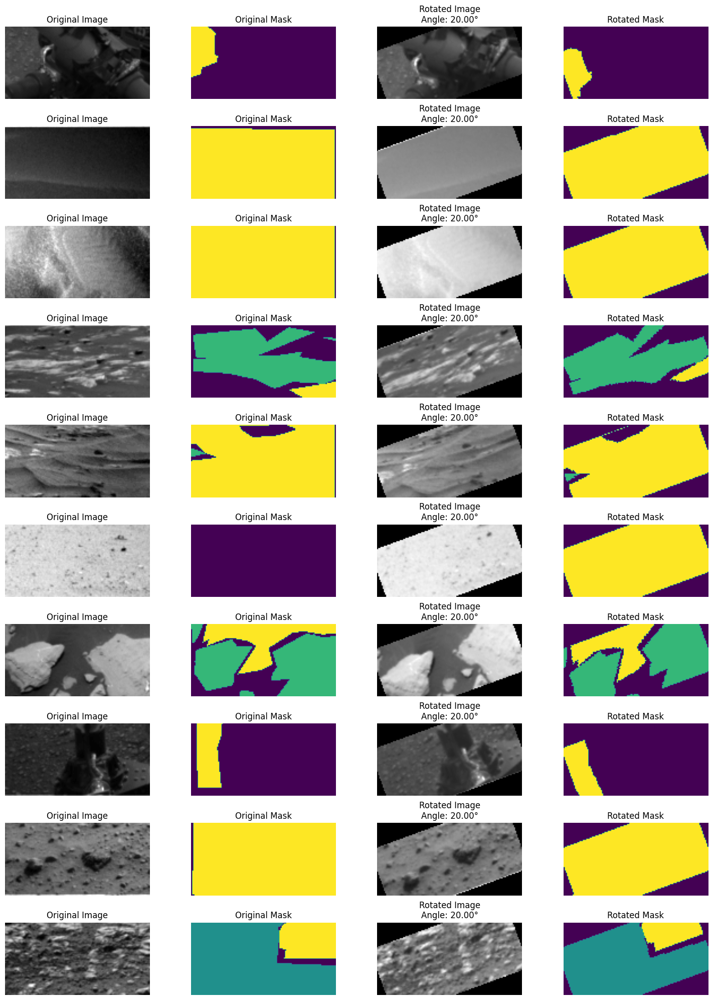

In [143]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import rotate

# Define the rotation function using scipy
def rotate_image_and_mask(image, mask, angle):
    """
    Rotate a grayscale image and its corresponding mask by a given angle.
    """
    # Rotate the grayscale image (bilinear interpolation)
    rotated_image = rotate(image, angle, reshape=False, mode="constant", order=1)

    # Rotate the mask (nearest-neighbor interpolation)
    rotated_mask = rotate(mask, angle, reshape=False, mode="constant", order=0)

    return rotated_image, rotated_mask

# Randomly select 10 images
random_indices = np.random.choice(len(X_train), size=10, replace=False)
selected_images = X_train[random_indices]
selected_masks = y_train[random_indices]

# Apply random rotation and visualize
plt.figure(figsize=(15, 20))
for i, (image, mask) in enumerate(zip(selected_images, selected_masks)):
    # Generate a random angle for rotation
    angle = np.random.uniform(20, 20)  # Random angle between -30° and 30°

    # Rotate the image and mask
    rotated_image, rotated_mask = rotate_image_and_mask(image, mask, angle)

    # Plot original and rotated images/masks
    plt.subplot(10, 4, i * 4 + 1)
    plt.imshow(image, cmap="gray")
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(10, 4, i * 4 + 2)
    plt.imshow(mask, cmap="viridis")
    plt.title("Original Mask")
    plt.axis("off")

    plt.subplot(10, 4, i * 4 + 3)
    plt.imshow(rotated_image, cmap="gray")
    plt.title(f"Rotated Image\nAngle: {angle:.2f}°")
    plt.axis("off")

    plt.subplot(10, 4, i * 4 + 4)
    plt.imshow(rotated_mask, cmap="viridis")
    plt.title("Rotated Mask")
    plt.axis("off")

plt.tight_layout()
plt.show()


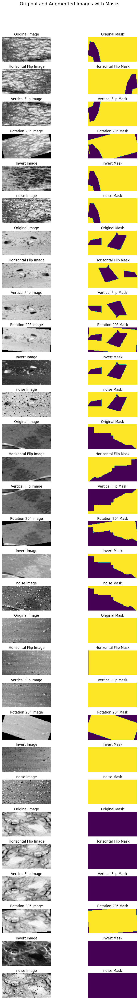

In [144]:
# Helper functions for applying augmentations
def augment_image_and_mask(image, mask, augment_type):
    if augment_type == "Horizontal Flip":
        return np.fliplr(image), np.fliplr(mask)
    elif augment_type == "Vertical Flip":
        return np.flipud(image), np.flipud(mask)
    elif augment_type == "Rotation 20°":
        angle = np.random.uniform(-20, 20)
        # Rotate the grayscale image (bilinear interpolation)
        rotated_image = rotate(image, angle, reshape=False, mode="constant", order=1)

        # Rotate the mask (nearest-neighbor interpolation)
        rotated_mask = rotate(mask, angle, reshape=False, mode="constant", order=0)

        return rotated_image, rotated_mask
    elif augment_type=="Invert":
        inverted_image, inverted_mask = invert_image(image, mask)
        return inverted_image,inverted_mask
    elif augment_type=="noise":
        noisy_image, noisy_mask = add_salt_and_pepper_noise(image, mask)
        return noisy_image,noisy_mask
        
    """elif augment_type == "Zoom (0.8-1.2)":
        zoom_factor = random.uniform(0.8, 1.2)
        zoom_image = np.clip(image * zoom_factor, 0, 255)
        return zoom_image, mask
    elif augment_type == "Shift (Width and Height)":
        shift_x, shift_y = random.uniform(-0.1, 0.1), random.uniform(-0.1, 0.1)
        return shift(image, [shift_x * image.shape[0], shift_y * image.shape[1]]), shift(mask, [shift_x * mask.shape[0], shift_y * mask.shape[1]], order=0)"""
    return image, mask

# Define augmentations
data_augmentations = {
    "Horizontal Flip": "Horizontal Flip",
    "Vertical Flip": "Vertical Flip",
    "Rotation 20°": "Rotation 20°",
    "Invert":"Invert",
    "noise":"noise"
    #"Zoom (0.8-1.2)": "Zoom (0.8-1.2)",
    #"Shift (Width and Height)": "Shift (Width and Height)",
}

# Visualize 5 random images and masks with augmentations
random_indices = np.random.choice(len(X_train), size=5, replace=False)
# Adjusting to display original image/mask with augmentations below each
fig, axes = plt.subplots(len(random_indices) * (1 + len(data_augmentations)), 2, figsize=(10, 50))
fig.suptitle("Original and Augmented Images with Masks", fontsize=16)

for idx, random_idx in enumerate(random_indices):
    original_image = X_train[random_idx]
    original_mask = y_train[random_idx]

    # Plot original image and mask
    row = idx * (1 + len(data_augmentations))  # Calculate starting row for each original image
    axes[row, 0].imshow(original_image, cmap='gray')
    axes[row, 0].set_title("Original Image")
    axes[row, 0].axis('off')

    axes[row, 1].imshow(original_mask)
    axes[row, 1].set_title("Original Mask")
    axes[row, 1].axis('off')

    # Apply augmentations and plot augmented images and masks
    for aug_idx, (augmentation_name, augment_type) in enumerate(data_augmentations.items()):
        augmented_image, augmented_mask = augment_image_and_mask(original_image, original_mask, augment_type)

        axes[row + aug_idx + 1, 0].imshow(augmented_image , cmap='gray' )
        axes[row + aug_idx + 1, 0].set_title(f"{augmentation_name} Image")
        axes[row + aug_idx + 1, 0].axis('off')

        axes[row + aug_idx + 1, 1].imshow(augmented_mask)
        axes[row + aug_idx + 1, 1].set_title(f"{augmentation_name} Mask")
        axes[row + aug_idx + 1, 1].axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

In [145]:
import os
import matplotlib.pyplot as plt

# Directory where augmented files are stored
output_dir = "augmented_data"
os.makedirs(output_dir, exist_ok=True)

# Re-save augmented datasets to the directory with structured filenames
for augmentation_name, augment_type in data_augmentations.items():
    augmented_images = []
    augmented_masks = []

    for image, mask in zip(X_train, y_train):
        aug_image, aug_mask = augment_image_and_mask(image, mask, augment_type)
        augmented_images.append(aug_image)
        augmented_masks.append(aug_mask)

    # Convert lists to numpy arrays
    augmented_images = np.array(augmented_images)
    augmented_masks = np.array(augmented_masks)

    # Save to npz file
    output_path = os.path.join(output_dir, f"{augmentation_name.replace(' ', '_').lower()}.npz")
    np.savez_compressed(output_path, augmented_images=augmented_images, augmented_masks=augmented_masks)


File: invert.npz
  Key: augmented_images, Shape: (2004, 64, 128)
  Key: augmented_masks, Shape: (2004, 64, 128)


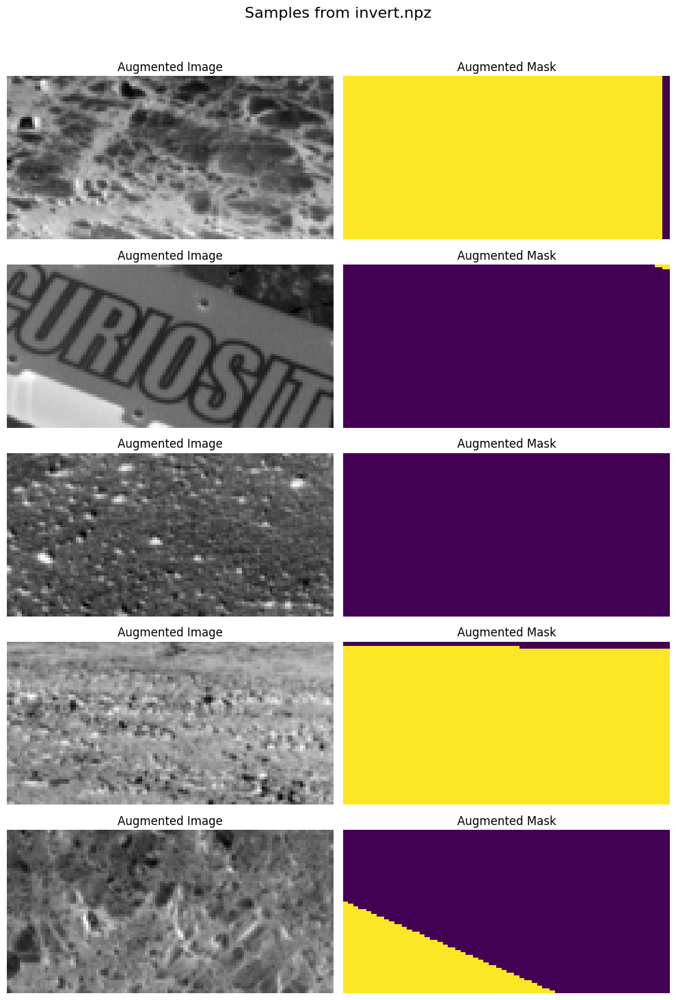

File: horizontal_flip.npz
  Key: augmented_images, Shape: (2004, 64, 128)
  Key: augmented_masks, Shape: (2004, 64, 128)


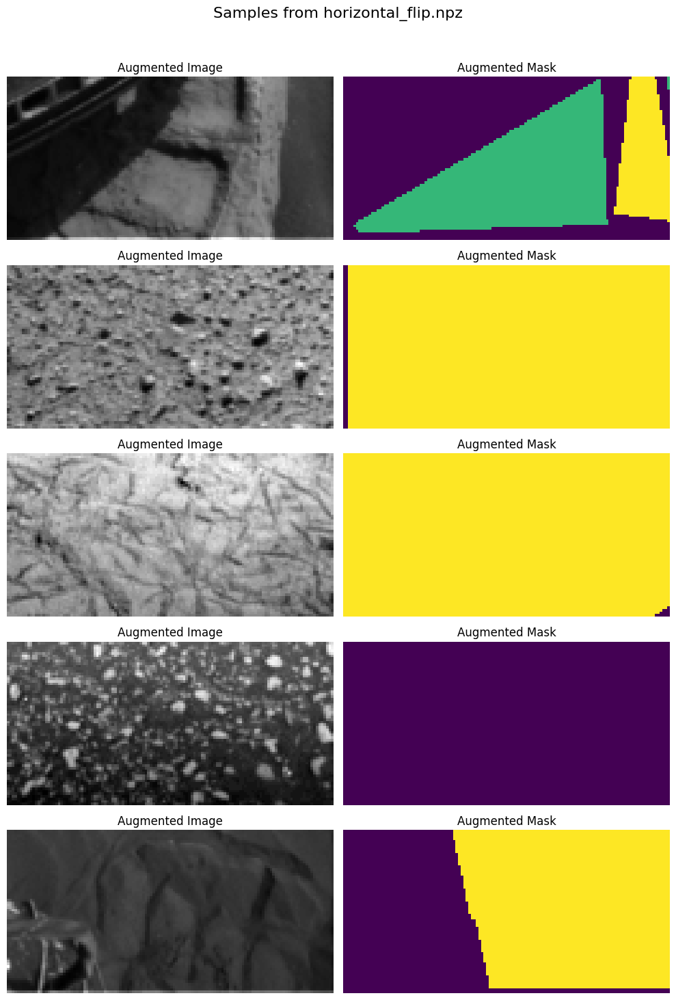

File: vertical_flip.npz
  Key: augmented_images, Shape: (2004, 64, 128)
  Key: augmented_masks, Shape: (2004, 64, 128)


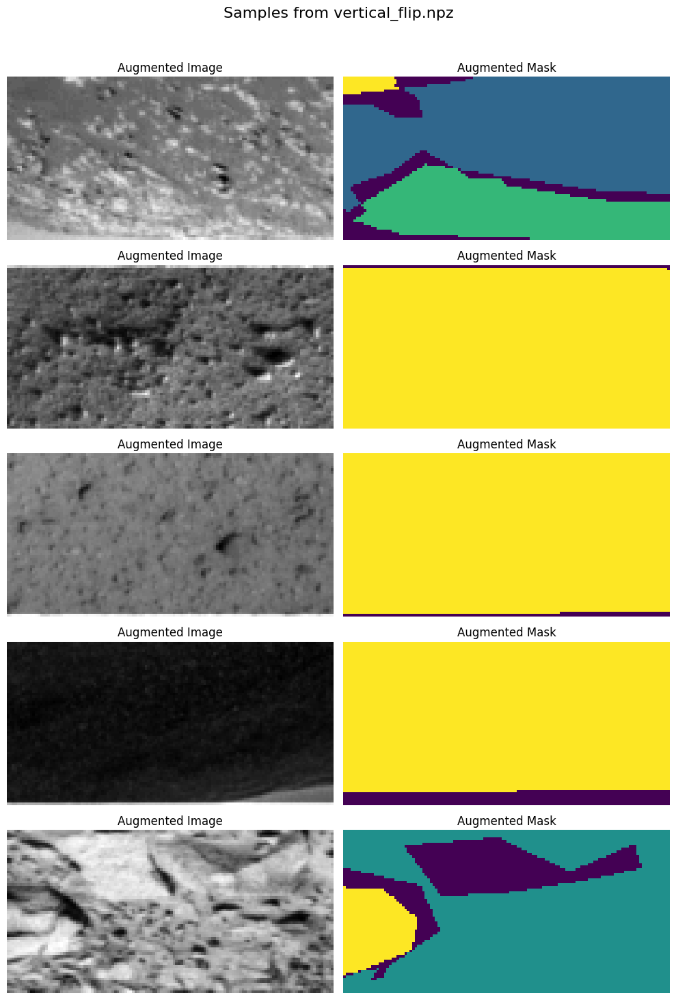

File: rotation_20°.npz
  Key: augmented_images, Shape: (2004, 64, 128)
  Key: augmented_masks, Shape: (2004, 64, 128)


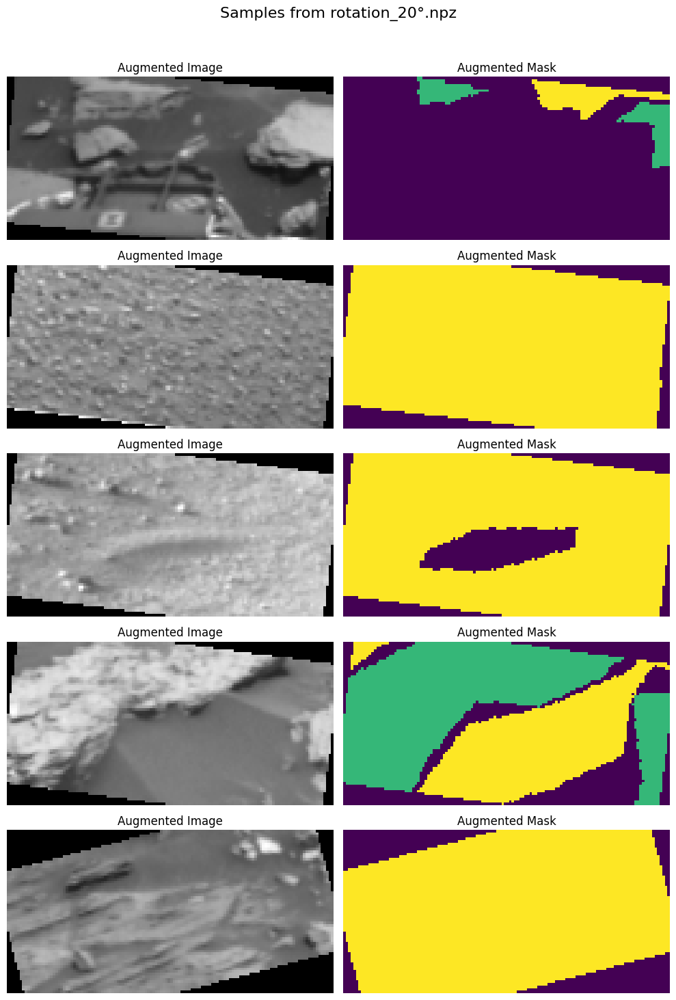

File: noise.npz
  Key: augmented_images, Shape: (2004, 64, 128)
  Key: augmented_masks, Shape: (2004, 64, 128)


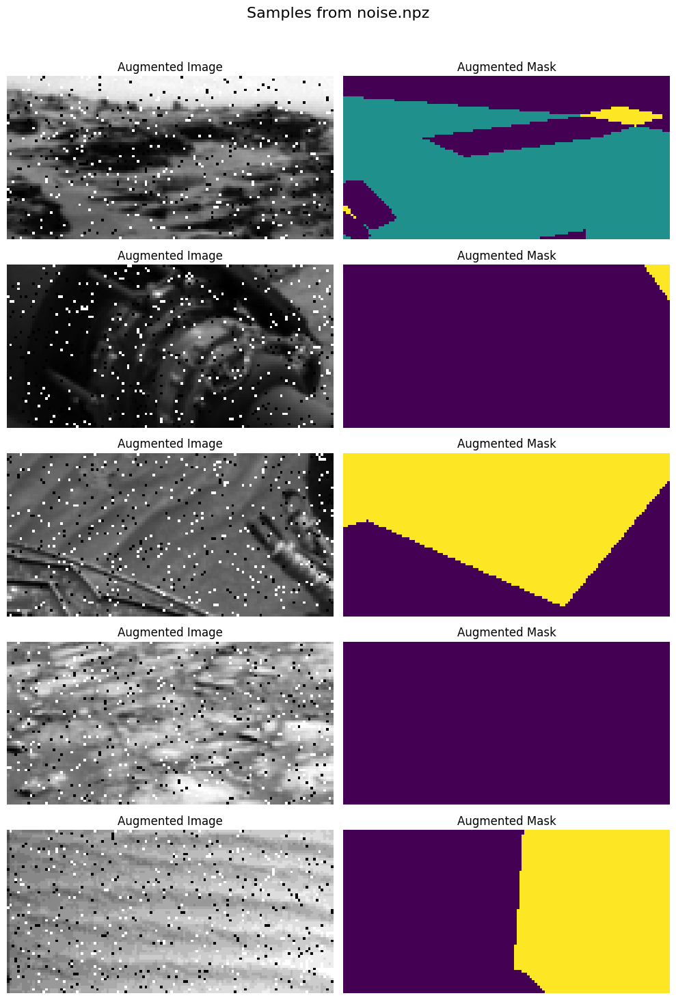

In [146]:
# Read the saved files and display details
output_dir="/kaggle/working/augmented_data"
for file_name in os.listdir(output_dir):
    if file_name.endswith(".npz"):
        file_path = os.path.join(output_dir, file_name)
        data = np.load(file_path)

        # Display keys and their shapes
        print(f"File: {file_name}")
        for key in data.keys():
            print(f"  Key: {key}, Shape: {data[key].shape}")

        # Plot 5 random images and masks
        fig, axes = plt.subplots(5, 2, figsize=(10, 15))
        fig.suptitle(f"Samples from {file_name}", fontsize=16)
        for i in range(5):
            random_idx = np.random.randint(data["augmented_images"].shape[0])
            axes[i, 0].imshow(data["augmented_images"][random_idx], cmap="gray")
            axes[i, 0].set_title("Augmented Image")
            axes[i, 0].axis("off")
            axes[i, 1].imshow(data["augmented_masks"][random_idx])
            axes[i, 1].set_title("Augmented Mask")
            axes[i, 1].axis("off")
        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()

## 🛠️ Train and Save the Model

In [147]:
# Load the rotation augmentation dataset
rotation_file_path = os.path.join("/kaggle/working/augmented_data/horizontal_flip.npz")
rotation_data = np.load(rotation_file_path)

# Extract augmented images and masks
augmented_images = rotation_data["augmented_images"]
augmented_masks = rotation_data["augmented_masks"]

# Merge with original X_train and y_train
X_train = np.concatenate([X_train, augmented_images], axis=0)
y_train = np.concatenate([y_train, augmented_masks], axis=0)

# Display the new shapes
print(f"New X_train shape: {X_train.shape}")
print(f"New y_train shape: {y_train.shape}")

New X_train shape: (4008, 64, 128)
New y_train shape: (4008, 64, 128)


In [148]:
# Load the rotation augmentation dataset
rotation_file_path = os.path.join("/kaggle/working/augmented_data/vertical_flip.npz")
rotation_data = np.load(rotation_file_path)

# Extract augmented images and masks
augmented_images = rotation_data["augmented_images"]
augmented_masks = rotation_data["augmented_masks"]

# Merge with original X_train and y_train
X_train = np.concatenate([X_train, augmented_images], axis=0)
y_train = np.concatenate([y_train, augmented_masks], axis=0)

# Display the new shapes
print(f"New X_train shape: {X_train.shape}")
print(f"New y_train shape: {y_train.shape}")

New X_train shape: (6012, 64, 128)
New y_train shape: (6012, 64, 128)


In [149]:
# Load the rotation augmentation dataset
rotation_file_path = os.path.join("/kaggle/working/augmented_data/rotation_20°.npz")
rotation_data = np.load(rotation_file_path)

# Extract augmented images and masks
augmented_images = rotation_data["augmented_images"]
augmented_masks = rotation_data["augmented_masks"]

# Merge with original X_train and y_train
X_train = np.concatenate([X_train, augmented_images], axis=0)
y_train = np.concatenate([y_train, augmented_masks], axis=0)

# Display the new shapes
print(f"New X_train shape: {X_train.shape}")
print(f"New y_train shape: {y_train.shape}")

New X_train shape: (8016, 64, 128)
New y_train shape: (8016, 64, 128)


In [150]:
# Load the rotation augmentation dataset
rotation_file_path = os.path.join("/kaggle/working/augmented_data/invert.npz")
rotation_data = np.load(rotation_file_path)

# Extract augmented images and masks
augmented_images = rotation_data["augmented_images"]
augmented_masks = rotation_data["augmented_masks"]

# Merge with original X_train and y_train
X_train = np.concatenate([X_train, augmented_images], axis=0)
y_train = np.concatenate([y_train, augmented_masks], axis=0)

# Display the new shapes
print(f"New X_train shape: {X_train.shape}")
print(f"New y_train shape: {y_train.shape}")

New X_train shape: (10020, 64, 128)
New y_train shape: (10020, 64, 128)


In [151]:
# Load the rotation augmentation dataset
rotation_file_path = os.path.join("/kaggle/working/augmented_data/noise.npz")
rotation_data = np.load(rotation_file_path)

# Extract augmented images and masks
augmented_images = rotation_data["augmented_images"]
augmented_masks = rotation_data["augmented_masks"]

# Merge with original X_train and y_train
X_train = np.concatenate([X_train, augmented_images], axis=0)
y_train = np.concatenate([y_train, augmented_masks], axis=0)

# Display the new shapes
print(f"New X_train shape: {X_train.shape}")
print(f"New y_train shape: {y_train.shape}")

New X_train shape: (12024, 64, 128)
New y_train shape: (12024, 64, 128)


## Let's find out about rare class!


total number of images 330 out of 12024 images: percentage 2.744510978043912 %
Class Percentages in Rare Class Masks:
Class 0.0: 46.82%
Class 1.0: 15.78%
Class 2.0: 15.13%
Class 3.0: 17.63%
Class 4.0: 4.64%


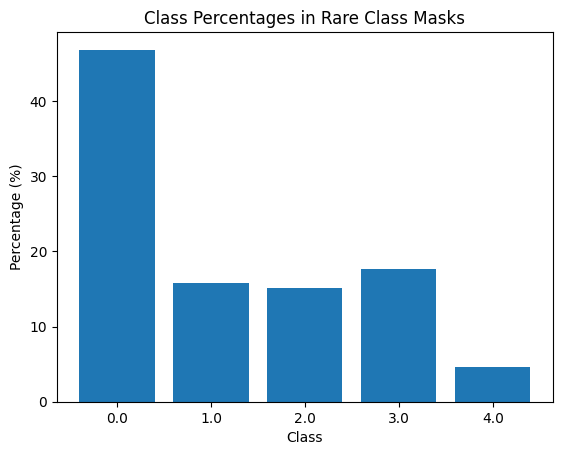

In [152]:
import numpy as np
import matplotlib.pyplot as plt



# Filter only the images with the rare class (class 4)
rare_class = 4
rare_class_indices = [i for i in range(len(y_train)) if rare_class in y_train[i]]
print("total number of images",len(rare_class_indices ),"out of",len(y_train),"images: percentage", 100*len(rare_class_indices )/len(y_train),"%")
# Extract images and masks containing the rare class
X_train_rare = X_train[rare_class_indices]
y_train_rare = y_train[rare_class_indices]

# Calculate the percentage of each class in the rare class masks
unique_classes, class_counts = np.unique(y_train_rare, return_counts=True)
total_pixels = np.sum(class_counts)
class_percentages = {cls: count / total_pixels * 100 for cls, count in zip(unique_classes, class_counts)}

# Print the percentages
print("Class Percentages in Rare Class Masks:")
for cls, pct in class_percentages.items():
    print(f"Class {cls}: {pct:.2f}%")

# Plot histogram of class percentages
plt.bar(class_percentages.keys(), class_percentages.values(), tick_label=list(class_percentages.keys()))
plt.xlabel("Class")
plt.ylabel("Percentage (%)")
plt.title("Class Percentages in Rare Class Masks")
plt.show()


Total images with rare class: 330
Minimum rare class percentage: 0.01%
Maximum rare class percentage: 33.34%
Average percentage in top 20% rare-class images: 14.63%


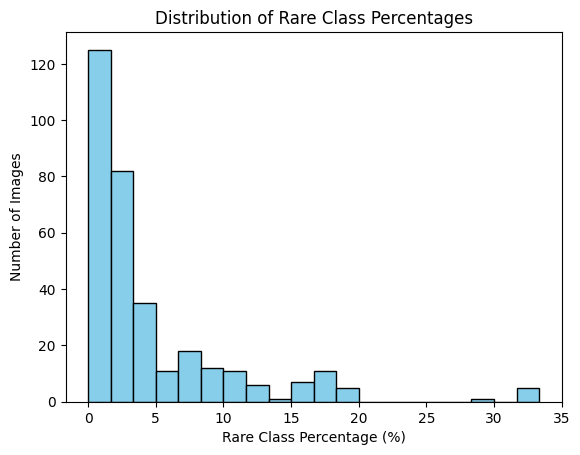

In [153]:
# Filter only the images with the rare class (class 4)
rare_class = 4
rare_class_indices = [i for i in range(len(y_train)) if rare_class in y_train[i]]

# Extract images and masks containing the rare class
X_train_rare = X_train[rare_class_indices]
y_train_rare = y_train[rare_class_indices]

# Calculate the percentage of the rare class in each mask
rare_class_percentages = [
    (np.sum(mask == rare_class) / mask.size) * 100 for mask in y_train_rare
]

# Identify images with the highest rare class percentages
sorted_indices = np.argsort(rare_class_percentages)[::-1]
top_20_percent_indices = sorted_indices[: len(sorted_indices) // 5]
top_20_percent_average = np.mean([rare_class_percentages[i] for i in top_20_percent_indices])

# Calculate min and max percentages
min_percentage = np.min(rare_class_percentages)
max_percentage = np.max(rare_class_percentages)

# Print results
print(f"Total images with rare class: {len(rare_class_indices)}")
print(f"Minimum rare class percentage: {min_percentage:.2f}%")
print(f"Maximum rare class percentage: {max_percentage:.2f}%")
print(f"Average percentage in top 20% rare-class images: {top_20_percent_average:.2f}%")

# Plot histogram of rare class percentages
plt.hist(rare_class_percentages, bins=20, color='skyblue', edgecolor='black')
plt.xlabel("Rare Class Percentage (%)")
plt.ylabel("Number of Images")
plt.title("Distribution of Rare Class Percentages")
plt.show()

Class Percentages in Rare Class Masks:
Class 0.0: 45.32%
Class 1.0: 2.83%
Class 2.0: 9.58%
Class 3.0: 32.46%
Class 4.0: 9.82%


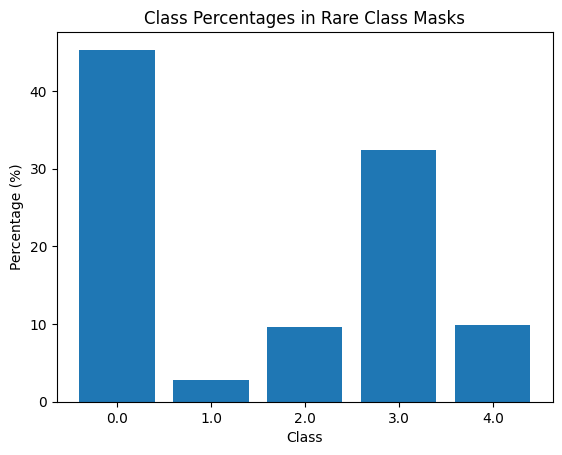

In [154]:
import numpy as np
import matplotlib.pyplot as plt


# Filter only the images with the rare class (class 4)
rare_class = 4
rare_class_indices = [i for i in range(len(y_val)) if rare_class in y_val[i]]

# Extract images and masks containing the rare class
X_val_rare = X_val[rare_class_indices]
y_val_rare = y_val[rare_class_indices]

# Calculate the percentage of each class in the rare class masks
unique_classes, class_counts = np.unique(y_val_rare, return_counts=True)
total_pixels = np.sum(class_counts)
class_percentages = {cls: count / total_pixels * 100 for cls, count in zip(unique_classes, class_counts)}

# Print the percentages
print("Class Percentages in Rare Class Masks:")
for cls, pct in class_percentages.items():
    print(f"Class {cls}: {pct:.2f}%")

# Plot histogram of class percentages
plt.bar(class_percentages.keys(), class_percentages.values(), tick_label=list(class_percentages.keys()))
plt.xlabel("Class")
plt.ylabel("Percentage (%)")
plt.title("Class Percentages in Rare Class Masks")
plt.show()


In [155]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
X_train_top_20_percent=X_train[top_20_percent_indices]
y_train_top_20_percent=y_train[top_20_percent_indices]
print(len(X_train_top_20_percent))
# Augmentation settings
data_gen_args = dict(
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode="nearest"
)
datagen = ImageDataGenerator(**data_gen_args)

# Augment rare class training images
X_train_aug = []
y_train_aug = []
for x, y in zip(X_train_top_20_percent, y_train_top_20_percent):
    x = np.expand_dims(x, axis=-1) if x.ndim == 2 else x
    for _ in range(5):  # Create 5 augmented samples per image
        augmented = next(datagen.flow(x[np.newaxis, ...], batch_size=1))
        X_train_aug.append(augmented[0])
        y_train_aug.append(y)

X_train_aug = np.array(X_train_aug)
y_train_aug = np.array(y_train_aug)

print(f"Augmented Training Set: {X_train_aug.shape}, {y_train_aug.shape}")


66
Augmented Training Set: (330, 64, 128, 1), (330, 64, 128)


total number of images 7 out of 501 images: percentage 1.3972055888223553 %

Class Percentages in Rare Class Masks (Validation):
Class 0.0: 45.32%
Class 1.0: 2.83%
Class 2.0: 9.58%
Class 3.0: 32.46%
Class 4.0: 9.82%

Rare Class Statistics in Validation Images:
Mean Percentage: 9.82%
Min Percentage: 0.45%
Max Percentage: 26.61%


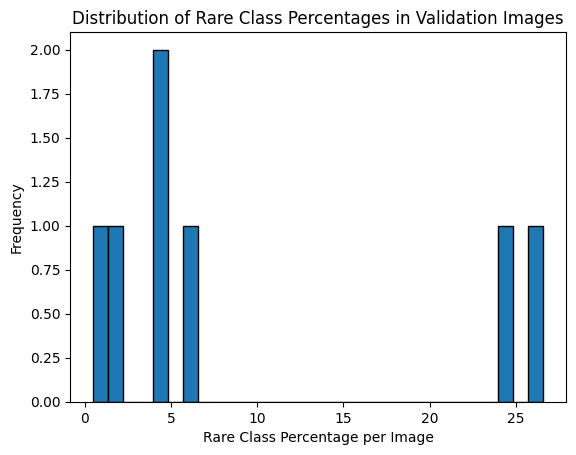

In [156]:
# Filter images with the rare class in the validation set
rare_class_value = 4  # Define the rare class value
rare_class_val_indices = [i for i in range(len(y_val)) if rare_class_value in y_val[i]]
print("total number of images",len(rare_class_val_indices ),"out of",len(y_val),"images: percentage", 100*len(rare_class_val_indices )/len(y_val),"%")
# Extract validation images and masks containing the rare class
X_val_rare = X_val[rare_class_val_indices]
y_val_rare = y_val[rare_class_val_indices]

# Calculate the percentage of each class in the rare class masks for validation
unique_classes_val, class_counts_val = np.unique(y_val_rare, return_counts=True)
total_pixels_val = np.sum(class_counts_val)
class_percentages_val = {cls: count / total_pixels_val * 100 for cls, count in zip(unique_classes_val, class_counts_val)}

# Print validation class percentages
print("\nClass Percentages in Rare Class Masks (Validation):")
for cls, pct in class_percentages_val.items():
    print(f"Class {cls}: {pct:.2f}%")

# Calculate rare class percentage per validation image
rare_class_percentages_per_image_val = [
    (np.sum(y == rare_class_value) / y.size) * 100 for y in y_val_rare
]

# Statistics on rare class percentages in validation images
mean_rare_class_val = np.mean(rare_class_percentages_per_image_val)
min_rare_class_val = np.min(rare_class_percentages_per_image_val)
max_rare_class_val = np.max(rare_class_percentages_per_image_val)

print(f"\nRare Class Statistics in Validation Images:")
print(f"Mean Percentage: {mean_rare_class_val:.2f}%")
print(f"Min Percentage: {min_rare_class_val:.2f}%")
print(f"Max Percentage: {max_rare_class_val:.2f}%")

# Sort validation images by rare class pixel count
sorted_indices_val = np.argsort(rare_class_percentages_per_image_val)[::-1]
X_val_top_20_percent = X_val_rare[sorted_indices_val[:2]]
y_val_top_20_percent = y_val_rare[sorted_indices_val[:2]]

# Plot histogram for validation rare class percentages
plt.hist(rare_class_percentages_per_image_val, bins=30, edgecolor="black")
plt.xlabel("Rare Class Percentage per Image")
plt.ylabel("Frequency")
plt.title("Distribution of Rare Class Percentages in Validation Images")
plt.show()

Train set: (2004, 64, 128), (2004, 64, 128)
Validation set: (501, 64, 128), (501, 64, 128)
Class Percentages in Rare Class Masks:
Class 0.0: 45.93%
Class 1.0: 16.05%
Class 2.0: 15.49%
Class 3.0: 17.89%
Class 4.0: 4.65%


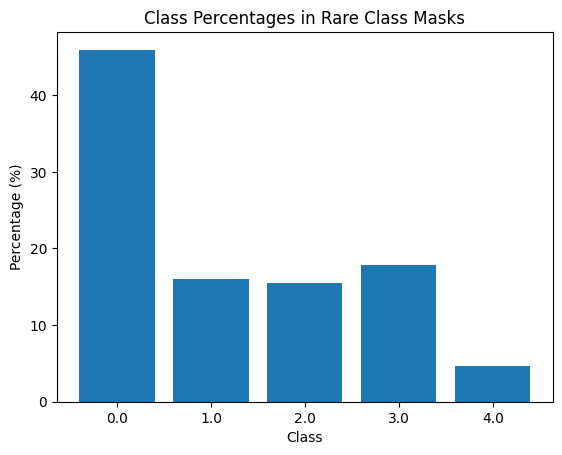

In [157]:
# before aug
from sklearn.model_selection import train_test_split
import numpy as np
data = np.load("/kaggle/input/normal2/cleaned_data.npz")

X_train_before_aug = data["training_set_filtered"]

y_train_before_aug = data["masks_filtered"]


# Perform train-validation split (80-20 split)
X_train_before_aug, X_val_before_aug, y_train_before_aug, y_val_before_aug = train_test_split(
    X_train_before_aug, y_train_before_aug, test_size=0.2, random_state=42
)

print(f"Train set: {X_train_before_aug.shape}, {y_train_before_aug.shape}")
print(f"Validation set: {X_val_before_aug.shape}, {y_val_before_aug.shape}")

# Filter only the images with the rare class (class 4)
rare_class = 4
rare_class_indices = [i for i in range(len(y_train_before_aug)) if rare_class in y_train_before_aug[i]]

# Extract images and masks containing the rare class
X_train_rare = X_train_before_aug[rare_class_indices]
y_train_rare = y_train_before_aug[rare_class_indices]

# Calculate the percentage of each class in the rare class masks
unique_classes, class_counts = np.unique(y_train_rare, return_counts=True)
total_pixels = np.sum(class_counts)
class_percentages = {cls: count / total_pixels * 100 for cls, count in zip(unique_classes, class_counts)}

# Print the percentages
print("Class Percentages in Rare Class Masks:")
for cls, pct in class_percentages.items():
    print(f"Class {cls}: {pct:.2f}%")

# Plot histogram of class percentages
plt.bar(class_percentages.keys(), class_percentages.values(), tick_label=list(class_percentages.keys()))
plt.xlabel("Class")
plt.ylabel("Percentage (%)")
plt.title("Class Percentages in Rare Class Masks")
plt.show()

## Normalization


In [158]:
# Add color channel and rescale pixels between 0 and 1
X_train = X_train[..., np.newaxis] / 255.0
X_test = X_test[..., np.newaxis] / 255.0

input_shape = X_train.shape[1:]
num_classes = len(np.unique(y_train))

print(f"Input shape: {input_shape}")
print(f"Number of classes: {num_classes}")

Input shape: (64, 128, 1)
Number of classes: 5


In [159]:
X_val = X_val[..., np.newaxis] / 255.0

In [160]:
print(f"X_train shape: {X_train.shape}")
print(f"X_val shape: {X_val.shape}")
print(f"y_train shape: {y_train.shape}")

X_train shape: (12024, 64, 128, 1)
X_val shape: (501, 64, 128, 1)
y_train shape: (12024, 64, 128)


In [161]:
# Custom callback for visualization
class VisualizeSegmentationCallback(tf.keras.callbacks.Callback):
    def __init__(self, X_train, y_train, num_images=2):
        super().__init__()
        self.X_train = X_train
        self.y_train = y_train
        self.num_images = num_images
        self.selected_indices = []

        # Identify images containing at least 4 classes
        for i in range(len(y_train)):
            if len(np.unique(y_train[i])) >= 4:  # Check for at least 4 classes
                self.selected_indices.append(i)
            if len(self.selected_indices) == num_images:
                break

    def on_epoch_end(self, epoch, logs=None):
        # Plot predictions for the selected images
        fig, axes = plt.subplots(self.num_images, 3, figsize=(15, self.num_images * 5))

        for idx, i in enumerate(self.selected_indices):
            # Extract image and ground truth
            X_sample = self.X_train[i:i + 1]  # Add batch dimension
            y_sample = self.y_train[i]

            # Predict on the image
            predicted_mask = self.model.predict(X_sample)
            predicted_mask = np.argmax(predicted_mask, axis=-1)[0]  # Convert to class labels

            # Visualize the input, ground truth, and predicted mask
            axes[idx, 0].imshow(X_sample[0].squeeze(), cmap="gray")
            axes[idx, 0].set_title("Input Image")
            axes[idx, 0].axis("off")

            axes[idx, 1].imshow(y_sample, cmap="viridis",vmin=0,vmax=4)
            axes[idx, 1].set_title("Ground Truth Mask")
            axes[idx, 1].axis("off")

            axes[idx, 2].imshow(predicted_mask, cmap="viridis",vmin=0,vmax=4)
            axes[idx, 2].set_title(f"Predicted Mask (Epoch {epoch + 1})")
            axes[idx, 2].axis("off")

        plt.tight_layout()
        plt.show()

## Adding advanced tecnics

In [162]:
# Ensure the input shape for both images and masks is correct
X_train = np.squeeze(X_train)  # Remove any singleton dimensions
y_train = np.squeeze(y_train)  # Remove any singleton dimensions

# Check if the channel dimension exists, otherwise add it
if X_train.ndim == 3:  # If missing the channel dimension, add it
    X_train = X_train[..., np.newaxis]

if y_train.ndim == 3:  # Ensure y_train has the correct shape
    y_train = y_train[..., np.newaxis]

print(f"Shape of X_train after reshaping: {X_train.shape}")
print(f"Shape of y_train after reshaping: {y_train.shape}")

Shape of X_train after reshaping: (12024, 64, 128, 1)
Shape of y_train after reshaping: (12024, 64, 128, 1)


In [163]:
# Ensure the input shape for both images and masks is correct
X_val = np.squeeze(X_val)  # Remove any singleton dimensions
y_val= np.squeeze(y_val)  # Remove any singleton dimensions

# Check if the channel dimension exists, otherwise add it
if X_val.ndim == 3:  # If missing the channel dimension, add it
    X_val = X_val[..., np.newaxis]

if y_val.ndim == 3:  # Ensure y_train has the correct shape
    y_val = y_val[..., np.newaxis]

print(f"Shape of X_train after reshaping: {X_val.shape}")
print(f"Shape of y_train after reshaping: {y_val.shape}")

Shape of X_train after reshaping: (501, 64, 128, 1)
Shape of y_train after reshaping: (501, 64, 128, 1)


In [164]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

# Ensure the input shape for both images and masks is correct
X_train = np.squeeze(X_train)  # Remove singleton dimensions
if X_train.ndim == 3:  # If missing the channel dimension, add it
    X_train = X_train[..., np.newaxis]

y_train = np.squeeze(y_train)  # Ensure that y_train has the correct shape

print(f"Shape of X_train after reshaping: {X_train.shape}")
print(f"Shape of y_train after reshaping: {y_train.shape}")

# Convert y_train to integers for class count
y_train_int = y_train.astype(np.int32)

# Calculate class weights based on pixel proportions
class_pixel_counts = np.bincount(y_train_int.flatten(), minlength=num_classes)  # Count pixels for each class
total_pixels = np.sum(class_pixel_counts)  # Total number of pixels
class_weights = total_pixels / (class_pixel_counts + 1e-6)  # Inverse frequency
class_weights /= np.sum(class_weights)  # Normalize to sum to 1

print(f"Class pixel counts: {class_pixel_counts}")
print(f"Calculated class weights: {class_weights}")

# Updated EarlyStopping with min_delta to ignore minimal improvements
early_stopping = EarlyStopping(
    monitor="val_loss",  # Monitor loss instead of validation loss
    patience=30,
    restore_best_weights=True,
    min_delta=1e-4  # Minimum change to qualify as an improvement
)


model_checkpoint = ModelCheckpoint(
    filepath="best_model.keras",
    monitor="val_loss",  # Monitor loss instead of validation loss
    save_best_only=True,
    mode="min",
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor="val_loss",  # Monitor loss instead of validation loss
    factor=0.5,
    patience=5,
    verbose=1,
    mode="min",
    min_lr=1e-6
)

# Visualization Callback for Two Images with At Least 4 Classes
visualize_callback = VisualizeSegmentationCallback(X_val, y_val, num_images=2)




Shape of X_train after reshaping: (12024, 64, 128, 1)
Shape of y_train after reshaping: (12024, 64, 128)
Class pixel counts: [25080450 32652638 23178115 17464095   125310]
Calculated class weights: [0.00489157 0.00375721 0.00529304 0.00702485 0.97903334]


In [165]:
# Define custom Mean Intersection Over Union metric
class MeanIntersectionOverUnion(tf.keras.metrics.MeanIoU):
    def __init__(self, num_classes, labels_to_exclude=None, name="mean_iou", dtype=None):
        super(MeanIntersectionOverUnion, self).__init__(num_classes=num_classes, name=name, dtype=dtype)
        if labels_to_exclude is None:
            labels_to_exclude = [0]  # Default to excluding label 0
        self.labels_to_exclude = labels_to_exclude

    def update_state(self, y_true, y_pred, sample_weight=None):
        # Convert predictions to class labels
        y_pred = tf.math.argmax(y_pred, axis=-1)

        # Flatten the tensors
        y_true = tf.reshape(y_true, [-1])
        y_pred = tf.reshape(y_pred, [-1])

        # Apply mask to exclude specified labels
        for label in self.labels_to_exclude:
            mask = tf.not_equal(y_true, label)
            y_true = tf.boolean_mask(y_true, mask)
            y_pred = tf.boolean_mask(y_pred, mask)

        # Update the state
        return super().update_state(y_true, y_pred, sample_weight)

In [166]:
from tensorflow.keras.callbacks import Callback
class SaveBestMeanIoU(Callback):
    def __init__(self, filepath, monitor="val_mean_io_u", mode="max", verbose=1):
        super(SaveBestMeanIoU, self).__init__()
        self.filepath = filepath
        self.monitor = monitor
        self.mode = mode
        self.verbose = verbose
        self.best = -float("inf") if mode == "max" else float("inf")

    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}
        # Debug: Print available keys in logs
        print(f"Available log keys: {logs.keys()}")
        
        # Use the correct log key
        current = logs.get(self.monitor)
        if current is None:
            if self.verbose > 0:
                print(f"Warning: Monitor '{self.monitor}' is not available in logs.")
            return

        if (self.mode == "max" and current > self.best) or (self.mode == "min" and current < self.best):
            self.best = current
            if self.verbose > 0:
                print(f"Epoch {epoch + 1}: {self.monitor} improved to {current:.4f}, saving model.")
            self.model.save(self.filepath)


Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 64, 128,   │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_50 (Conv2D)  │ (None, 64, 128,   │        640 │ input_layer_2[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 64, 128,   │        128 │ conv2d_50[0][0]   │
│ (LayerNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_28       │ (None, 64, 128,   │          0 │ layer_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_51 (Conv2D)  │ (None, 64, 128,   │     36,928 │ activation_28[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 64, 128,   │        128 │ conv2d_51[0][0]   │
│ (LayerNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_29       │ (None, 64, 128,   │          0 │ layer_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_52 (Conv2D)  │ (None, 64, 128,   │        128 │ input_layer_2[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_20 (Add)        │ (None, 64, 128,   │          0 │ activation_29[0]… │
│                     │ 64)               │            │ conv2d_52[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_6     │ (None, 32, 64,    │          0 │ add_20[0][0]      │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_53 (Conv2D)  │ (None, 32, 64,    │     73,856 │ max_pooling2d_6[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 32, 64,    │        256 │ conv2d_53[0][0]   │
│ (LayerNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_30       │ (None, 32, 64,    │          0 │ layer_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_54 (Conv2D)  │ (None, 32, 64,    │    147,584 │ activation_30[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 32, 64,    │        256 │ conv2d_54[0][0]   │
│ (LayerNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_31       │ (None, 32, 64,    │          0 │ layer_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_55 (Conv2D)  │ (None, 32, 64,    │      8,320 │ max_pooling2d_6[

 Total params: 7,359,941 (28.08 MB)

 Trainable params: 7,359,941 (28.08 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - accuracy: 0.3577 - loss: 0.8523 - mean_iou: 0.1465Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 1: val_mean_iou improved to 0.3042, saving model.

Epoch 1: val_loss improved from inf to 0.79871, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


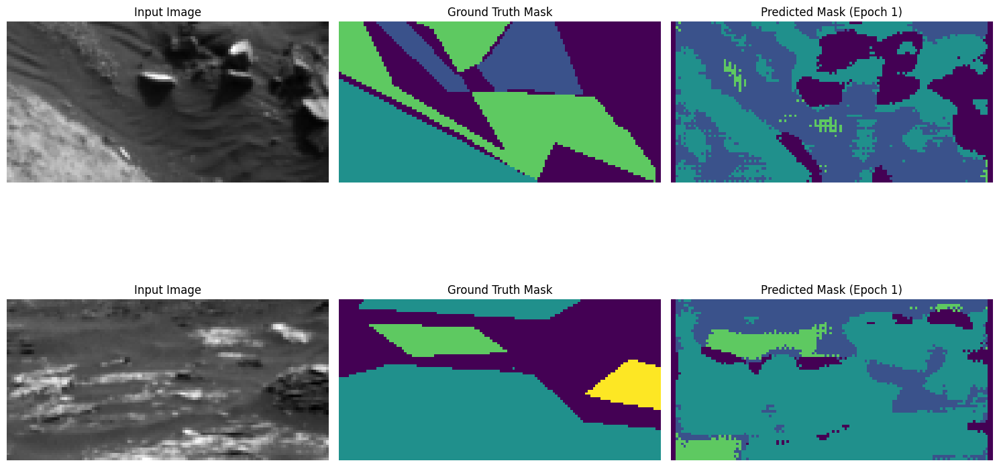

376/376 ━━━━━━━━━━━━━━━━━━━━ 123s 278ms/step - accuracy: 0.3579 - loss: 0.8523 - mean_iou: 0.1466 - val_accuracy: 0.5528 - val_loss: 0.7987 - val_mean_iou: 0.3042 - learning_rate: 1.0000e-04
Epoch 2/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - accuracy: 0.5227 - loss: 0.8024 - mean_iou: 0.2655Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 2: val_mean_iou improved to 0.3370, saving model.

Epoch 2: val_loss improved from 0.79871 to 0.77924, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


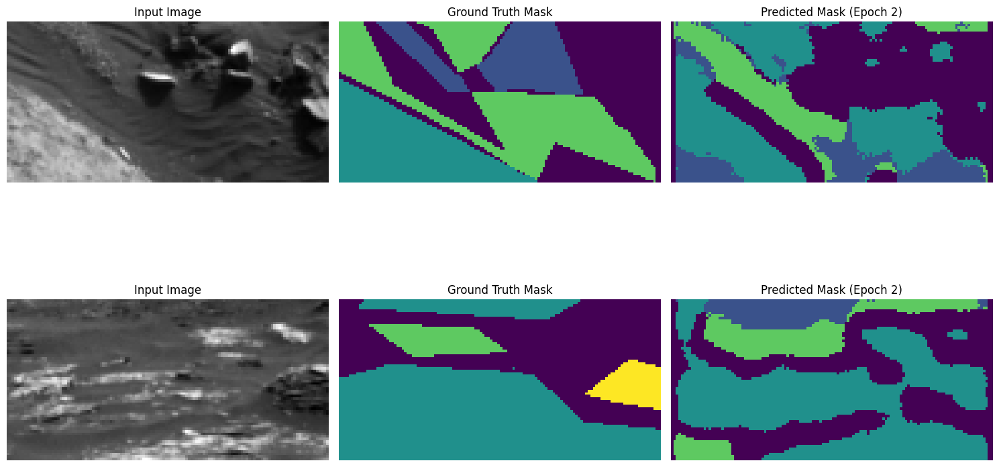

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 237ms/step - accuracy: 0.5227 - loss: 0.8024 - mean_iou: 0.2655 - val_accuracy: 0.6145 - val_loss: 0.7792 - val_mean_iou: 0.3370 - learning_rate: 1.0000e-04
Epoch 3/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - accuracy: 0.5796 - loss: 0.7851 - mean_iou: 0.3055Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 3: val_mean_iou improved to 0.3643, saving model.

Epoch 3: val_loss improved from 0.77924 to 0.76999, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


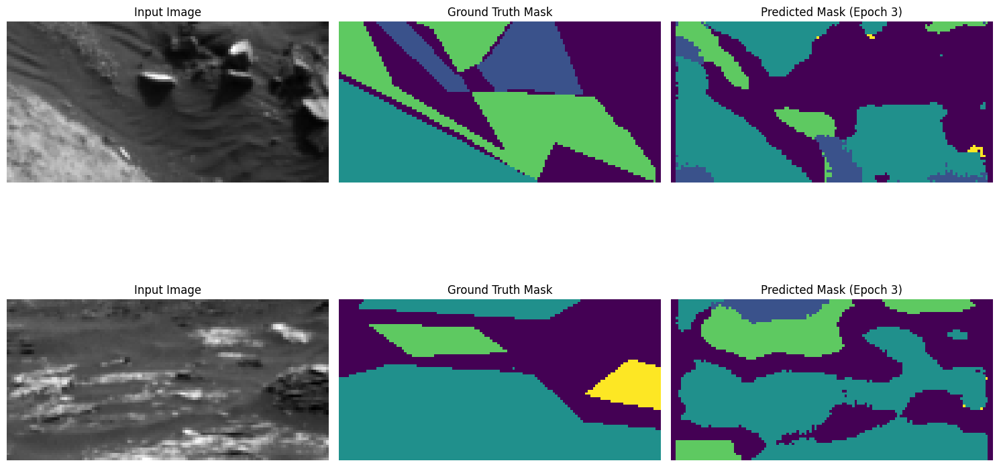

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 237ms/step - accuracy: 0.5797 - loss: 0.7851 - mean_iou: 0.3055 - val_accuracy: 0.6461 - val_loss: 0.7700 - val_mean_iou: 0.3643 - learning_rate: 1.0000e-04
Epoch 4/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - accuracy: 0.6107 - loss: 0.7753 - mean_iou: 0.3295Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 4: val_mean_iou improved to 0.3879, saving model.

Epoch 4: val_loss improved from 0.76999 to 0.76597, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


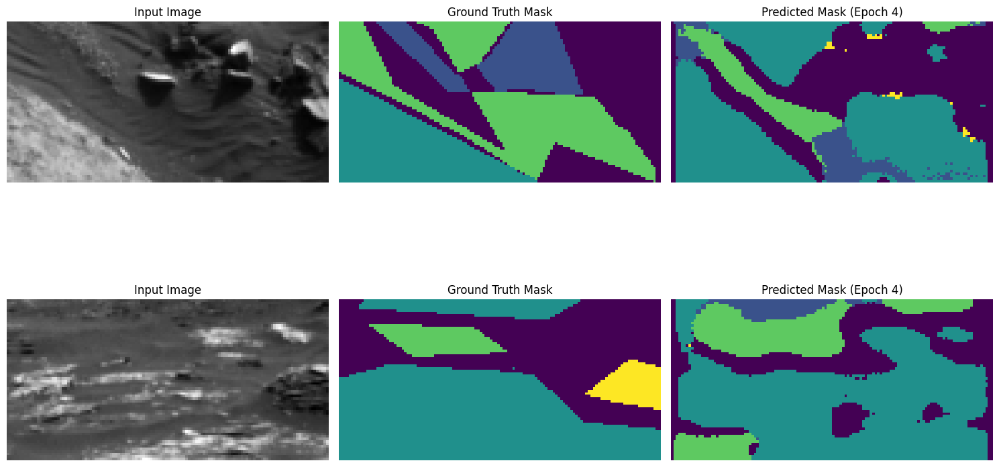

376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 238ms/step - accuracy: 0.6107 - loss: 0.7753 - mean_iou: 0.3295 - val_accuracy: 0.6586 - val_loss: 0.7660 - val_mean_iou: 0.3879 - learning_rate: 1.0000e-04
Epoch 5/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - accuracy: 0.6312 - loss: 0.7685 - mean_iou: 0.3453Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 5: val_loss improved from 0.76597 to 0.76340, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


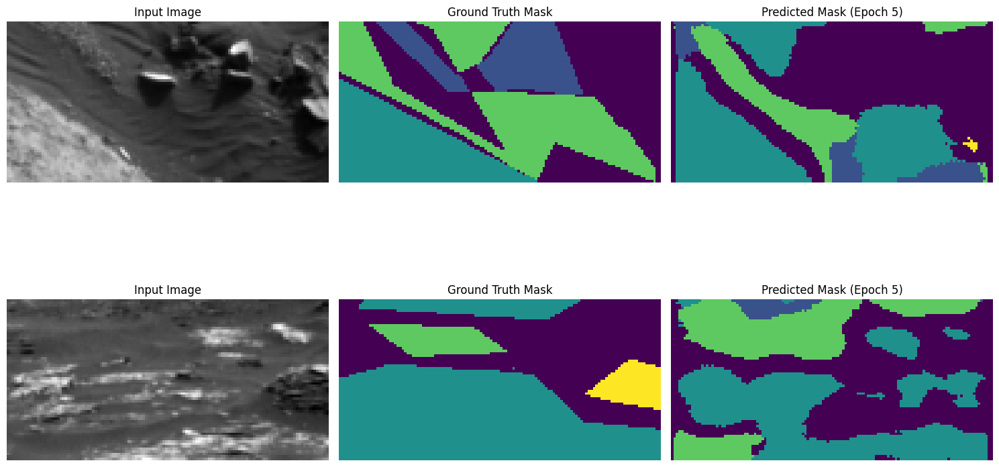

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 237ms/step - accuracy: 0.6313 - loss: 0.7685 - mean_iou: 0.3453 - val_accuracy: 0.6703 - val_loss: 0.7634 - val_mean_iou: 0.3848 - learning_rate: 1.0000e-04
Epoch 6/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - accuracy: 0.6458 - loss: 0.7639 - mean_iou: 0.3580Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 6: val_mean_iou improved to 0.3921, saving model.

Epoch 6: val_loss improved from 0.76340 to 0.76035, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


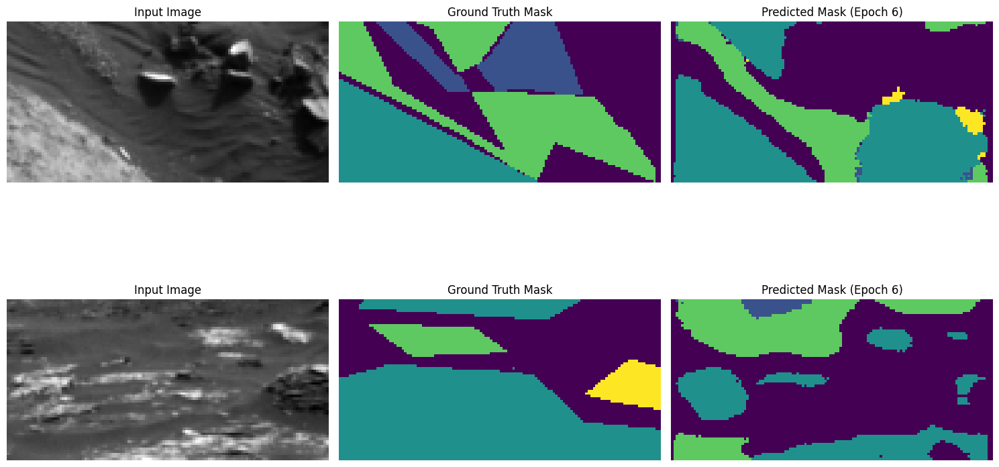

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 238ms/step - accuracy: 0.6458 - loss: 0.7638 - mean_iou: 0.3580 - val_accuracy: 0.6801 - val_loss: 0.7604 - val_mean_iou: 0.3921 - learning_rate: 1.0000e-04
Epoch 7/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - accuracy: 0.6570 - loss: 0.7600 - mean_iou: 0.3670Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 7: val_mean_iou improved to 0.3975, saving model.

Epoch 7: val_loss improved from 0.76035 to 0.75845, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


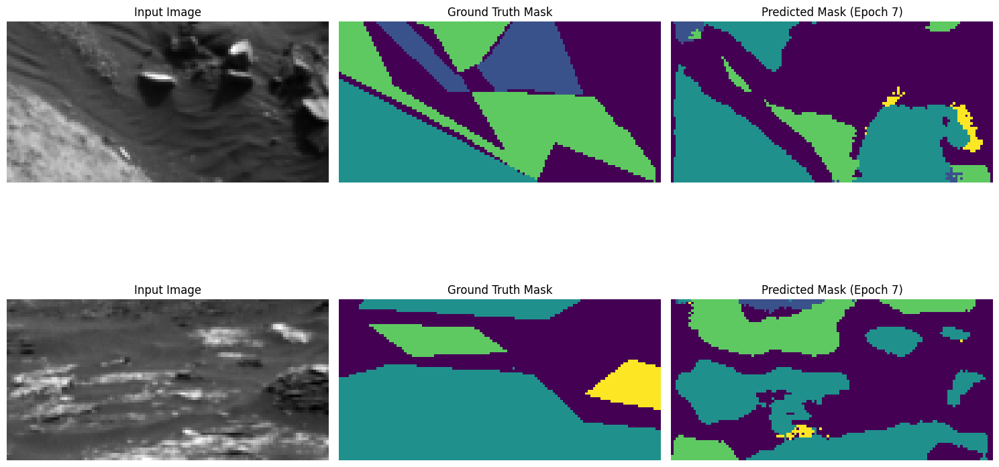

376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 238ms/step - accuracy: 0.6570 - loss: 0.7600 - mean_iou: 0.3670 - val_accuracy: 0.6923 - val_loss: 0.7585 - val_mean_iou: 0.3975 - learning_rate: 1.0000e-04
Epoch 8/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - accuracy: 0.6717 - loss: 0.7548 - mean_iou: 0.3803Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 8: val_mean_iou improved to 0.4038, saving model.

Epoch 8: val_loss did not improve from 0.75845
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


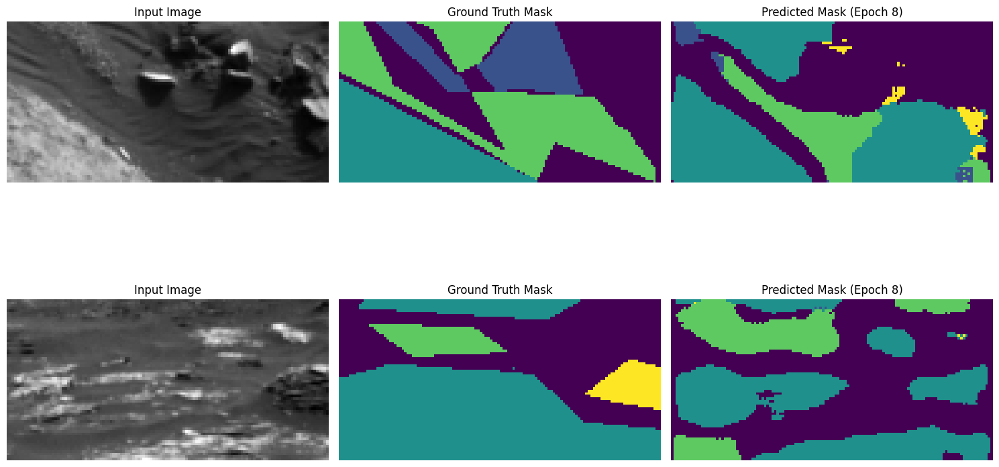

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 237ms/step - accuracy: 0.6717 - loss: 0.7548 - mean_iou: 0.3802 - val_accuracy: 0.6896 - val_loss: 0.7585 - val_mean_iou: 0.4038 - learning_rate: 1.0000e-04
Epoch 9/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - accuracy: 0.6823 - loss: 0.7515 - mean_iou: 0.3907Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 9: val_mean_iou improved to 0.4217, saving model.

Epoch 9: val_loss improved from 0.75845 to 0.75176, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


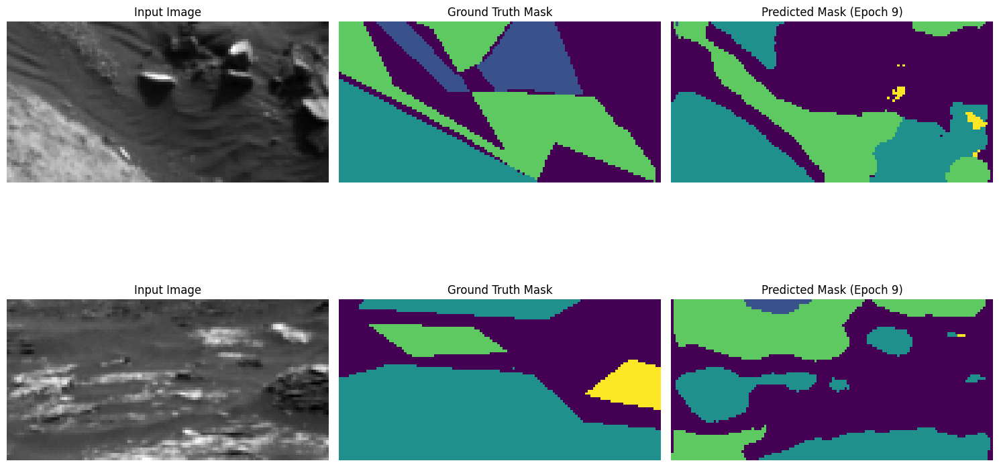

376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 239ms/step - accuracy: 0.6824 - loss: 0.7515 - mean_iou: 0.3907 - val_accuracy: 0.7072 - val_loss: 0.7518 - val_mean_iou: 0.4217 - learning_rate: 1.0000e-04
Epoch 10/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - accuracy: 0.6881 - loss: 0.7489 - mean_iou: 0.3955Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 10: val_loss did not improve from 0.75176
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


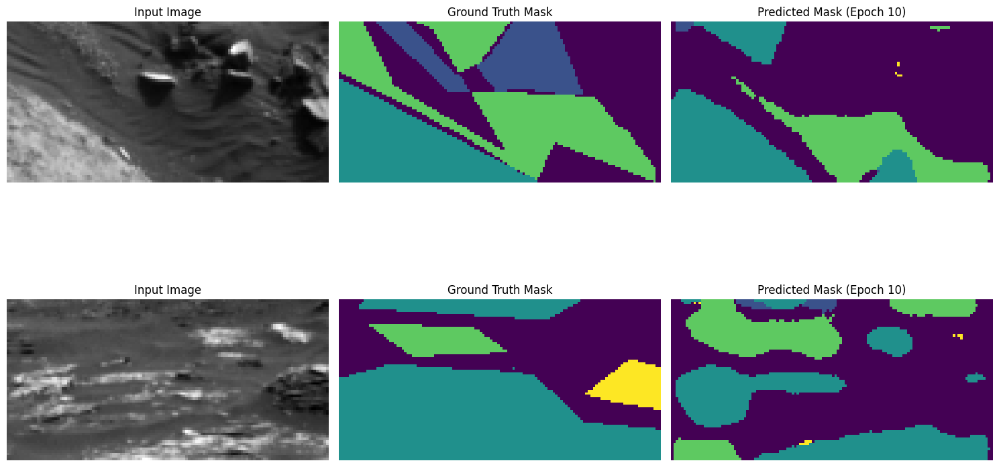

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 236ms/step - accuracy: 0.6881 - loss: 0.7489 - mean_iou: 0.3955 - val_accuracy: 0.7146 - val_loss: 0.7524 - val_mean_iou: 0.4172 - learning_rate: 1.0000e-04
Epoch 11/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - accuracy: 0.6976 - loss: 0.7453 - mean_iou: 0.4064Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 11: val_mean_iou improved to 0.4289, saving model.

Epoch 11: val_loss improved from 0.75176 to 0.74900, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


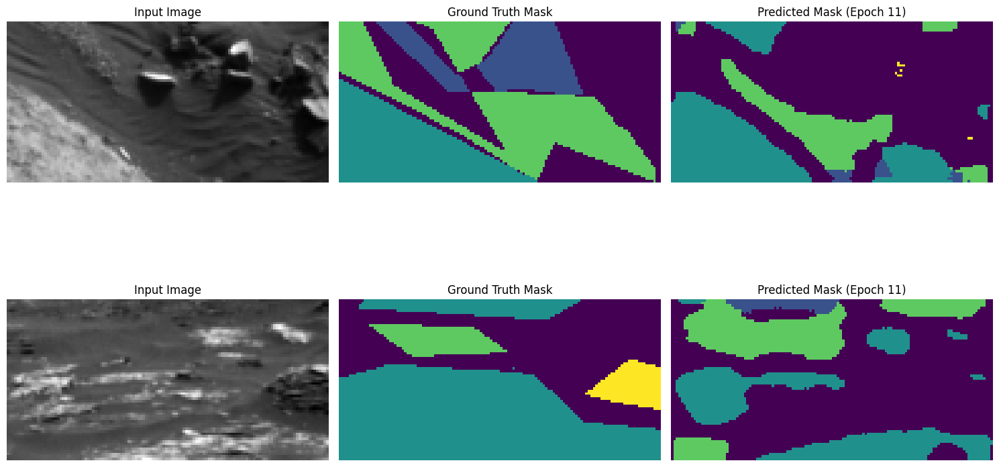

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 234ms/step - accuracy: 0.6976 - loss: 0.7453 - mean_iou: 0.4064 - val_accuracy: 0.7157 - val_loss: 0.7490 - val_mean_iou: 0.4289 - learning_rate: 1.0000e-04
Epoch 12/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - accuracy: 0.7057 - loss: 0.7416 - mean_iou: 0.4145Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 12: val_mean_iou improved to 0.4386, saving model.

Epoch 12: val_loss improved from 0.74900 to 0.74723, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


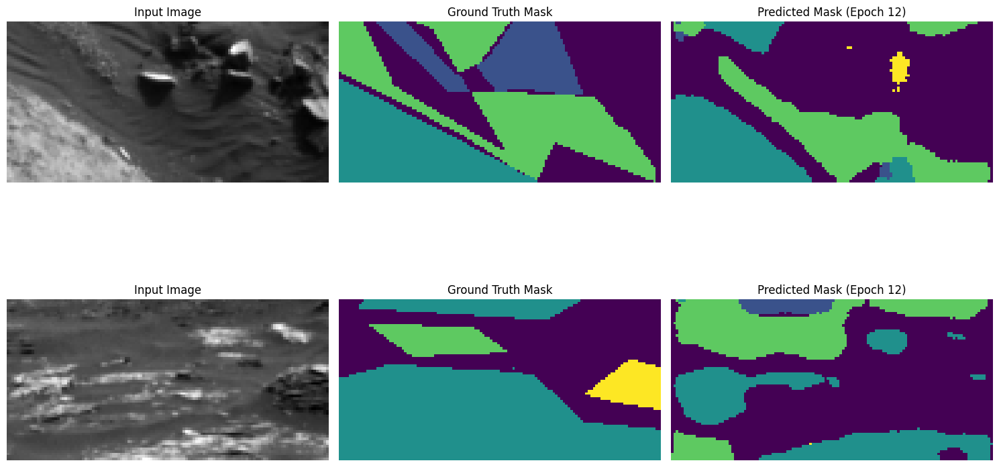

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 237ms/step - accuracy: 0.7057 - loss: 0.7416 - mean_iou: 0.4144 - val_accuracy: 0.7223 - val_loss: 0.7472 - val_mean_iou: 0.4386 - learning_rate: 1.0000e-04
Epoch 13/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - accuracy: 0.7091 - loss: 0.7401 - mean_iou: 0.4231Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 13: val_loss did not improve from 0.74723
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


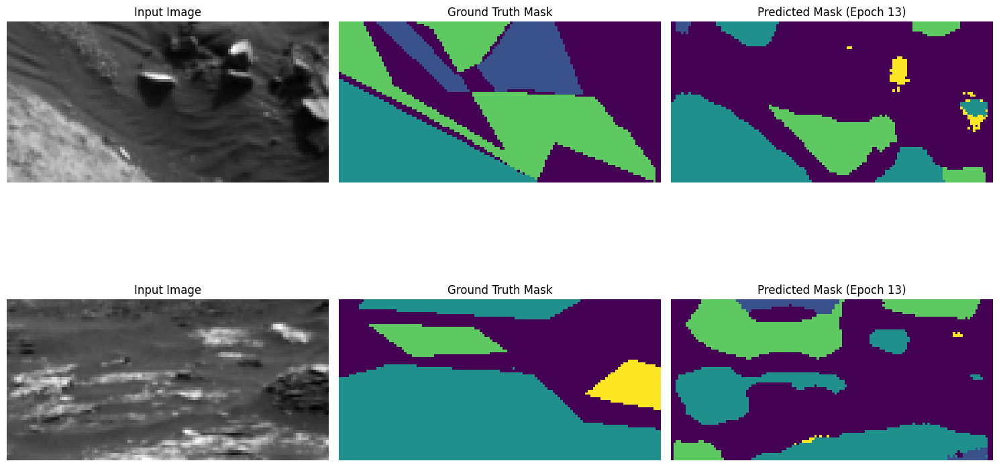

376/376 ━━━━━━━━━━━━━━━━━━━━ 87s 232ms/step - accuracy: 0.7091 - loss: 0.7401 - mean_iou: 0.4231 - val_accuracy: 0.7248 - val_loss: 0.7480 - val_mean_iou: 0.4342 - learning_rate: 1.0000e-04
Epoch 14/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - accuracy: 0.7129 - loss: 0.7378 - mean_iou: 0.4251Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 14: val_mean_iou improved to 0.4469, saving model.

Epoch 14: val_loss improved from 0.74723 to 0.74558, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


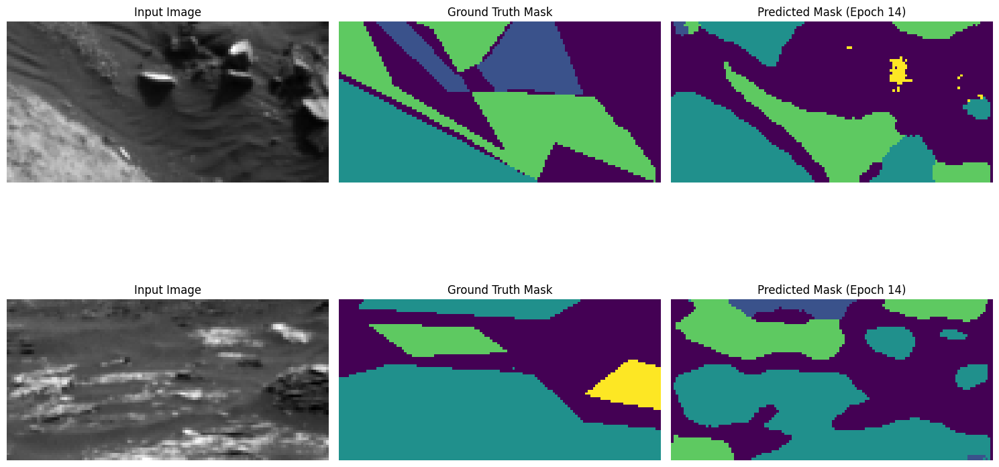

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 236ms/step - accuracy: 0.7129 - loss: 0.7378 - mean_iou: 0.4251 - val_accuracy: 0.7304 - val_loss: 0.7456 - val_mean_iou: 0.4469 - learning_rate: 1.0000e-04
Epoch 15/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - accuracy: 0.7218 - loss: 0.7346 - mean_iou: 0.4344Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 15: val_mean_iou improved to 0.4535, saving model.

Epoch 15: val_loss improved from 0.74558 to 0.74460, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


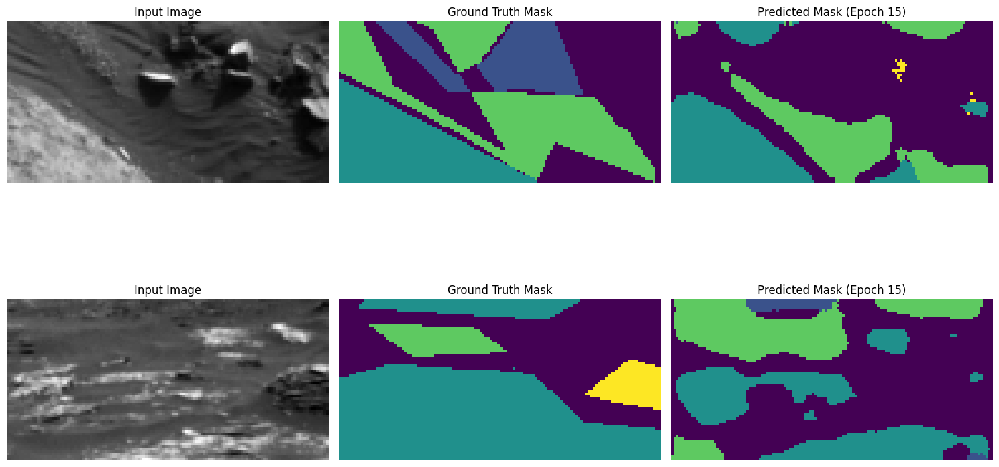

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 235ms/step - accuracy: 0.7218 - loss: 0.7346 - mean_iou: 0.4344 - val_accuracy: 0.7344 - val_loss: 0.7446 - val_mean_iou: 0.4535 - learning_rate: 1.0000e-04
Epoch 16/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - accuracy: 0.7259 - loss: 0.7320 - mean_iou: 0.4430Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 16: val_loss improved from 0.74460 to 0.74295, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


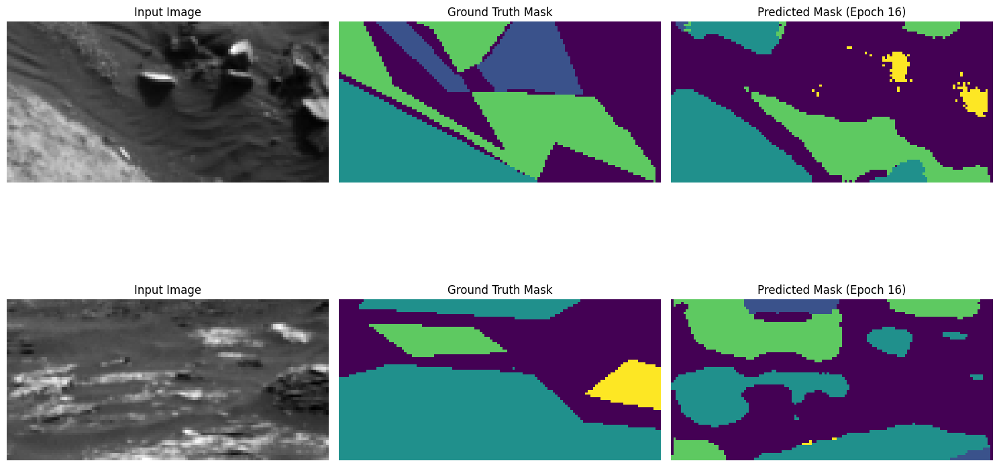

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 235ms/step - accuracy: 0.7259 - loss: 0.7320 - mean_iou: 0.4430 - val_accuracy: 0.7332 - val_loss: 0.7429 - val_mean_iou: 0.4435 - learning_rate: 1.0000e-04
Epoch 17/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - accuracy: 0.7287 - loss: 0.7255 - mean_iou: 0.4445Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 17: val_loss did not improve from 0.74295
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


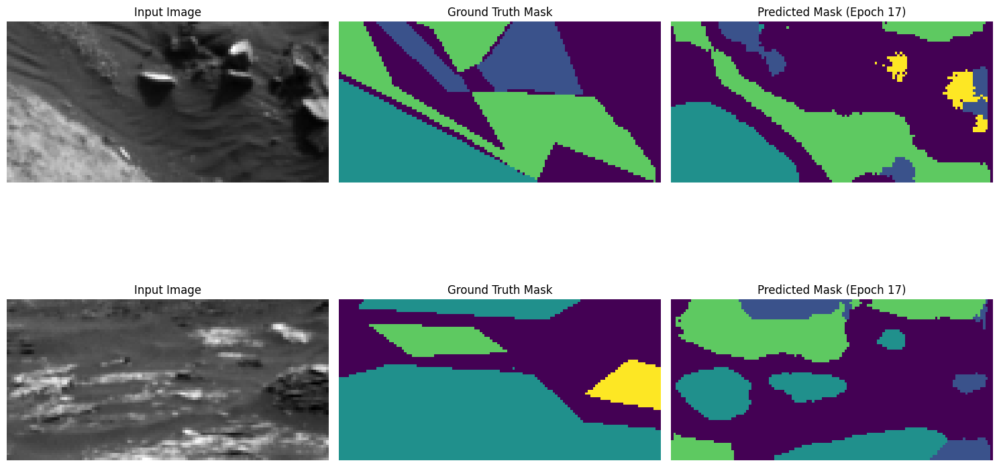

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 235ms/step - accuracy: 0.7287 - loss: 0.7255 - mean_iou: 0.4444 - val_accuracy: 0.6811 - val_loss: 0.7469 - val_mean_iou: 0.3880 - learning_rate: 1.0000e-04
Epoch 18/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - accuracy: 0.7135 - loss: 0.7266 - mean_iou: 0.4276Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 18: val_loss improved from 0.74295 to 0.73078, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


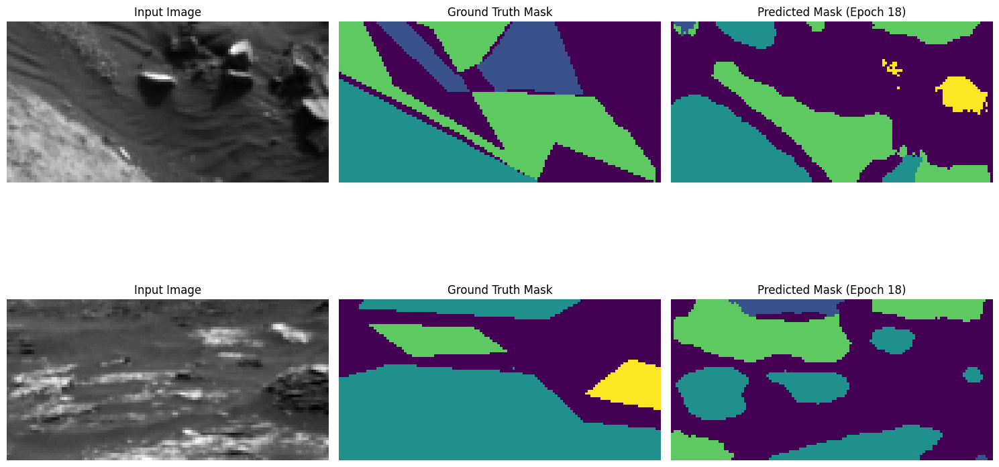

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 237ms/step - accuracy: 0.7135 - loss: 0.7266 - mean_iou: 0.4276 - val_accuracy: 0.7370 - val_loss: 0.7308 - val_mean_iou: 0.4472 - learning_rate: 1.0000e-04
Epoch 19/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - accuracy: 0.7249 - loss: 0.7228 - mean_iou: 0.4365Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 19: val_loss did not improve from 0.73078
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


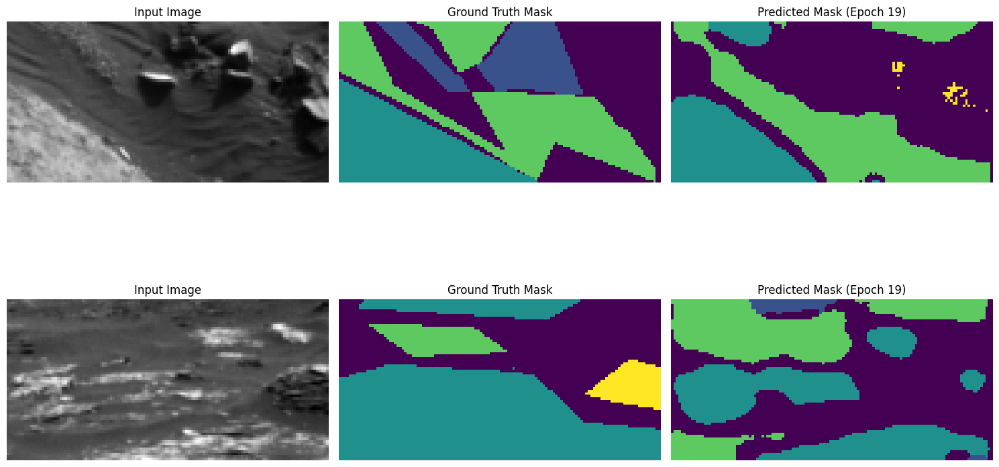

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 234ms/step - accuracy: 0.7249 - loss: 0.7227 - mean_iou: 0.4365 - val_accuracy: 0.7074 - val_loss: 0.7379 - val_mean_iou: 0.4114 - learning_rate: 1.0000e-04
Epoch 20/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - accuracy: 0.7263 - loss: 0.7213 - mean_iou: 0.4419Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 20: val_loss did not improve from 0.73078
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


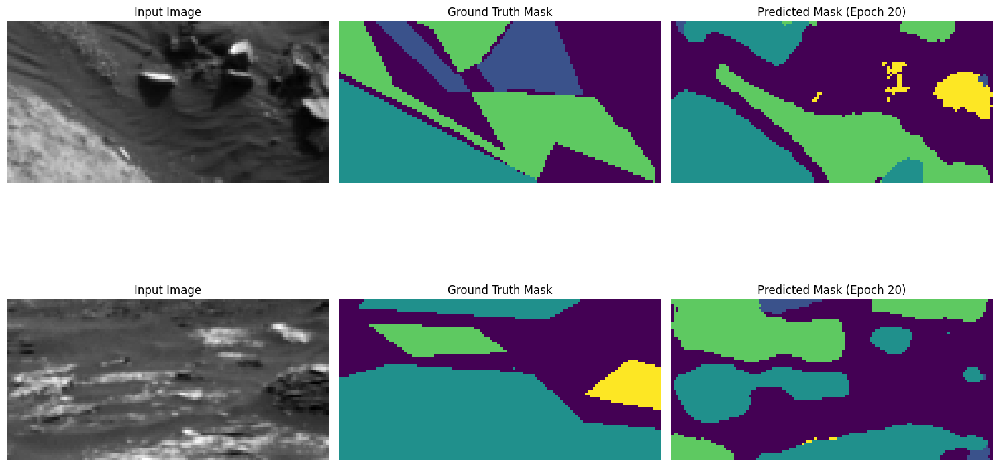

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 235ms/step - accuracy: 0.7264 - loss: 0.7213 - mean_iou: 0.4419 - val_accuracy: 0.7347 - val_loss: 0.7321 - val_mean_iou: 0.4501 - learning_rate: 1.0000e-04
Epoch 21/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - accuracy: 0.7319 - loss: 0.7178 - mean_iou: 0.4476Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 21: val_loss did not improve from 0.73078
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


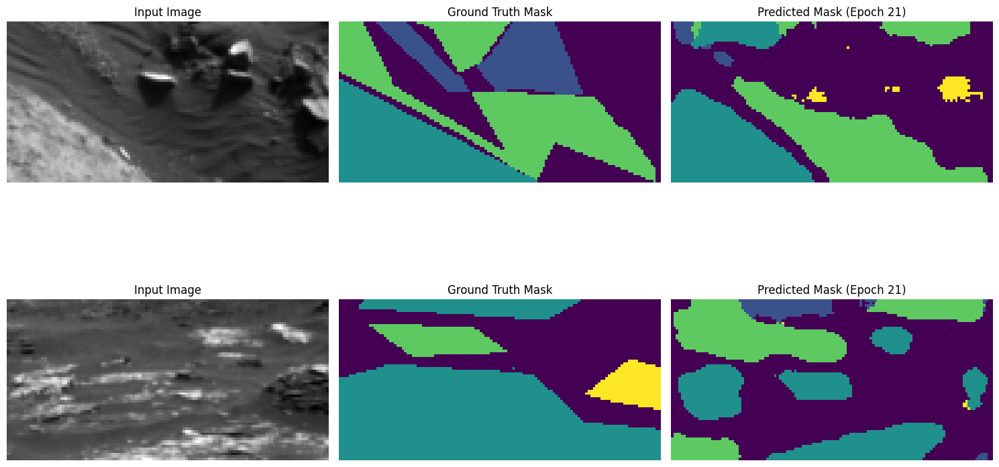

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 234ms/step - accuracy: 0.7319 - loss: 0.7178 - mean_iou: 0.4476 - val_accuracy: 0.7327 - val_loss: 0.7320 - val_mean_iou: 0.4459 - learning_rate: 1.0000e-04
Epoch 22/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - accuracy: 0.7310 - loss: 0.7182 - mean_iou: 0.4447Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 22: val_loss did not improve from 0.73078
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


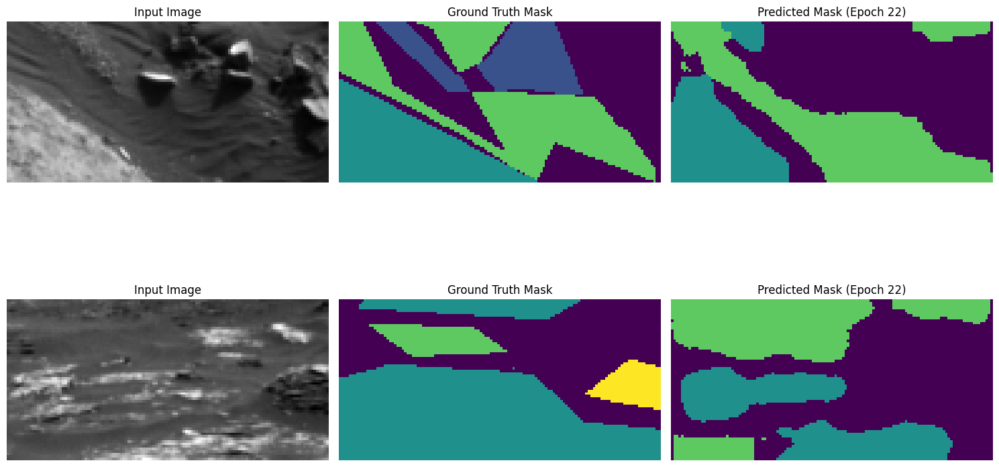

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 235ms/step - accuracy: 0.7310 - loss: 0.7182 - mean_iou: 0.4447 - val_accuracy: 0.6909 - val_loss: 0.7435 - val_mean_iou: 0.3772 - learning_rate: 1.0000e-04
Epoch 23/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - accuracy: 0.7208 - loss: 0.7151 - mean_iou: 0.4352Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 23: val_loss improved from 0.73078 to 0.72136, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


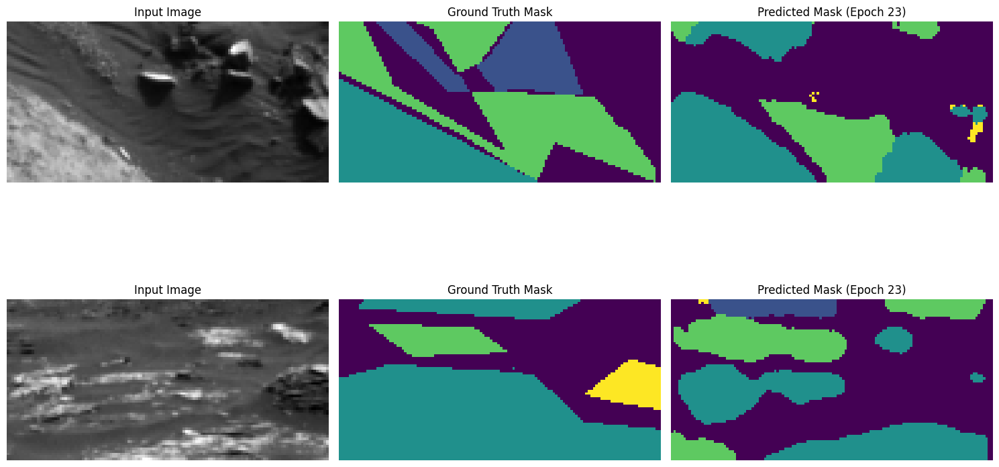

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 235ms/step - accuracy: 0.7208 - loss: 0.7151 - mean_iou: 0.4352 - val_accuracy: 0.7405 - val_loss: 0.7214 - val_mean_iou: 0.4512 - learning_rate: 1.0000e-04
Epoch 24/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - accuracy: 0.7251 - loss: 0.7054 - mean_iou: 0.4410Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 24: val_loss improved from 0.72136 to 0.70745, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


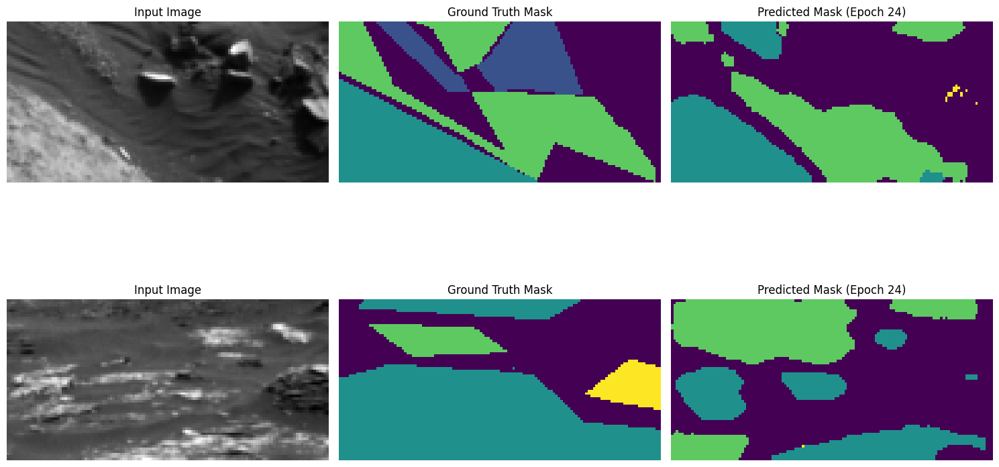

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 236ms/step - accuracy: 0.7251 - loss: 0.7053 - mean_iou: 0.4410 - val_accuracy: 0.7314 - val_loss: 0.7075 - val_mean_iou: 0.4371 - learning_rate: 1.0000e-04
Epoch 25/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - accuracy: 0.6935 - loss: 0.7095 - mean_iou: 0.4013Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 25: val_mean_iou improved to 0.4554, saving model.

Epoch 25: val_loss improved from 0.70745 to 0.70686, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


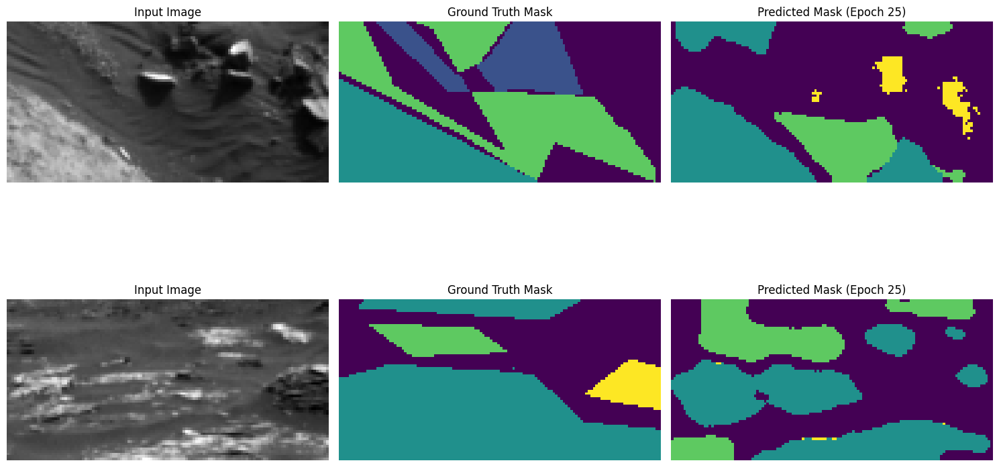

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 237ms/step - accuracy: 0.6935 - loss: 0.7095 - mean_iou: 0.4012 - val_accuracy: 0.7356 - val_loss: 0.7069 - val_mean_iou: 0.4554 - learning_rate: 1.0000e-04
Epoch 26/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - accuracy: 0.7157 - loss: 0.7024 - mean_iou: 0.4283Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 26: val_mean_iou improved to 0.4685, saving model.

Epoch 26: val_loss improved from 0.70686 to 0.70079, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


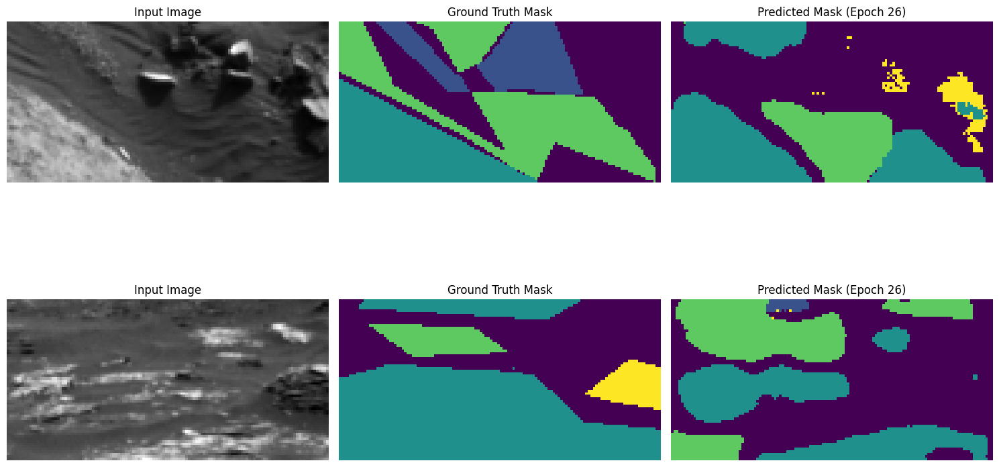

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 237ms/step - accuracy: 0.7157 - loss: 0.7024 - mean_iou: 0.4283 - val_accuracy: 0.7469 - val_loss: 0.7008 - val_mean_iou: 0.4685 - learning_rate: 1.0000e-04
Epoch 27/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - accuracy: 0.7164 - loss: 0.6991 - mean_iou: 0.4301Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 27: val_loss did not improve from 0.70079
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


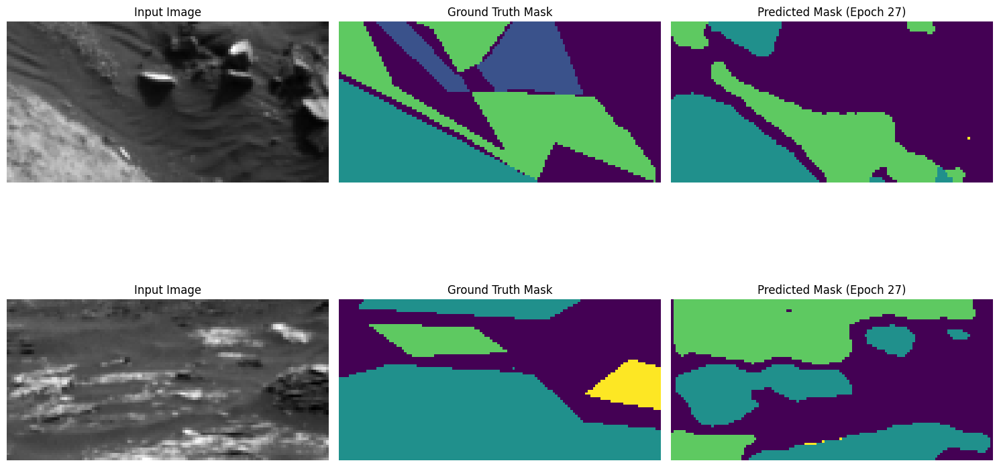

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 235ms/step - accuracy: 0.7164 - loss: 0.6991 - mean_iou: 0.4300 - val_accuracy: 0.7315 - val_loss: 0.7058 - val_mean_iou: 0.4430 - learning_rate: 1.0000e-04
Epoch 28/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - accuracy: 0.7029 - loss: 0.7048 - mean_iou: 0.4177Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 28: val_loss did not improve from 0.70079
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


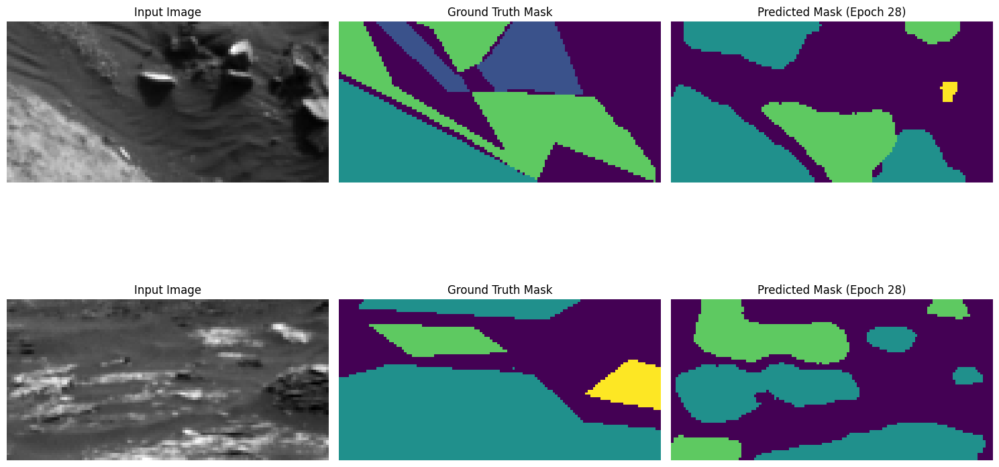

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 233ms/step - accuracy: 0.7029 - loss: 0.7047 - mean_iou: 0.4177 - val_accuracy: 0.7364 - val_loss: 0.7064 - val_mean_iou: 0.4527 - learning_rate: 1.0000e-04
Epoch 29/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - accuracy: 0.7286 - loss: 0.6950 - mean_iou: 0.4484Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 29: val_loss did not improve from 0.70079
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


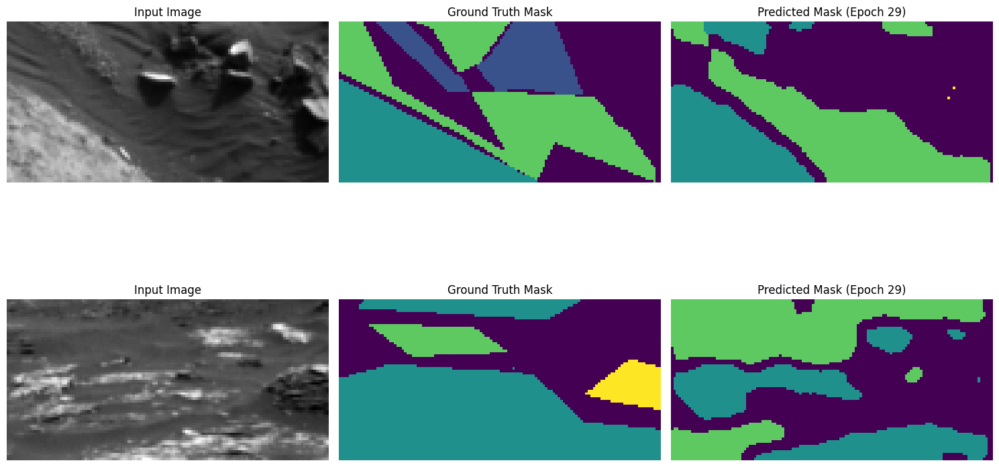

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 235ms/step - accuracy: 0.7286 - loss: 0.6950 - mean_iou: 0.4484 - val_accuracy: 0.7385 - val_loss: 0.7033 - val_mean_iou: 0.4643 - learning_rate: 1.0000e-04
Epoch 30/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - accuracy: 0.7119 - loss: 0.7006 - mean_iou: 0.4285Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 30: val_loss did not improve from 0.70079
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


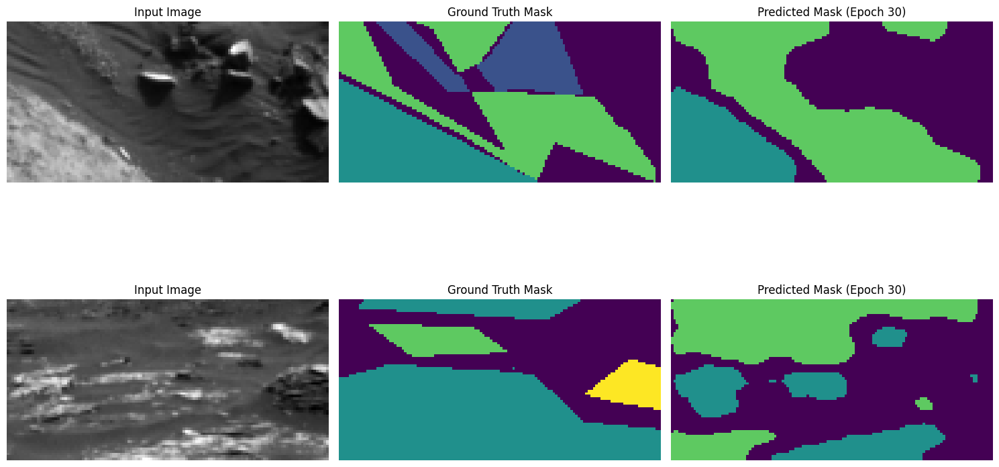

376/376 ━━━━━━━━━━━━━━━━━━━━ 87s 232ms/step - accuracy: 0.7119 - loss: 0.7006 - mean_iou: 0.4284 - val_accuracy: 0.7216 - val_loss: 0.7111 - val_mean_iou: 0.4275 - learning_rate: 1.0000e-04
Epoch 31/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - accuracy: 0.6990 - loss: 0.7073 - mean_iou: 0.4164Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 31: val_loss did not improve from 0.70079

Epoch 31: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


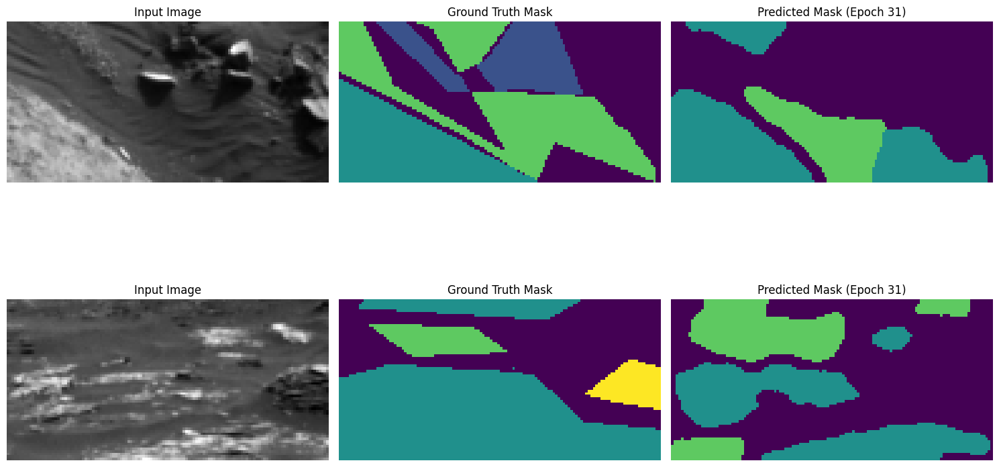

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 235ms/step - accuracy: 0.6991 - loss: 0.7073 - mean_iou: 0.4164 - val_accuracy: 0.7407 - val_loss: 0.7055 - val_mean_iou: 0.4509 - learning_rate: 1.0000e-04
Epoch 32/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - accuracy: 0.7257 - loss: 0.6935 - mean_iou: 0.4482Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 32: val_mean_iou improved to 0.4741, saving model.

Epoch 32: val_loss improved from 0.70079 to 0.69961, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


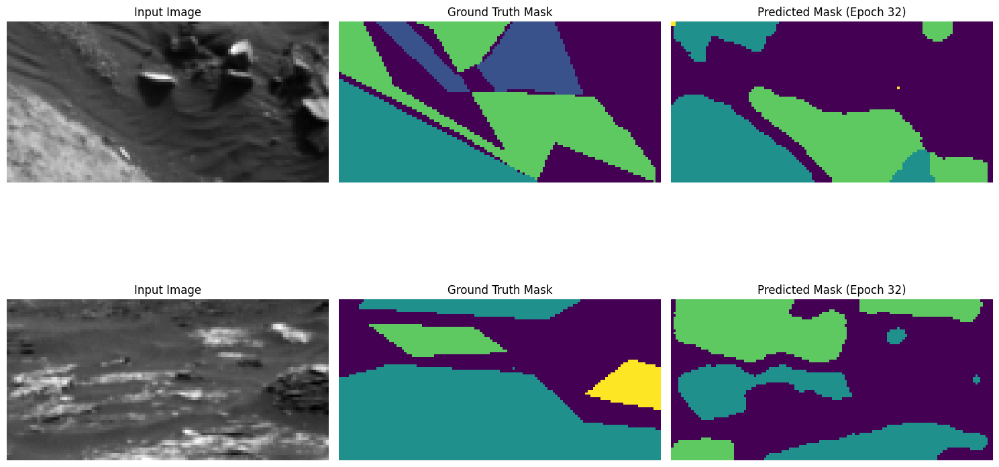

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 238ms/step - accuracy: 0.7257 - loss: 0.6935 - mean_iou: 0.4482 - val_accuracy: 0.7537 - val_loss: 0.6996 - val_mean_iou: 0.4741 - learning_rate: 5.0000e-05
Epoch 33/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - accuracy: 0.7387 - loss: 0.6880 - mean_iou: 0.4624Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 33: val_loss did not improve from 0.69961
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


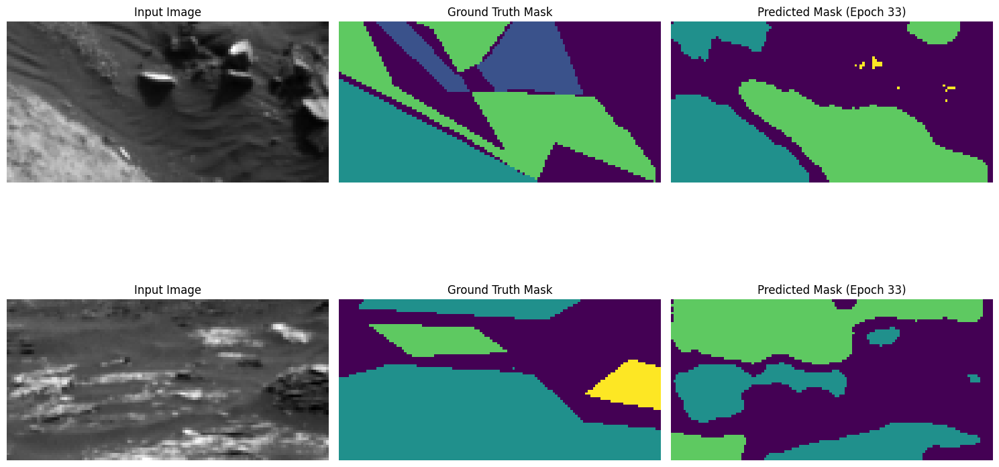

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 234ms/step - accuracy: 0.7387 - loss: 0.6880 - mean_iou: 0.4623 - val_accuracy: 0.7553 - val_loss: 0.7001 - val_mean_iou: 0.4739 - learning_rate: 5.0000e-05
Epoch 34/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - accuracy: 0.7442 - loss: 0.6849 - mean_iou: 0.4693Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 34: val_loss did not improve from 0.69961
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


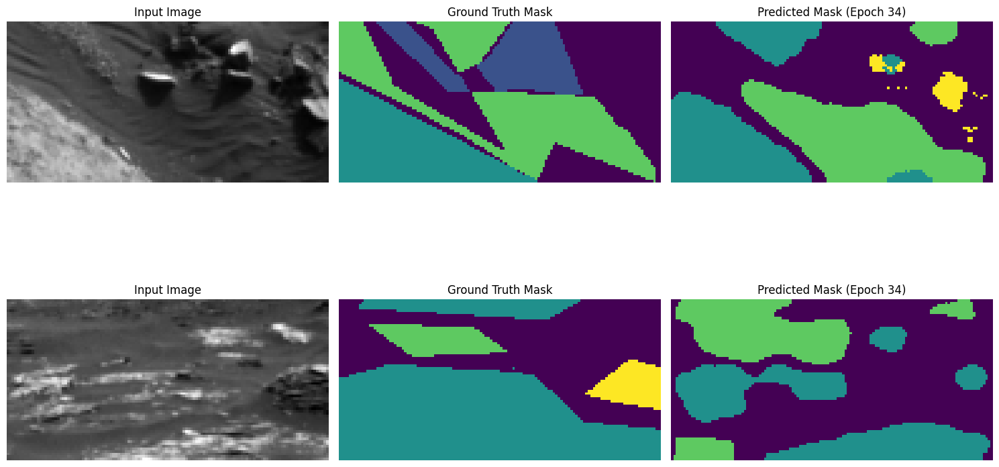

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 235ms/step - accuracy: 0.7442 - loss: 0.6849 - mean_iou: 0.4692 - val_accuracy: 0.7327 - val_loss: 0.7053 - val_mean_iou: 0.4380 - learning_rate: 5.0000e-05
Epoch 35/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - accuracy: 0.7519 - loss: 0.6812 - mean_iou: 0.4768Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 35: val_mean_iou improved to 0.4866, saving model.

Epoch 35: val_loss improved from 0.69961 to 0.69651, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


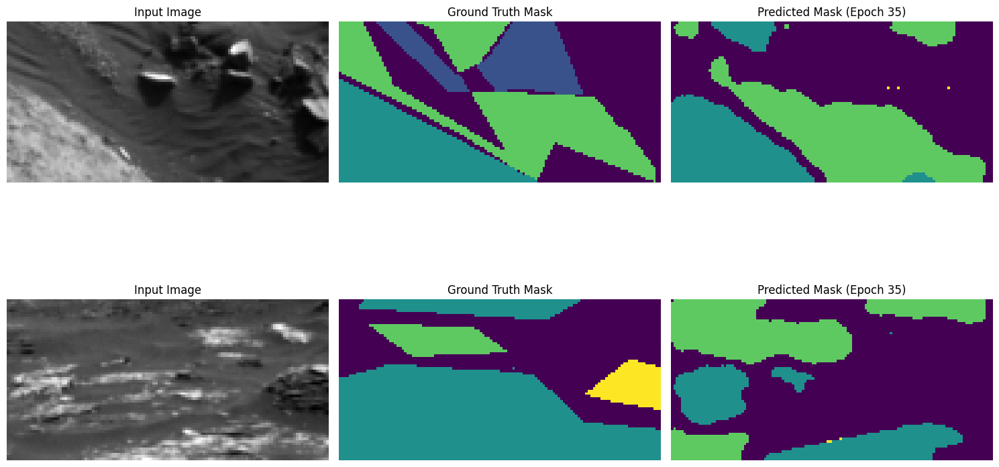

376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 238ms/step - accuracy: 0.7519 - loss: 0.6812 - mean_iou: 0.4768 - val_accuracy: 0.7595 - val_loss: 0.6965 - val_mean_iou: 0.4866 - learning_rate: 5.0000e-05
Epoch 36/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - accuracy: 0.7485 - loss: 0.6823 - mean_iou: 0.4780Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 36: val_loss did not improve from 0.69651
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


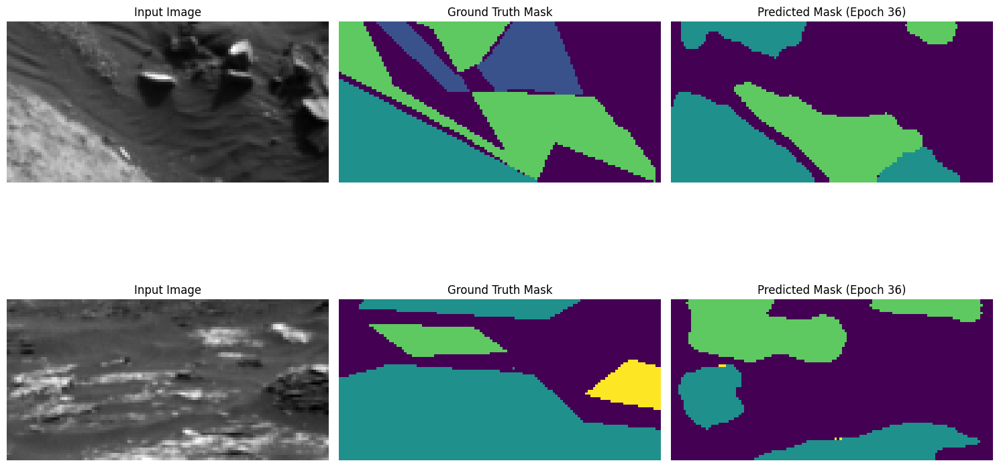

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 234ms/step - accuracy: 0.7486 - loss: 0.6823 - mean_iou: 0.4779 - val_accuracy: 0.7501 - val_loss: 0.7013 - val_mean_iou: 0.4800 - learning_rate: 5.0000e-05
Epoch 37/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - accuracy: 0.7655 - loss: 0.6761 - mean_iou: 0.4939Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 37: val_loss did not improve from 0.69651
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


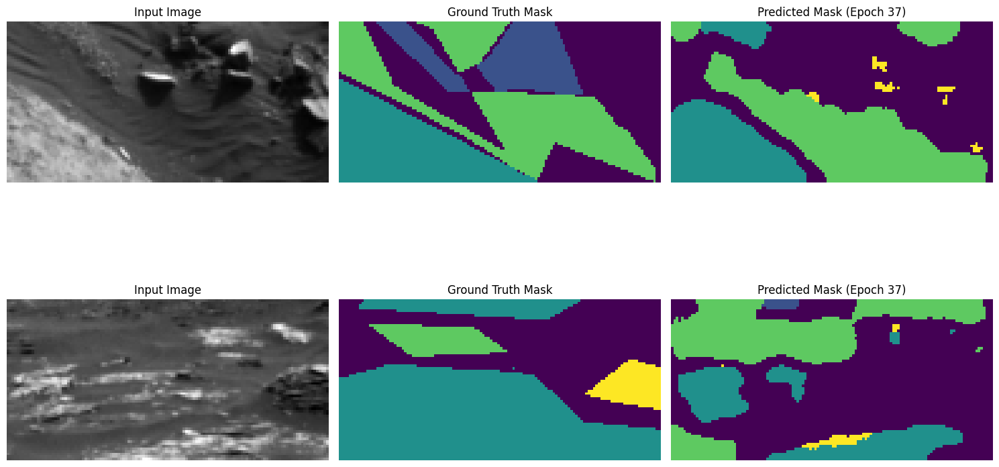

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 237ms/step - accuracy: 0.7655 - loss: 0.6761 - mean_iou: 0.4939 - val_accuracy: 0.7401 - val_loss: 0.7057 - val_mean_iou: 0.4653 - learning_rate: 5.0000e-05
Epoch 38/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - accuracy: 0.7596 - loss: 0.6786 - mean_iou: 0.4892Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 38: val_loss improved from 0.69651 to 0.69515, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


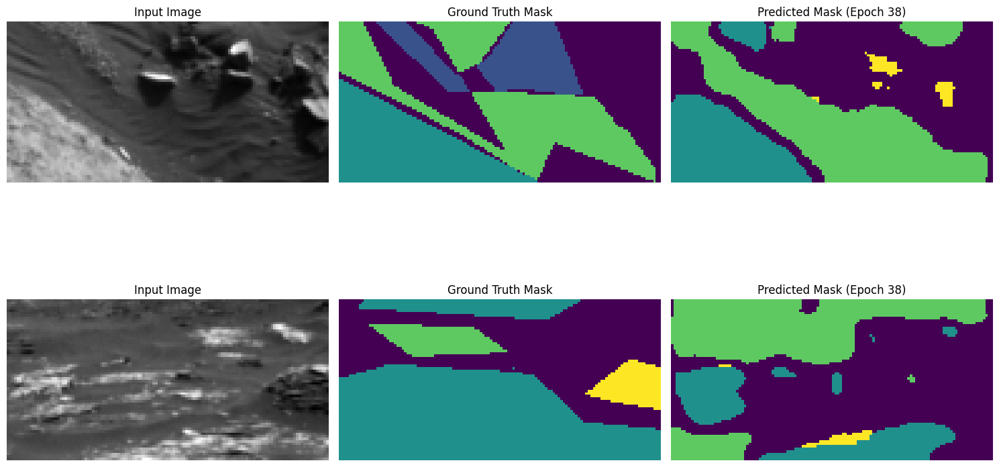

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 237ms/step - accuracy: 0.7596 - loss: 0.6786 - mean_iou: 0.4892 - val_accuracy: 0.7602 - val_loss: 0.6952 - val_mean_iou: 0.4854 - learning_rate: 5.0000e-05
Epoch 39/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - accuracy: 0.7178 - loss: 0.6923 - mean_iou: 0.4406Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 39: val_loss did not improve from 0.69515
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


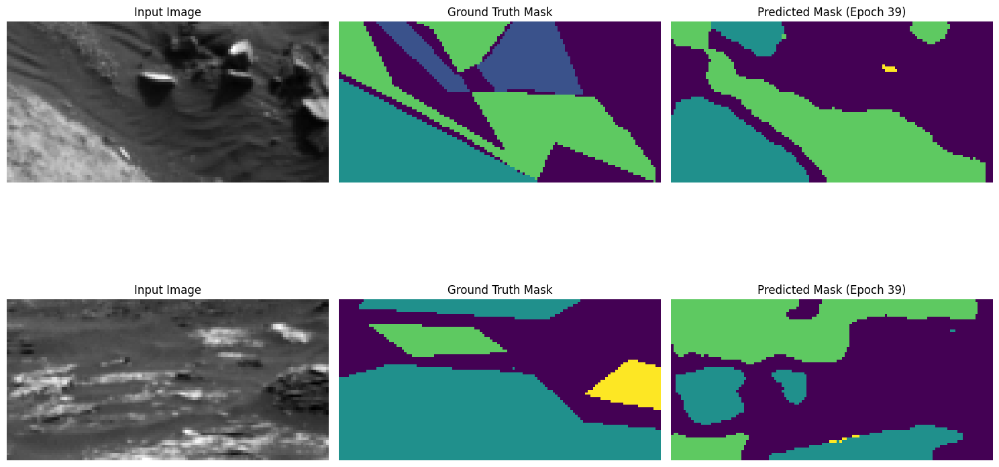

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 235ms/step - accuracy: 0.7179 - loss: 0.6923 - mean_iou: 0.4406 - val_accuracy: 0.7328 - val_loss: 0.7035 - val_mean_iou: 0.4448 - learning_rate: 5.0000e-05
Epoch 40/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - accuracy: 0.7629 - loss: 0.6752 - mean_iou: 0.4961Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 40: val_loss did not improve from 0.69515
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


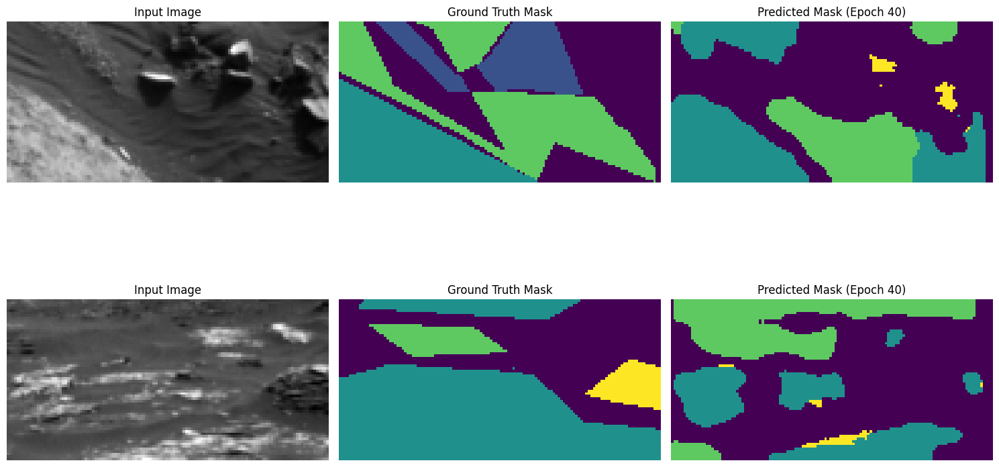

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 234ms/step - accuracy: 0.7629 - loss: 0.6752 - mean_iou: 0.4961 - val_accuracy: 0.7574 - val_loss: 0.6977 - val_mean_iou: 0.4677 - learning_rate: 5.0000e-05
Epoch 41/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - accuracy: 0.7570 - loss: 0.6767 - mean_iou: 0.4807Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 41: val_loss did not improve from 0.69515
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


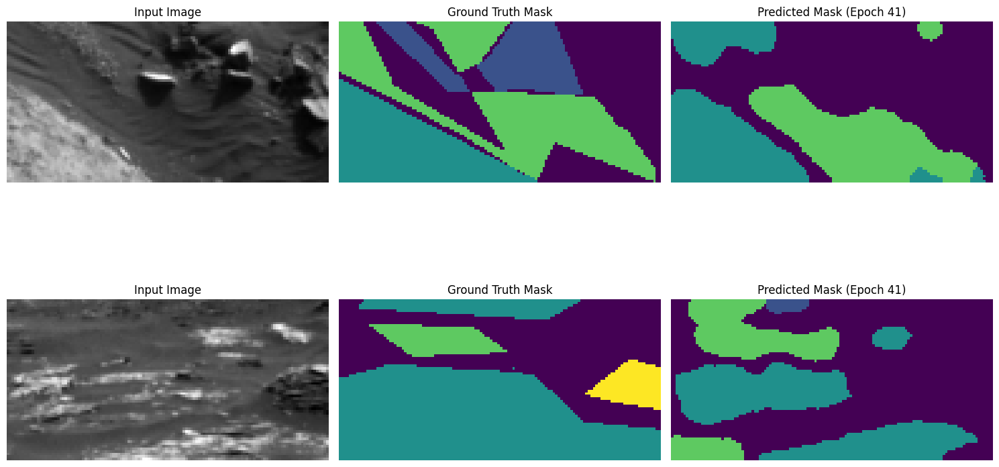

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 236ms/step - accuracy: 0.7570 - loss: 0.6767 - mean_iou: 0.4807 - val_accuracy: 0.7663 - val_loss: 0.6957 - val_mean_iou: 0.4779 - learning_rate: 5.0000e-05
Epoch 42/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - accuracy: 0.7723 - loss: 0.6699 - mean_iou: 0.5057Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 42: val_loss did not improve from 0.69515
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


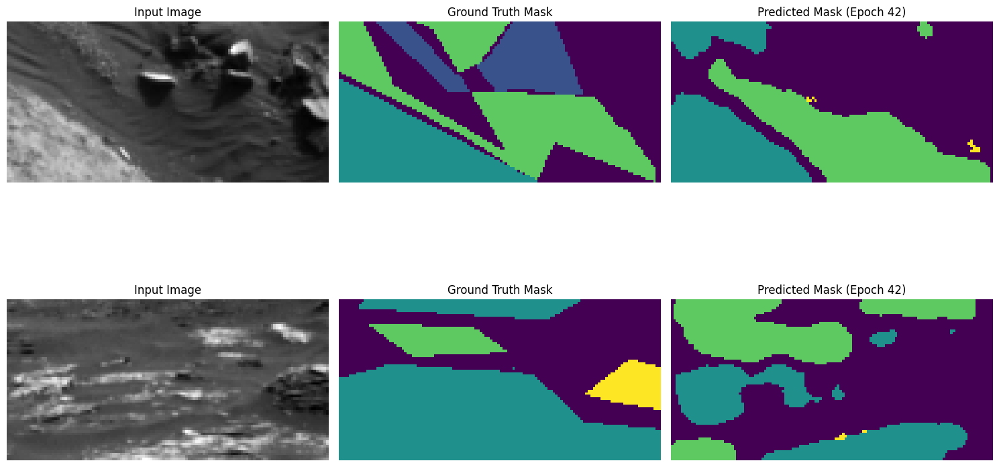

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 236ms/step - accuracy: 0.7723 - loss: 0.6699 - mean_iou: 0.5056 - val_accuracy: 0.7601 - val_loss: 0.6980 - val_mean_iou: 0.4853 - learning_rate: 5.0000e-05
Epoch 43/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - accuracy: 0.7627 - loss: 0.6739 - mean_iou: 0.4906Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 43: val_loss did not improve from 0.69515

Epoch 43: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-05.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


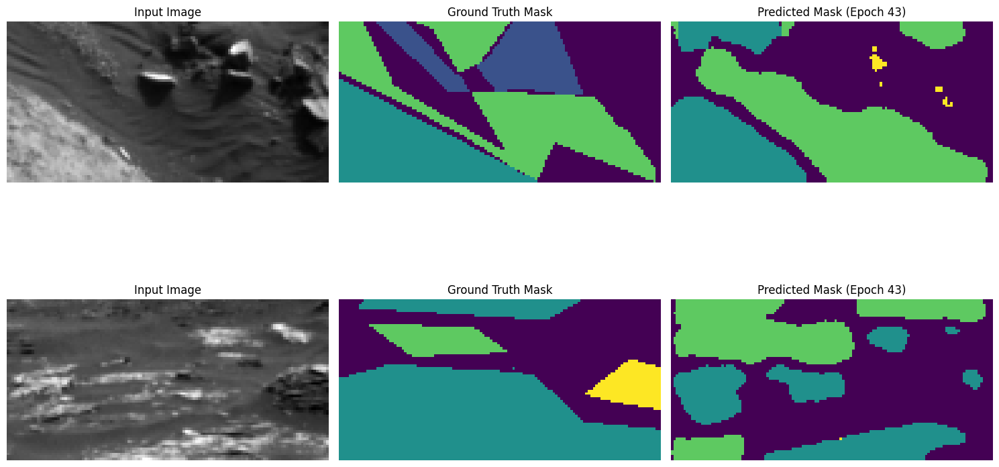

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 235ms/step - accuracy: 0.7628 - loss: 0.6739 - mean_iou: 0.4906 - val_accuracy: 0.7586 - val_loss: 0.6972 - val_mean_iou: 0.4754 - learning_rate: 5.0000e-05
Epoch 44/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - accuracy: 0.7773 - loss: 0.6658 - mean_iou: 0.5165Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 44: val_loss did not improve from 0.69515
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


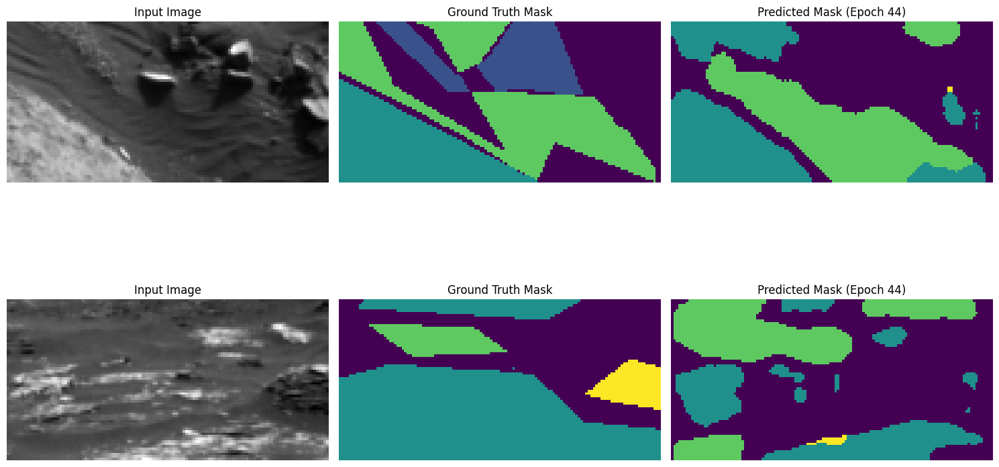

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 235ms/step - accuracy: 0.7773 - loss: 0.6658 - mean_iou: 0.5165 - val_accuracy: 0.7310 - val_loss: 0.7048 - val_mean_iou: 0.4382 - learning_rate: 2.5000e-05
Epoch 45/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - accuracy: 0.7762 - loss: 0.6659 - mean_iou: 0.5142Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 45: val_loss did not improve from 0.69515
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


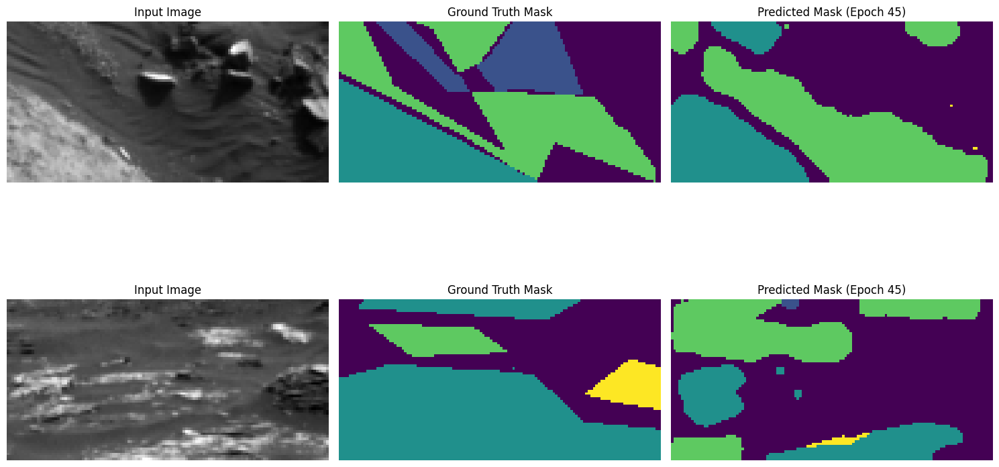

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 235ms/step - accuracy: 0.7762 - loss: 0.6659 - mean_iou: 0.5142 - val_accuracy: 0.7607 - val_loss: 0.6963 - val_mean_iou: 0.4738 - learning_rate: 2.5000e-05
Epoch 46/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - accuracy: 0.7811 - loss: 0.6636 - mean_iou: 0.5236Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 46: val_loss improved from 0.69515 to 0.69444, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


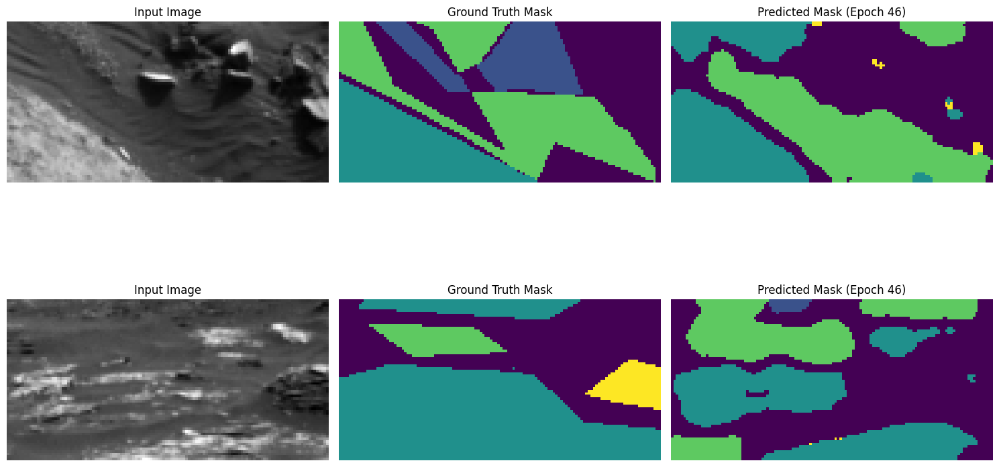

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 237ms/step - accuracy: 0.7811 - loss: 0.6636 - mean_iou: 0.5236 - val_accuracy: 0.7641 - val_loss: 0.6944 - val_mean_iou: 0.4822 - learning_rate: 2.5000e-05
Epoch 47/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - accuracy: 0.7808 - loss: 0.6639 - mean_iou: 0.5244Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 47: val_loss did not improve from 0.69444
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


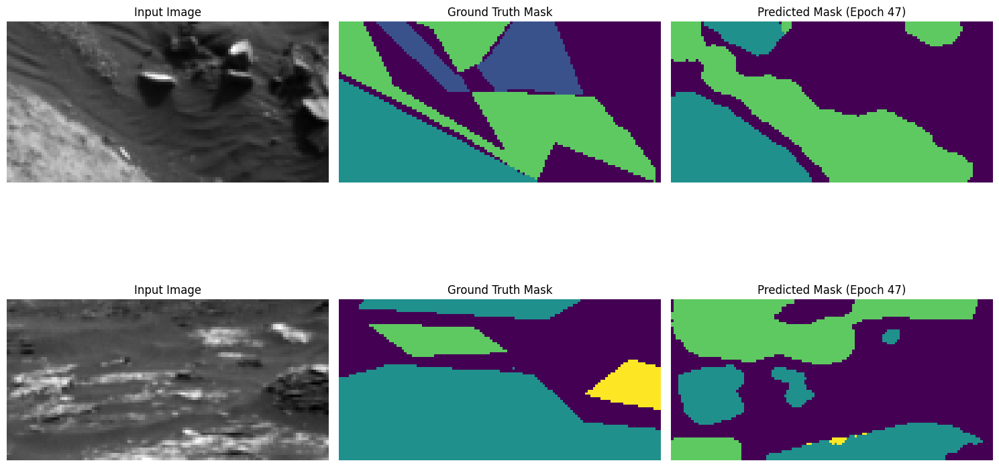

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 236ms/step - accuracy: 0.7808 - loss: 0.6639 - mean_iou: 0.5244 - val_accuracy: 0.7606 - val_loss: 0.6957 - val_mean_iou: 0.4694 - learning_rate: 2.5000e-05
Epoch 48/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - accuracy: 0.7799 - loss: 0.6636 - mean_iou: 0.5207Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 48: val_loss did not improve from 0.69444
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


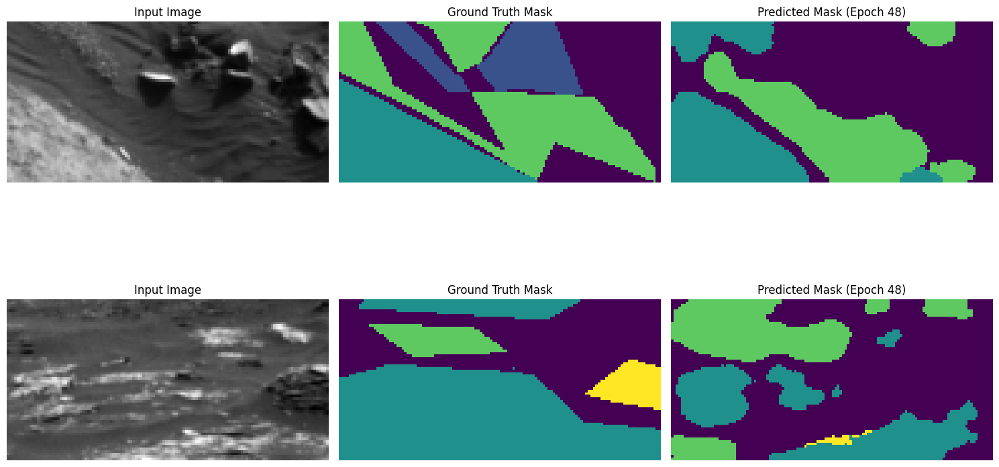

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 236ms/step - accuracy: 0.7799 - loss: 0.6636 - mean_iou: 0.5207 - val_accuracy: 0.7477 - val_loss: 0.7020 - val_mean_iou: 0.4548 - learning_rate: 2.5000e-05
Epoch 49/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - accuracy: 0.7833 - loss: 0.6624 - mean_iou: 0.5230Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 49: val_loss did not improve from 0.69444
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


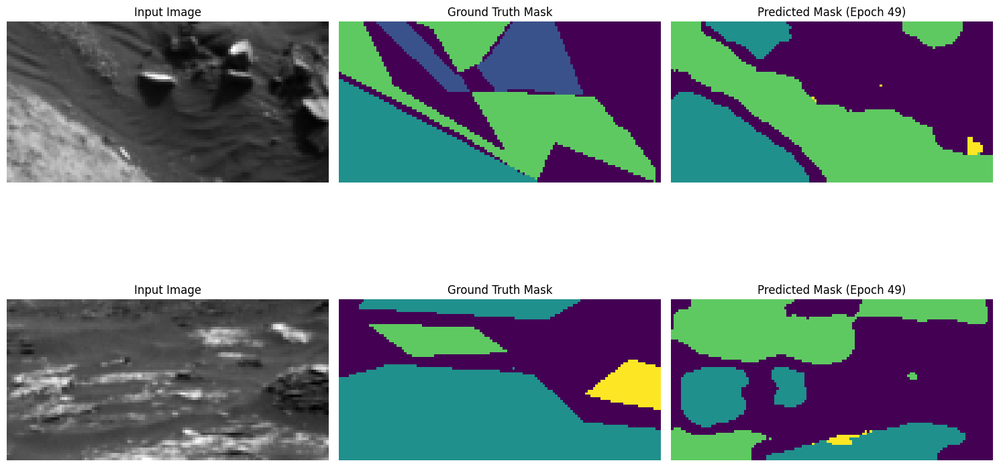

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 235ms/step - accuracy: 0.7833 - loss: 0.6623 - mean_iou: 0.5230 - val_accuracy: 0.7569 - val_loss: 0.6993 - val_mean_iou: 0.4839 - learning_rate: 2.5000e-05
Epoch 50/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - accuracy: 0.7750 - loss: 0.6655 - mean_iou: 0.5163Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 50: val_loss did not improve from 0.69444
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


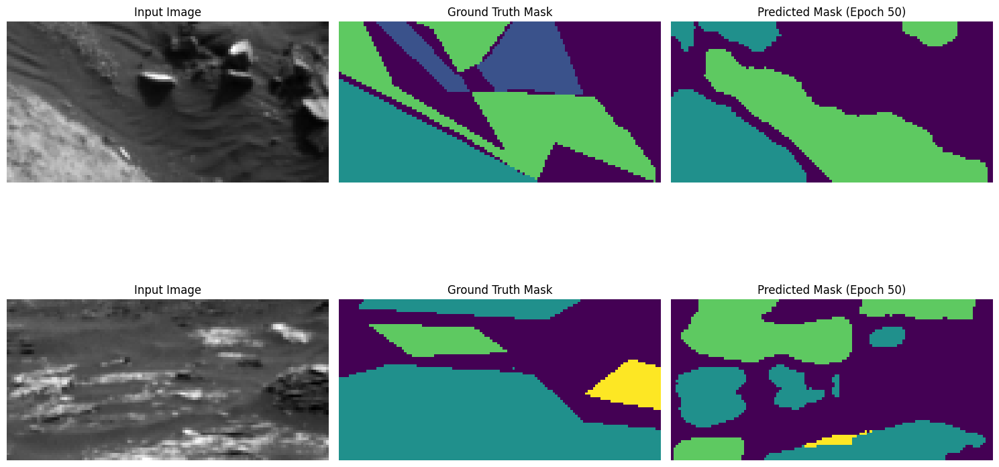

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 236ms/step - accuracy: 0.7750 - loss: 0.6655 - mean_iou: 0.5163 - val_accuracy: 0.7606 - val_loss: 0.6968 - val_mean_iou: 0.4775 - learning_rate: 2.5000e-05
Epoch 51/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - accuracy: 0.7888 - loss: 0.6592 - mean_iou: 0.5338Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 51: val_loss did not improve from 0.69444

Epoch 51: ReduceLROnPlateau reducing learning rate to 1.249999968422344e-05.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


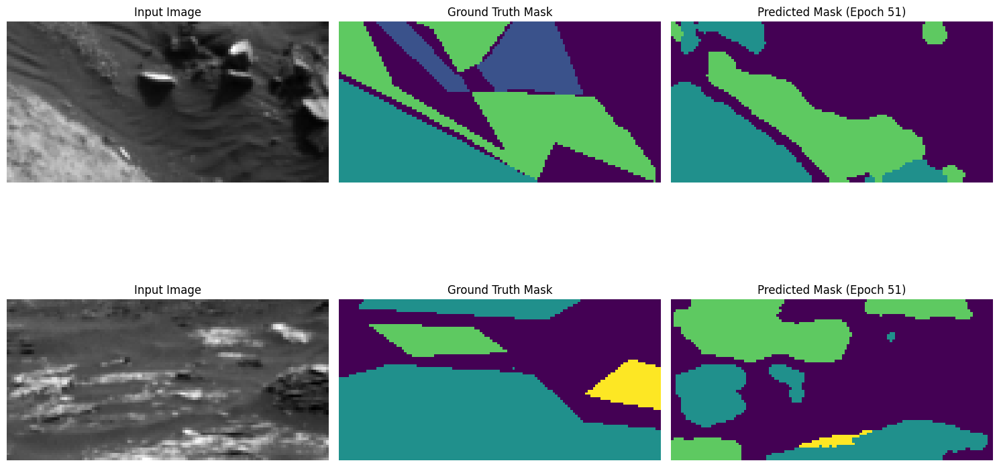

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 235ms/step - accuracy: 0.7888 - loss: 0.6592 - mean_iou: 0.5338 - val_accuracy: 0.7191 - val_loss: 0.7116 - val_mean_iou: 0.4181 - learning_rate: 2.5000e-05
Epoch 52/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - accuracy: 0.7756 - loss: 0.6641 - mean_iou: 0.5179Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 52: val_mean_iou improved to 0.4892, saving model.

Epoch 52: val_loss did not improve from 0.69444
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


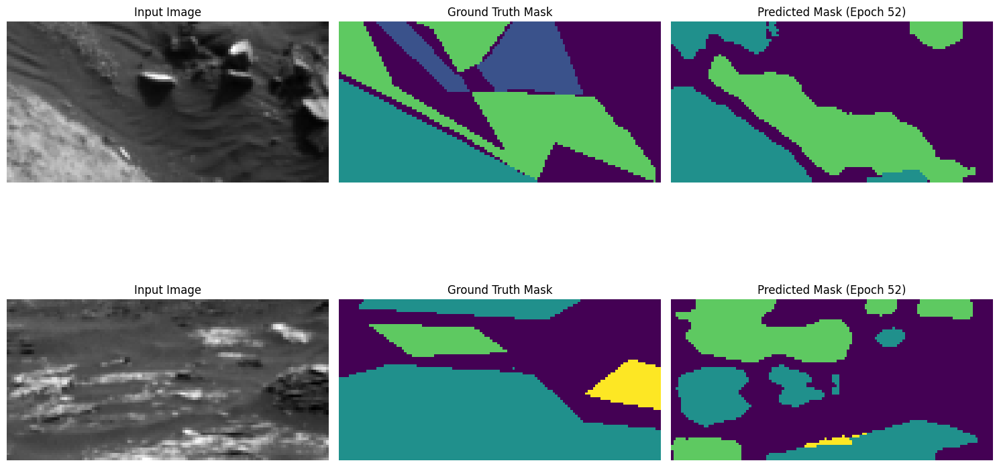

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 233ms/step - accuracy: 0.7756 - loss: 0.6641 - mean_iou: 0.5179 - val_accuracy: 0.7643 - val_loss: 0.6952 - val_mean_iou: 0.4892 - learning_rate: 1.2500e-05
Epoch 53/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - accuracy: 0.7970 - loss: 0.6542 - mean_iou: 0.5485Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 53: val_loss did not improve from 0.69444
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


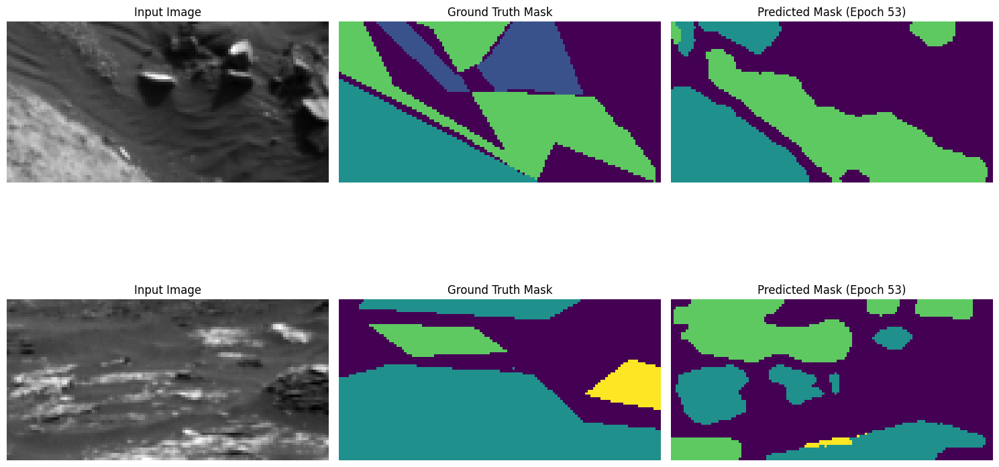

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 235ms/step - accuracy: 0.7970 - loss: 0.6542 - mean_iou: 0.5485 - val_accuracy: 0.7633 - val_loss: 0.6948 - val_mean_iou: 0.4729 - learning_rate: 1.2500e-05
Epoch 54/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - accuracy: 0.7985 - loss: 0.6530 - mean_iou: 0.5507Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 54: val_loss improved from 0.69444 to 0.69253, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


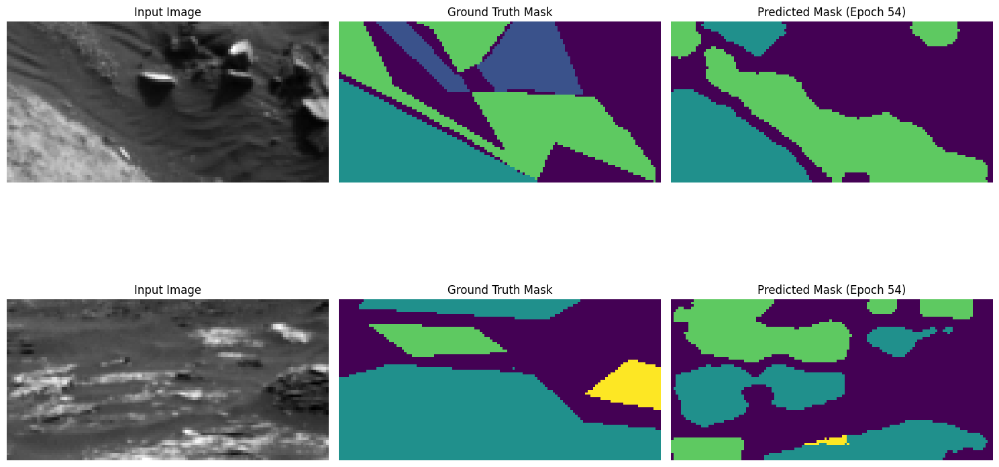

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 237ms/step - accuracy: 0.7985 - loss: 0.6530 - mean_iou: 0.5507 - val_accuracy: 0.7712 - val_loss: 0.6925 - val_mean_iou: 0.4852 - learning_rate: 1.2500e-05
Epoch 55/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - accuracy: 0.7979 - loss: 0.6527 - mean_iou: 0.5510Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 55: val_loss did not improve from 0.69253
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


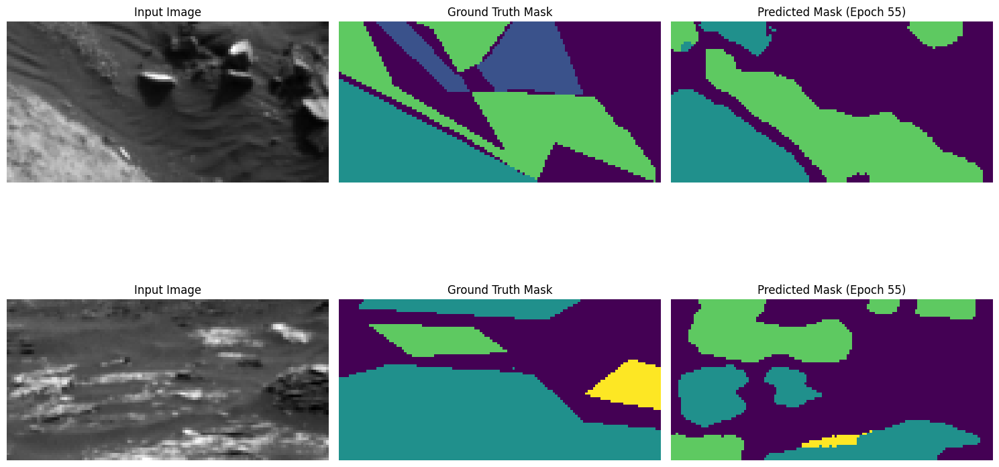

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 234ms/step - accuracy: 0.7979 - loss: 0.6527 - mean_iou: 0.5510 - val_accuracy: 0.7689 - val_loss: 0.6942 - val_mean_iou: 0.4834 - learning_rate: 1.2500e-05
Epoch 56/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - accuracy: 0.7992 - loss: 0.6517 - mean_iou: 0.5510Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 56: val_mean_iou improved to 0.4915, saving model.

Epoch 56: val_loss did not improve from 0.69253
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


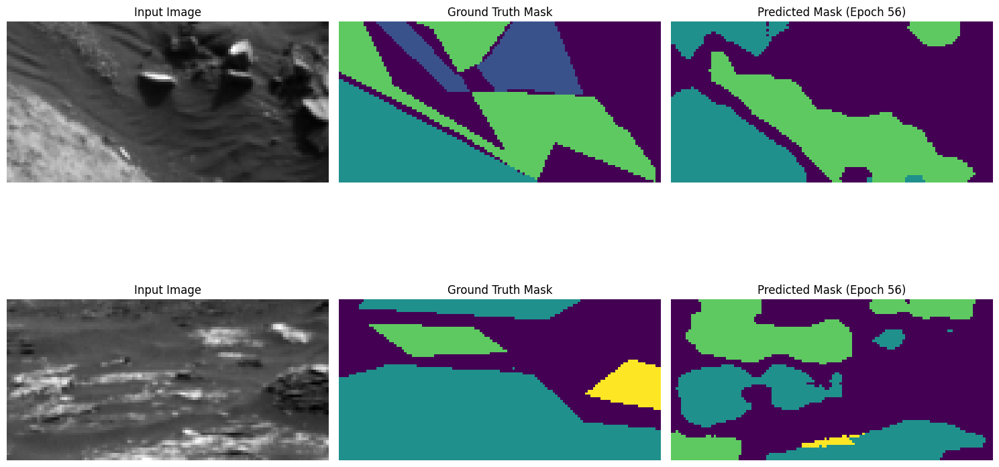

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 236ms/step - accuracy: 0.7992 - loss: 0.6517 - mean_iou: 0.5510 - val_accuracy: 0.7683 - val_loss: 0.6943 - val_mean_iou: 0.4915 - learning_rate: 1.2500e-05
Epoch 57/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - accuracy: 0.7967 - loss: 0.6524 - mean_iou: 0.5479Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 57: val_loss did not improve from 0.69253
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


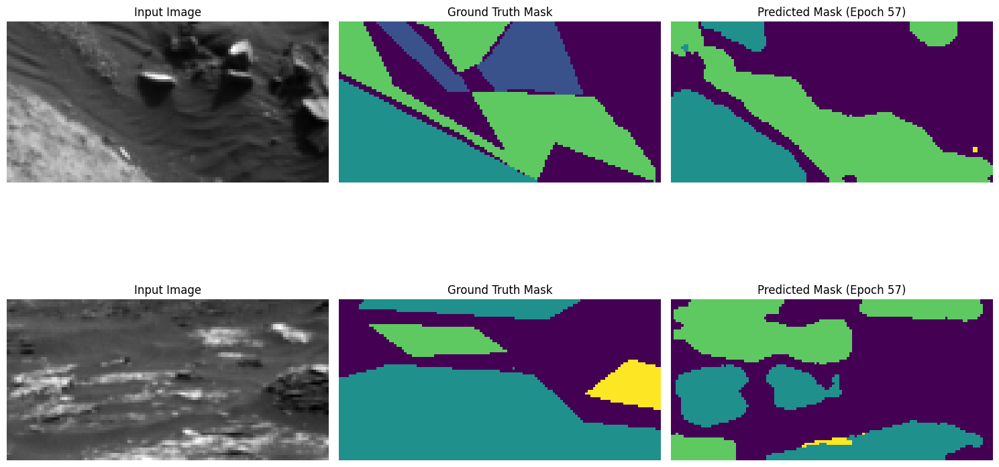

376/376 ━━━━━━━━━━━━━━━━━━━━ 87s 232ms/step - accuracy: 0.7968 - loss: 0.6524 - mean_iou: 0.5478 - val_accuracy: 0.7644 - val_loss: 0.6957 - val_mean_iou: 0.4863 - learning_rate: 1.2500e-05
Epoch 58/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - accuracy: 0.8016 - loss: 0.6498 - mean_iou: 0.5539Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 58: val_loss did not improve from 0.69253
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


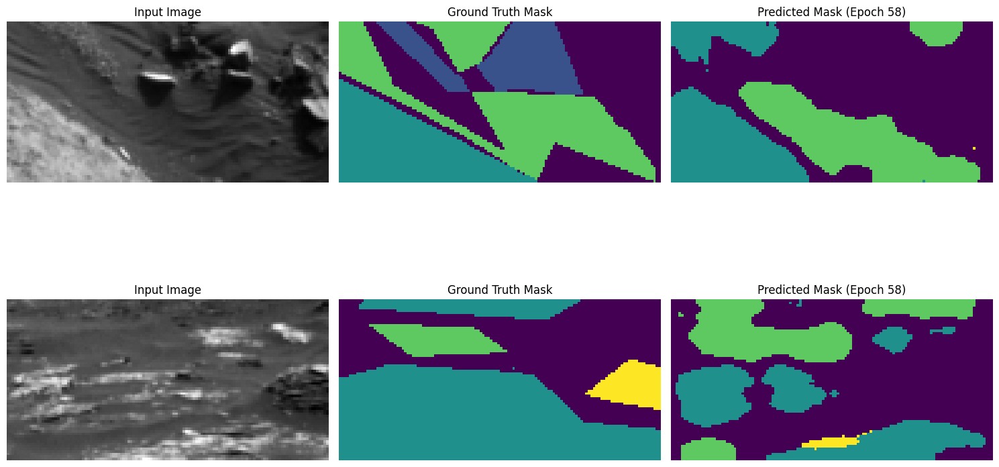

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 234ms/step - accuracy: 0.8016 - loss: 0.6498 - mean_iou: 0.5539 - val_accuracy: 0.7629 - val_loss: 0.6952 - val_mean_iou: 0.4773 - learning_rate: 1.2500e-05
Epoch 59/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - accuracy: 0.8011 - loss: 0.6501 - mean_iou: 0.5529Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 59: val_loss did not improve from 0.69253

Epoch 59: ReduceLROnPlateau reducing learning rate to 6.24999984211172e-06.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


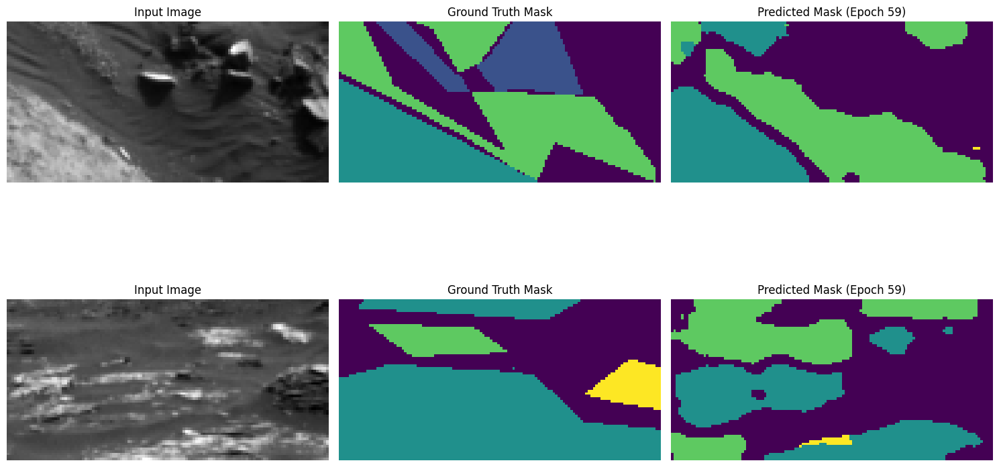

376/376 ━━━━━━━━━━━━━━━━━━━━ 87s 232ms/step - accuracy: 0.8011 - loss: 0.6501 - mean_iou: 0.5529 - val_accuracy: 0.7650 - val_loss: 0.6944 - val_mean_iou: 0.4850 - learning_rate: 1.2500e-05
Epoch 60/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - accuracy: 0.8050 - loss: 0.6486 - mean_iou: 0.5583Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 60: val_mean_iou improved to 0.4928, saving model.

Epoch 60: val_loss did not improve from 0.69253
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


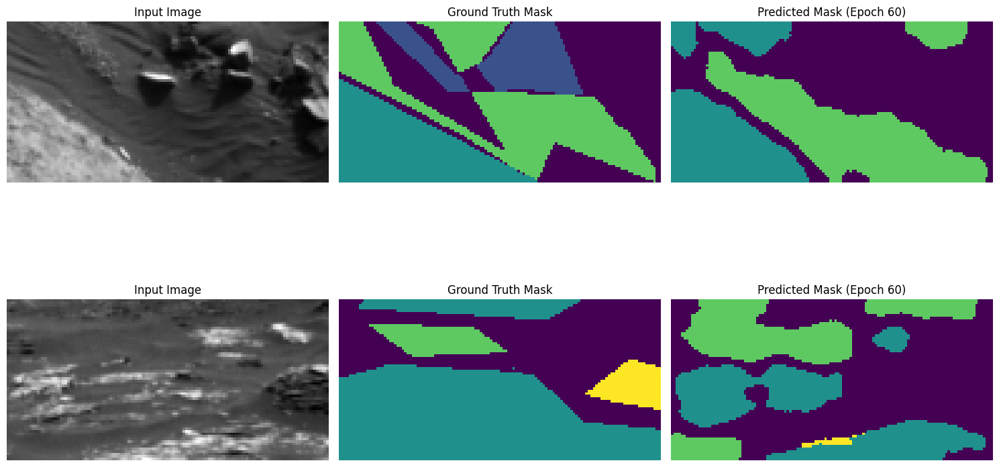

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 235ms/step - accuracy: 0.8050 - loss: 0.6486 - mean_iou: 0.5583 - val_accuracy: 0.7704 - val_loss: 0.6931 - val_mean_iou: 0.4928 - learning_rate: 6.2500e-06
Epoch 61/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - accuracy: 0.8059 - loss: 0.6476 - mean_iou: 0.5620Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 61: val_loss did not improve from 0.69253
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


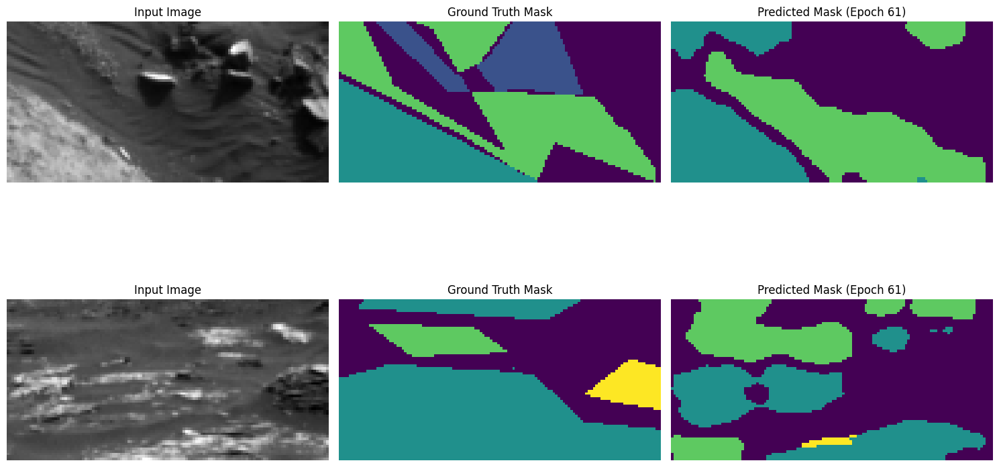

376/376 ━━━━━━━━━━━━━━━━━━━━ 87s 232ms/step - accuracy: 0.8059 - loss: 0.6476 - mean_iou: 0.5619 - val_accuracy: 0.7720 - val_loss: 0.6931 - val_mean_iou: 0.4899 - learning_rate: 6.2500e-06
Epoch 62/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - accuracy: 0.8068 - loss: 0.6470 - mean_iou: 0.5642Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 62: val_loss did not improve from 0.69253
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


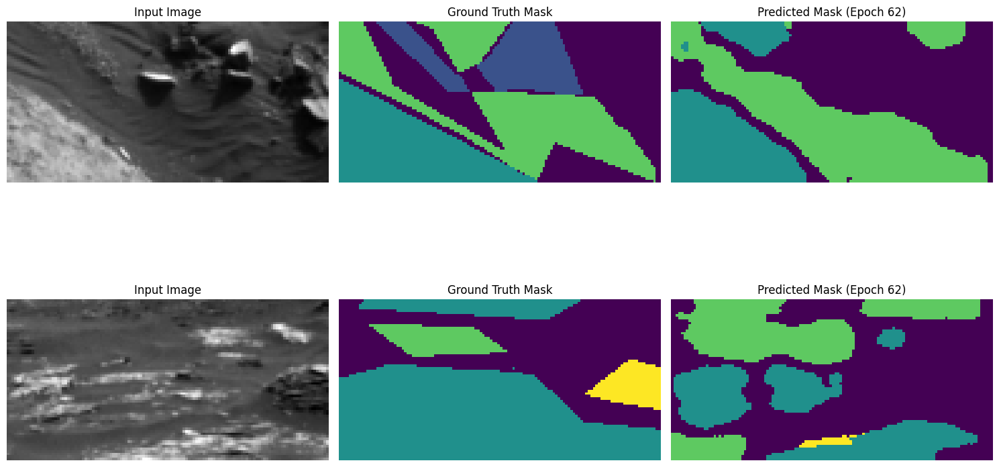

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 235ms/step - accuracy: 0.8068 - loss: 0.6470 - mean_iou: 0.5642 - val_accuracy: 0.7651 - val_loss: 0.6945 - val_mean_iou: 0.4828 - learning_rate: 6.2500e-06
Epoch 63/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - accuracy: 0.8061 - loss: 0.6466 - mean_iou: 0.5658Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 63: val_loss did not improve from 0.69253
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


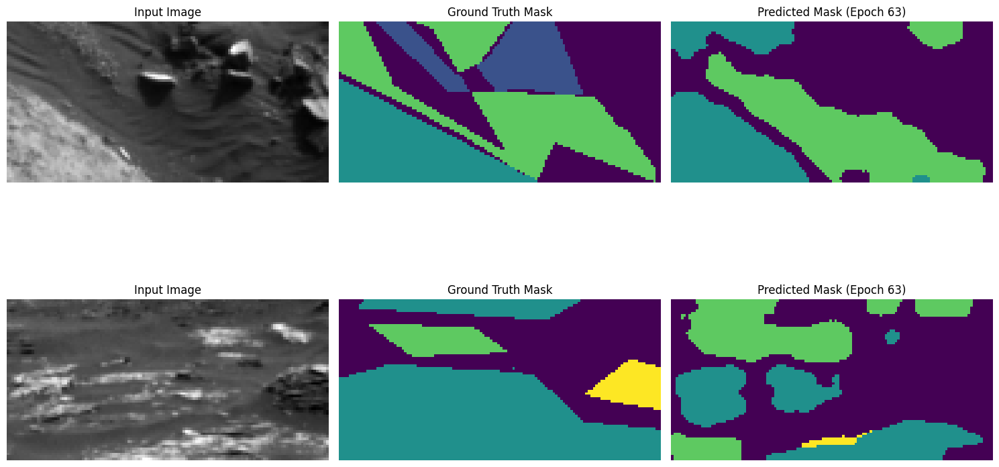

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 235ms/step - accuracy: 0.8061 - loss: 0.6466 - mean_iou: 0.5658 - val_accuracy: 0.7722 - val_loss: 0.6930 - val_mean_iou: 0.4878 - learning_rate: 6.2500e-06
Epoch 64/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - accuracy: 0.8077 - loss: 0.6458 - mean_iou: 0.5661Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 64: val_loss did not improve from 0.69253

Epoch 64: ReduceLROnPlateau reducing learning rate to 3.12499992105586e-06.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


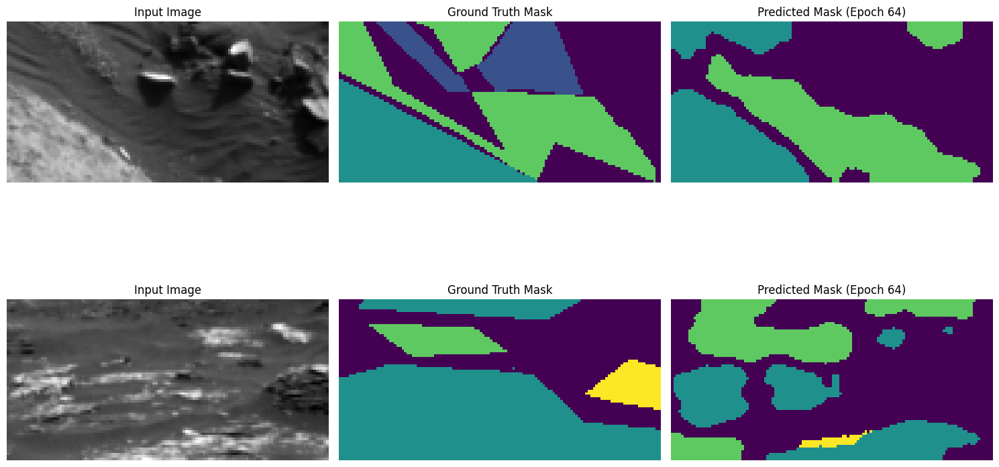

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 236ms/step - accuracy: 0.8077 - loss: 0.6458 - mean_iou: 0.5660 - val_accuracy: 0.7713 - val_loss: 0.6935 - val_mean_iou: 0.4858 - learning_rate: 6.2500e-06
Epoch 65/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - accuracy: 0.8088 - loss: 0.6449 - mean_iou: 0.5667Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 65: val_loss did not improve from 0.69253
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


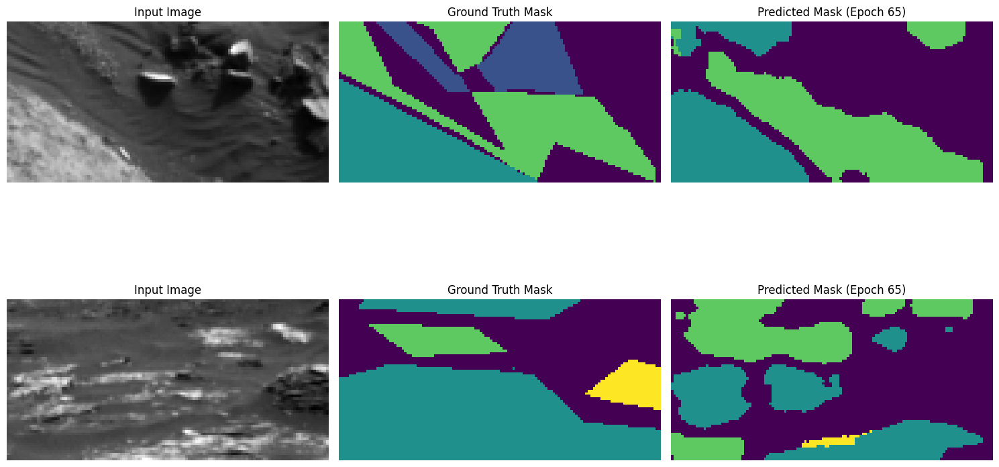

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 236ms/step - accuracy: 0.8089 - loss: 0.6449 - mean_iou: 0.5667 - val_accuracy: 0.7673 - val_loss: 0.6943 - val_mean_iou: 0.4811 - learning_rate: 3.1250e-06
Epoch 66/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - accuracy: 0.8068 - loss: 0.6456 - mean_iou: 0.5655Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 66: val_loss did not improve from 0.69253
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


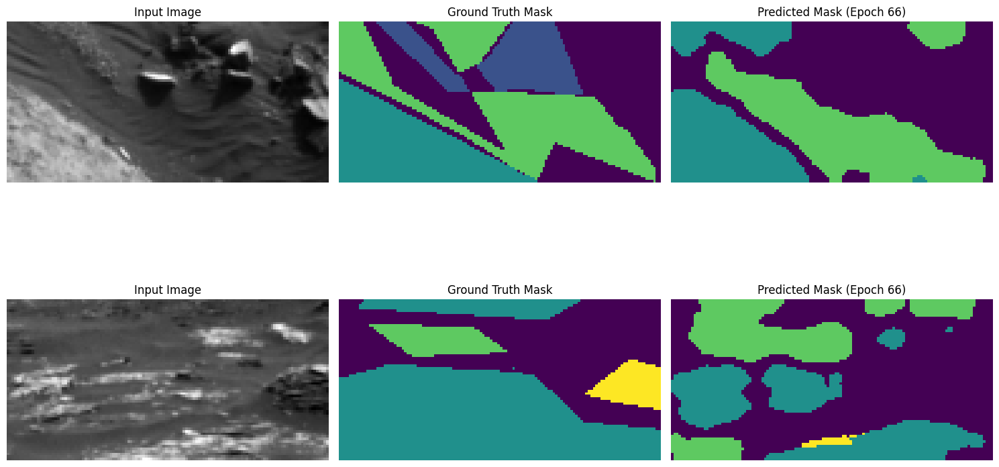

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 236ms/step - accuracy: 0.8068 - loss: 0.6455 - mean_iou: 0.5655 - val_accuracy: 0.7723 - val_loss: 0.6934 - val_mean_iou: 0.4873 - learning_rate: 3.1250e-06
Epoch 67/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - accuracy: 0.8104 - loss: 0.6442 - mean_iou: 0.5694Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 67: val_loss did not improve from 0.69253
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


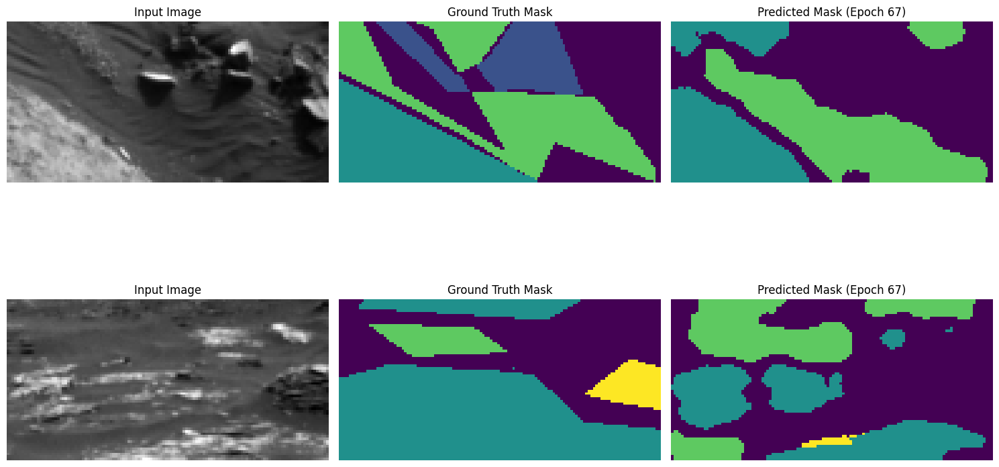

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 236ms/step - accuracy: 0.8104 - loss: 0.6442 - mean_iou: 0.5693 - val_accuracy: 0.7707 - val_loss: 0.6932 - val_mean_iou: 0.4874 - learning_rate: 3.1250e-06
Epoch 68/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - accuracy: 0.8102 - loss: 0.6441 - mean_iou: 0.5689Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 68: val_loss improved from 0.69253 to 0.69240, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


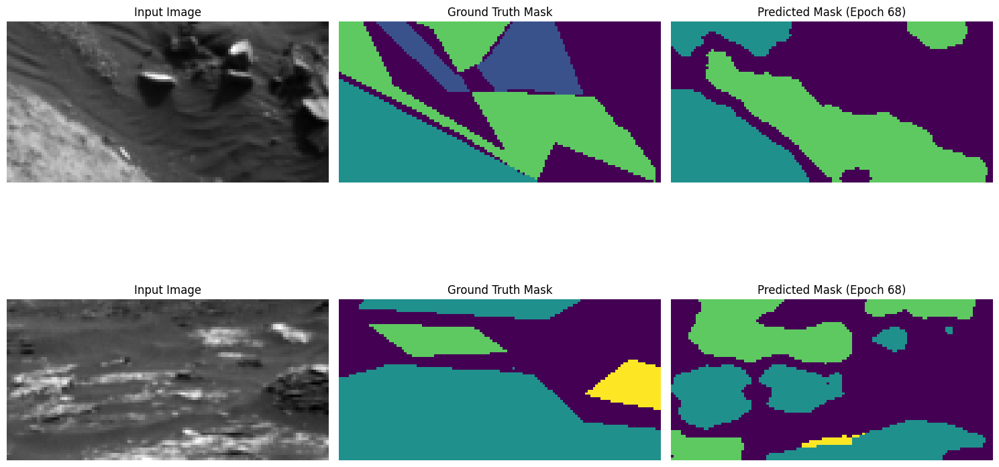

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 237ms/step - accuracy: 0.8102 - loss: 0.6441 - mean_iou: 0.5689 - val_accuracy: 0.7719 - val_loss: 0.6924 - val_mean_iou: 0.4872 - learning_rate: 3.1250e-06
Epoch 69/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - accuracy: 0.8105 - loss: 0.6440 - mean_iou: 0.5688Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 69: val_loss did not improve from 0.69240
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


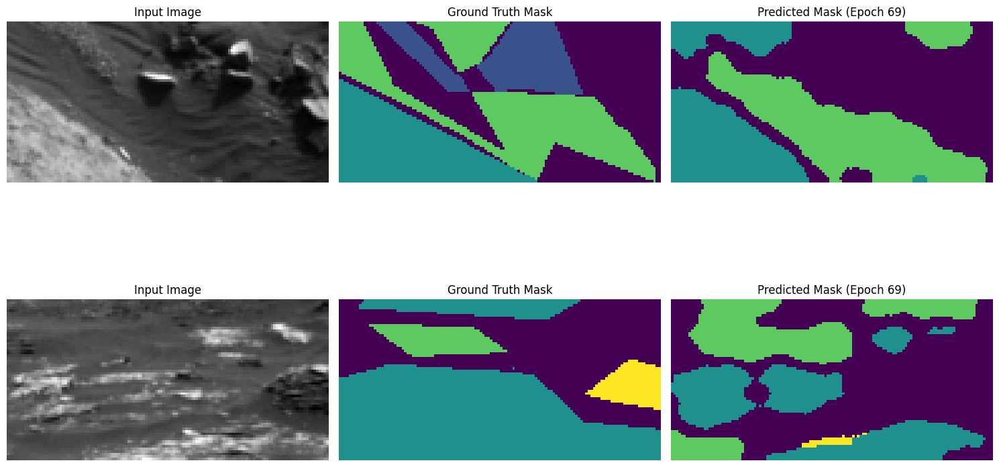

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 236ms/step - accuracy: 0.8105 - loss: 0.6439 - mean_iou: 0.5688 - val_accuracy: 0.7732 - val_loss: 0.6928 - val_mean_iou: 0.4889 - learning_rate: 3.1250e-06
Epoch 70/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - accuracy: 0.8113 - loss: 0.6437 - mean_iou: 0.5715Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 70: val_loss did not improve from 0.69240
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


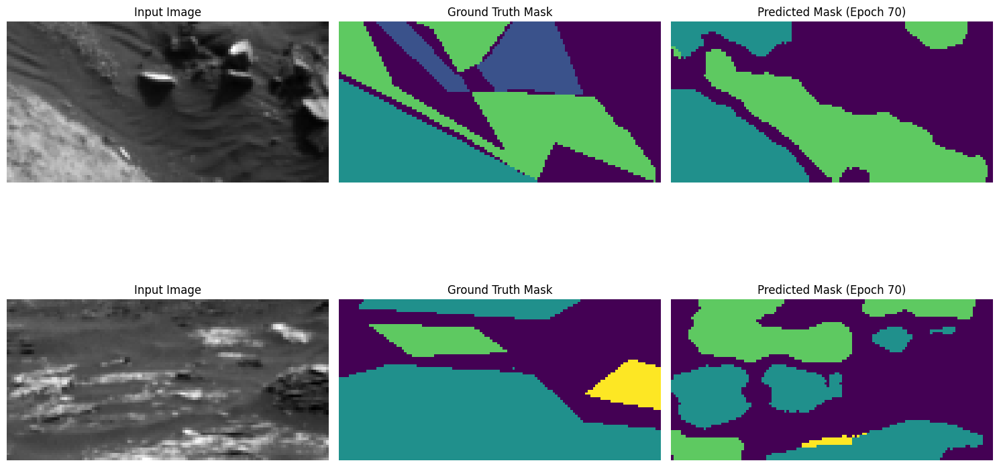

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 237ms/step - accuracy: 0.8113 - loss: 0.6437 - mean_iou: 0.5715 - val_accuracy: 0.7723 - val_loss: 0.6928 - val_mean_iou: 0.4845 - learning_rate: 3.1250e-06
Epoch 71/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - accuracy: 0.8104 - loss: 0.6436 - mean_iou: 0.5708Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 71: val_loss did not improve from 0.69240
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


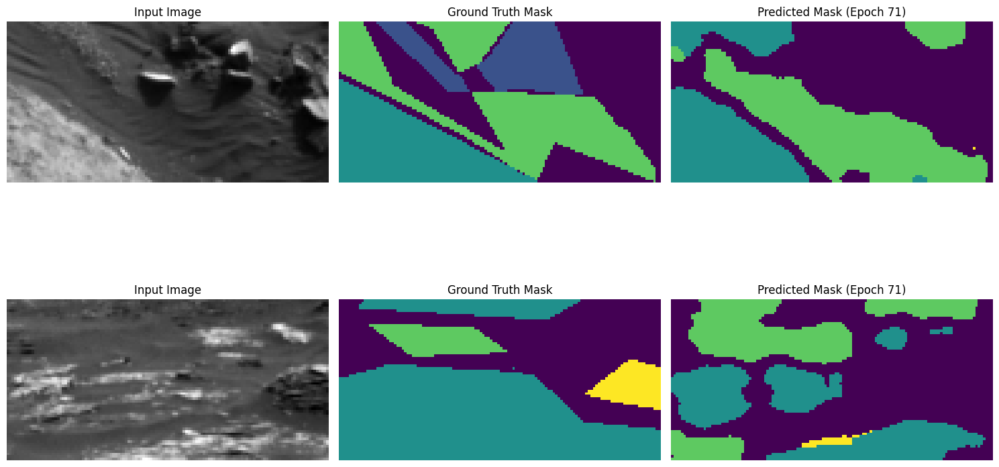

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 236ms/step - accuracy: 0.8104 - loss: 0.6436 - mean_iou: 0.5708 - val_accuracy: 0.7723 - val_loss: 0.6928 - val_mean_iou: 0.4868 - learning_rate: 3.1250e-06
Epoch 72/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - accuracy: 0.8108 - loss: 0.6437 - mean_iou: 0.5716Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 72: val_loss improved from 0.69240 to 0.69202, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


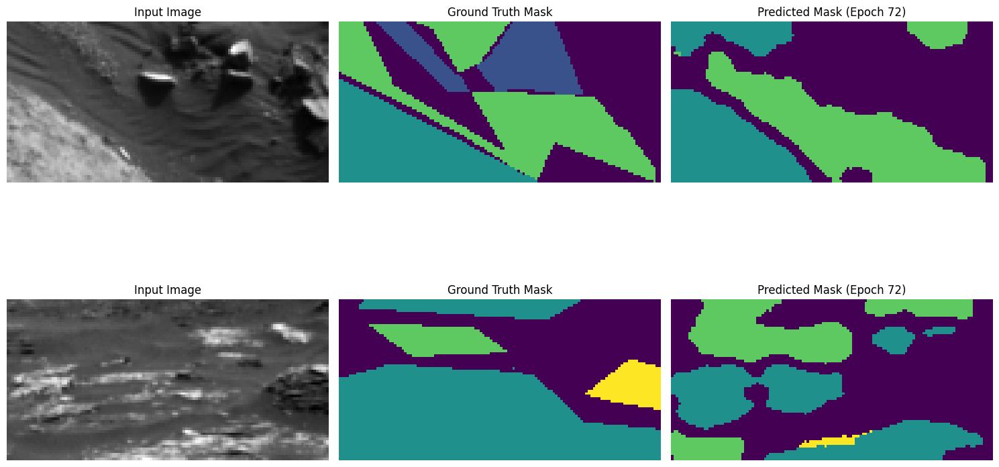

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 238ms/step - accuracy: 0.8108 - loss: 0.6437 - mean_iou: 0.5716 - val_accuracy: 0.7722 - val_loss: 0.6920 - val_mean_iou: 0.4855 - learning_rate: 3.1250e-06
Epoch 73/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - accuracy: 0.8117 - loss: 0.6432 - mean_iou: 0.5710Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 73: val_loss did not improve from 0.69202
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


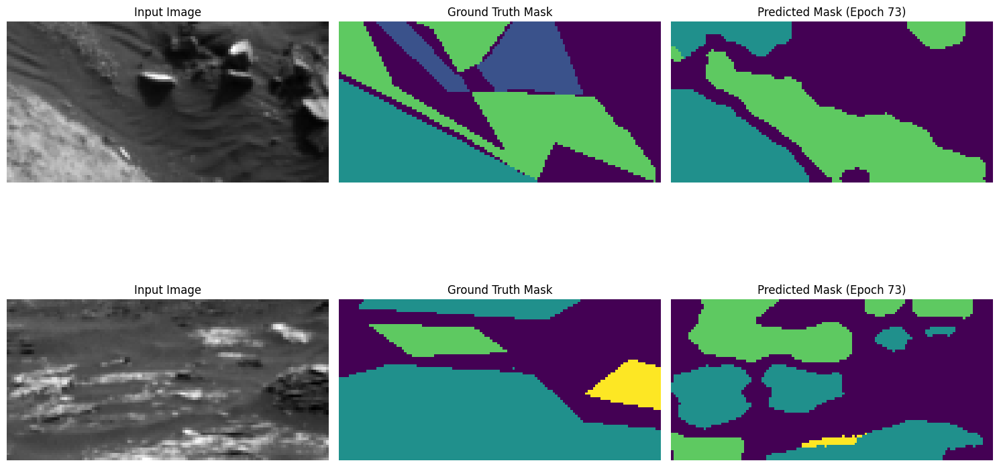

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 236ms/step - accuracy: 0.8117 - loss: 0.6431 - mean_iou: 0.5710 - val_accuracy: 0.7723 - val_loss: 0.6927 - val_mean_iou: 0.4850 - learning_rate: 3.1250e-06
Epoch 74/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - accuracy: 0.8114 - loss: 0.6429 - mean_iou: 0.5708Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 74: val_loss did not improve from 0.69202
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


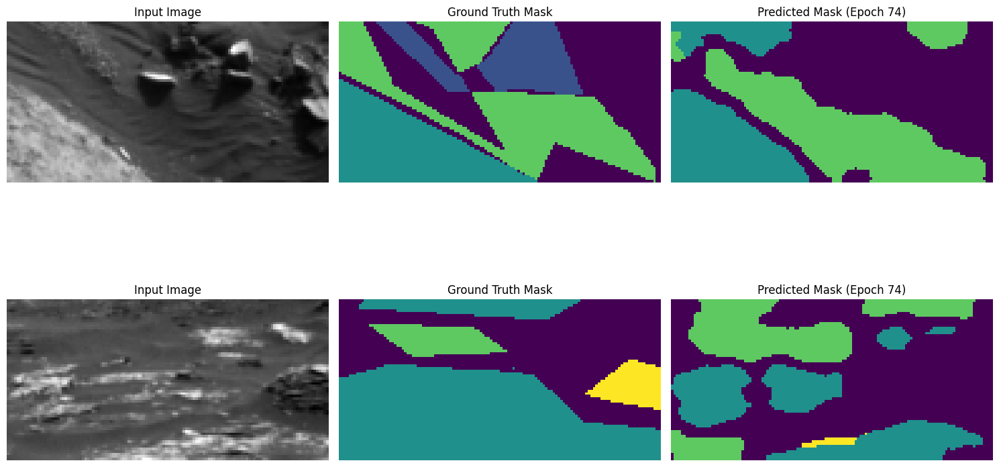

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 236ms/step - accuracy: 0.8114 - loss: 0.6429 - mean_iou: 0.5708 - val_accuracy: 0.7715 - val_loss: 0.6930 - val_mean_iou: 0.4845 - learning_rate: 3.1250e-06
Epoch 75/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - accuracy: 0.8115 - loss: 0.6426 - mean_iou: 0.5719Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 75: val_loss did not improve from 0.69202
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


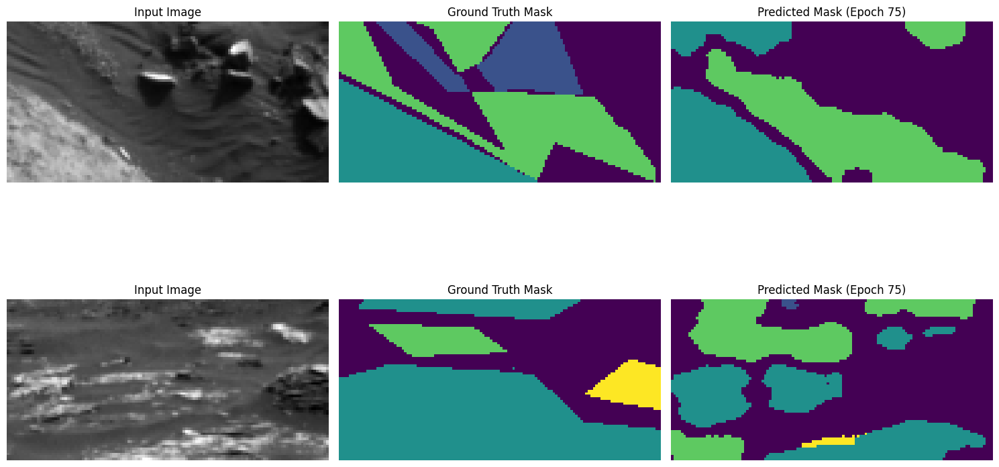

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 236ms/step - accuracy: 0.8115 - loss: 0.6426 - mean_iou: 0.5719 - val_accuracy: 0.7738 - val_loss: 0.6933 - val_mean_iou: 0.4885 - learning_rate: 3.1250e-06
Epoch 76/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - accuracy: 0.8119 - loss: 0.6425 - mean_iou: 0.5730Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 76: val_loss did not improve from 0.69202
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


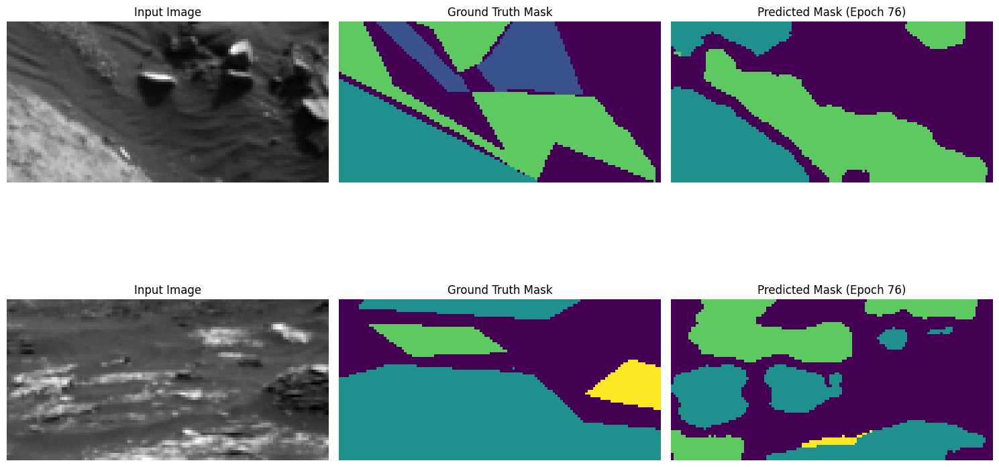

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 236ms/step - accuracy: 0.8119 - loss: 0.6424 - mean_iou: 0.5730 - val_accuracy: 0.7740 - val_loss: 0.6933 - val_mean_iou: 0.4895 - learning_rate: 3.1250e-06
Epoch 77/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - accuracy: 0.8119 - loss: 0.6424 - mean_iou: 0.5727Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 77: val_loss did not improve from 0.69202

Epoch 77: ReduceLROnPlateau reducing learning rate to 1.56249996052793e-06.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


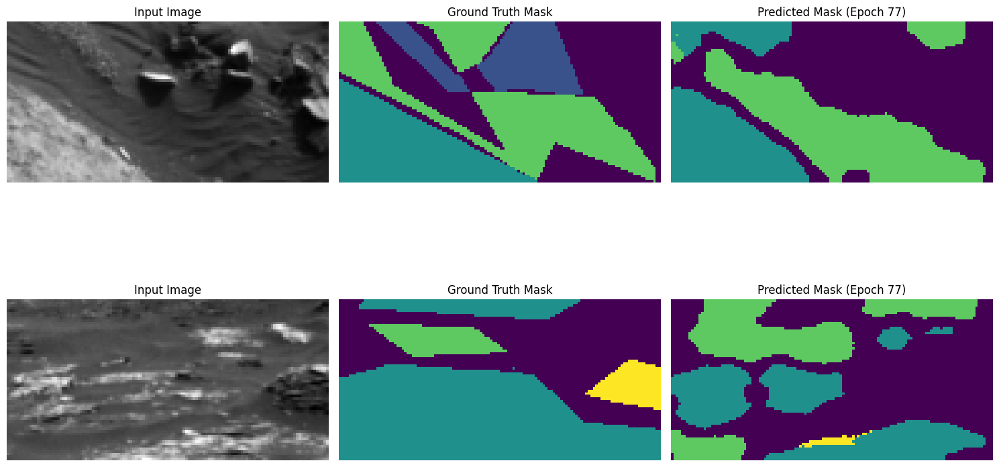

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 235ms/step - accuracy: 0.8119 - loss: 0.6424 - mean_iou: 0.5727 - val_accuracy: 0.7733 - val_loss: 0.6930 - val_mean_iou: 0.4874 - learning_rate: 3.1250e-06
Epoch 78/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - accuracy: 0.8134 - loss: 0.6413 - mean_iou: 0.5756Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 78: val_loss did not improve from 0.69202
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


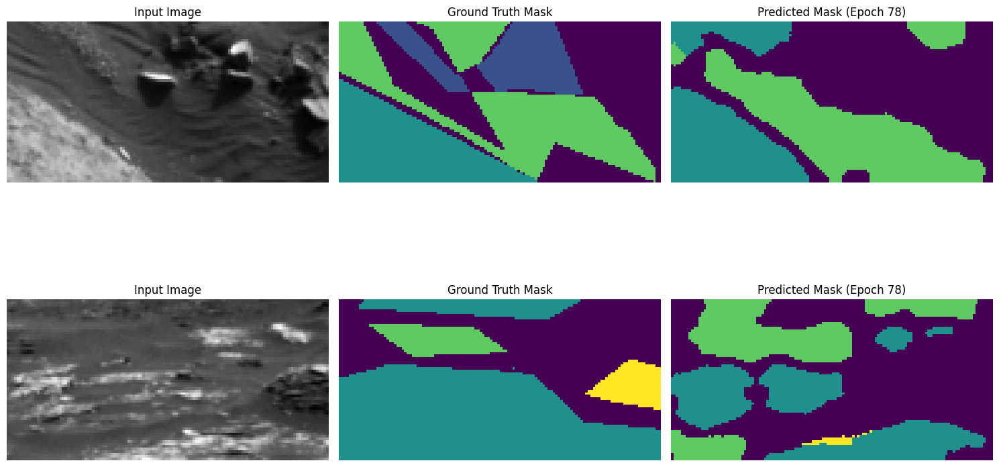

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 235ms/step - accuracy: 0.8134 - loss: 0.6413 - mean_iou: 0.5755 - val_accuracy: 0.7736 - val_loss: 0.6933 - val_mean_iou: 0.4875 - learning_rate: 1.5625e-06
Epoch 79/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - accuracy: 0.8141 - loss: 0.6412 - mean_iou: 0.5762Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 79: val_loss did not improve from 0.69202
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


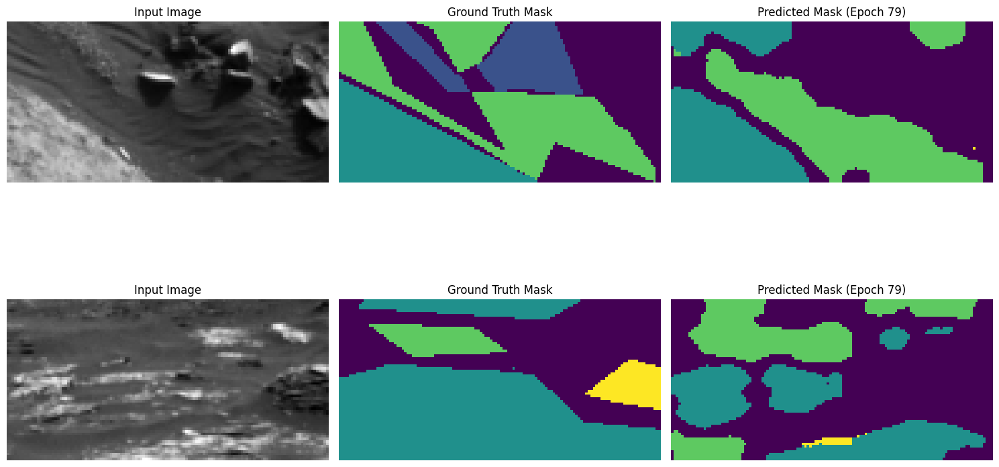

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 236ms/step - accuracy: 0.8141 - loss: 0.6411 - mean_iou: 0.5761 - val_accuracy: 0.7727 - val_loss: 0.6924 - val_mean_iou: 0.4865 - learning_rate: 1.5625e-06
Epoch 80/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - accuracy: 0.8133 - loss: 0.6413 - mean_iou: 0.5749Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 80: val_loss did not improve from 0.69202
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


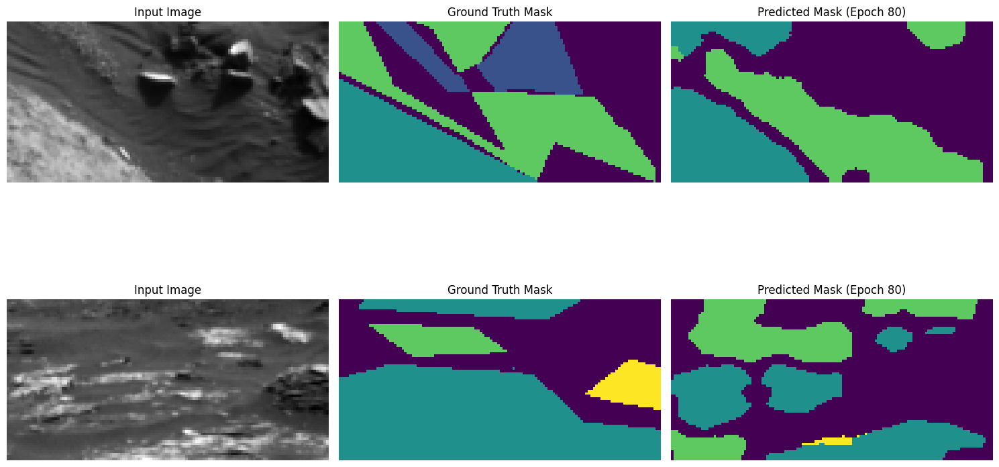

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 236ms/step - accuracy: 0.8133 - loss: 0.6413 - mean_iou: 0.5749 - val_accuracy: 0.7730 - val_loss: 0.6928 - val_mean_iou: 0.4850 - learning_rate: 1.5625e-06
Epoch 81/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - accuracy: 0.8138 - loss: 0.6410 - mean_iou: 0.5758Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 81: val_loss did not improve from 0.69202
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


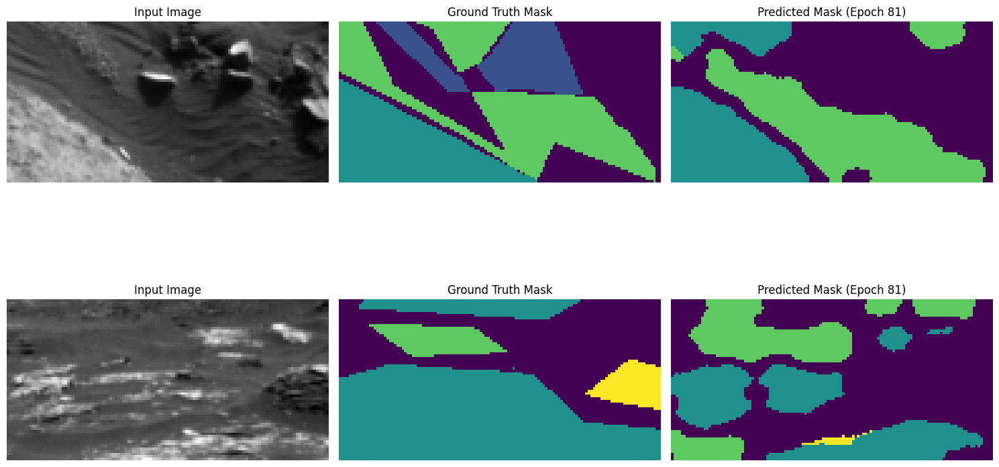

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 236ms/step - accuracy: 0.8138 - loss: 0.6410 - mean_iou: 0.5757 - val_accuracy: 0.7727 - val_loss: 0.6931 - val_mean_iou: 0.4863 - learning_rate: 1.5625e-06
Epoch 82/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - accuracy: 0.8140 - loss: 0.6410 - mean_iou: 0.5757Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 82: val_loss did not improve from 0.69202

Epoch 82: ReduceLROnPlateau reducing learning rate to 1e-06.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


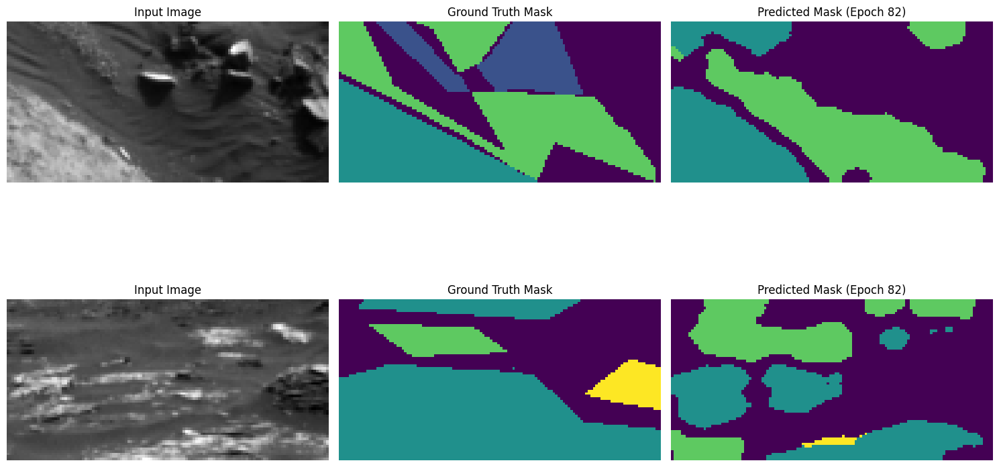

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 235ms/step - accuracy: 0.8140 - loss: 0.6409 - mean_iou: 0.5757 - val_accuracy: 0.7722 - val_loss: 0.6929 - val_mean_iou: 0.4847 - learning_rate: 1.5625e-06
Epoch 83/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - accuracy: 0.8139 - loss: 0.6407 - mean_iou: 0.5762Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 83: val_loss did not improve from 0.69202
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


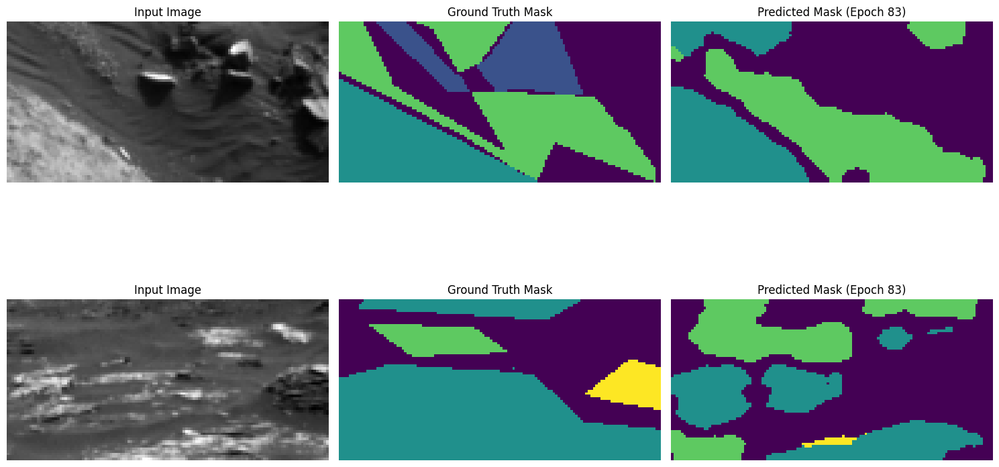

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 236ms/step - accuracy: 0.8139 - loss: 0.6407 - mean_iou: 0.5761 - val_accuracy: 0.7727 - val_loss: 0.6932 - val_mean_iou: 0.4858 - learning_rate: 1.0000e-06
Epoch 84/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - accuracy: 0.8144 - loss: 0.6405 - mean_iou: 0.5773Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 84: val_loss did not improve from 0.69202
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


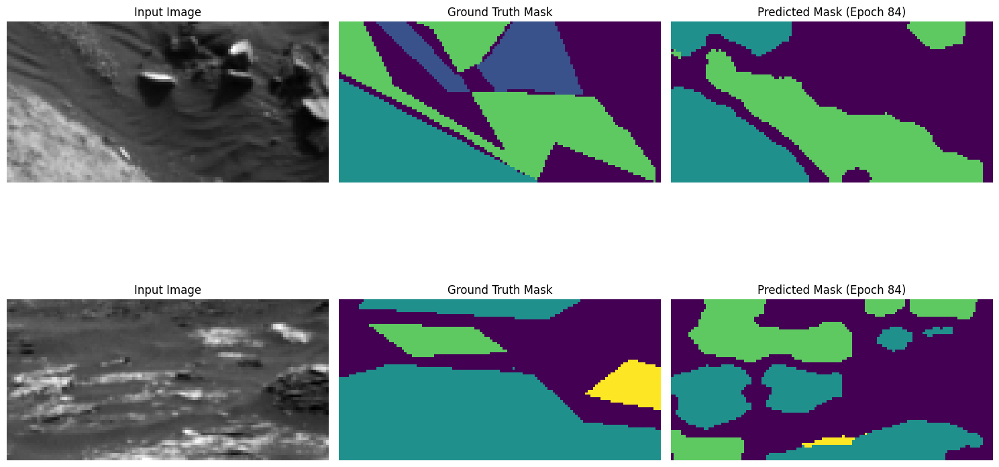

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 236ms/step - accuracy: 0.8144 - loss: 0.6405 - mean_iou: 0.5772 - val_accuracy: 0.7730 - val_loss: 0.6929 - val_mean_iou: 0.4851 - learning_rate: 1.0000e-06
Epoch 85/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - accuracy: 0.8141 - loss: 0.6405 - mean_iou: 0.5773Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 85: val_loss did not improve from 0.69202
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


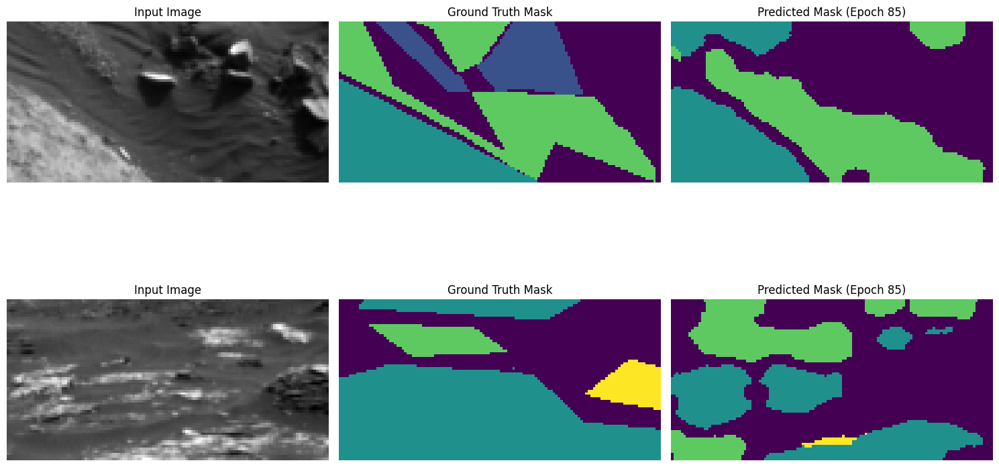

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 236ms/step - accuracy: 0.8141 - loss: 0.6405 - mean_iou: 0.5773 - val_accuracy: 0.7732 - val_loss: 0.6934 - val_mean_iou: 0.4850 - learning_rate: 1.0000e-06
Epoch 86/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - accuracy: 0.8150 - loss: 0.6403 - mean_iou: 0.5777Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 86: val_loss did not improve from 0.69202
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


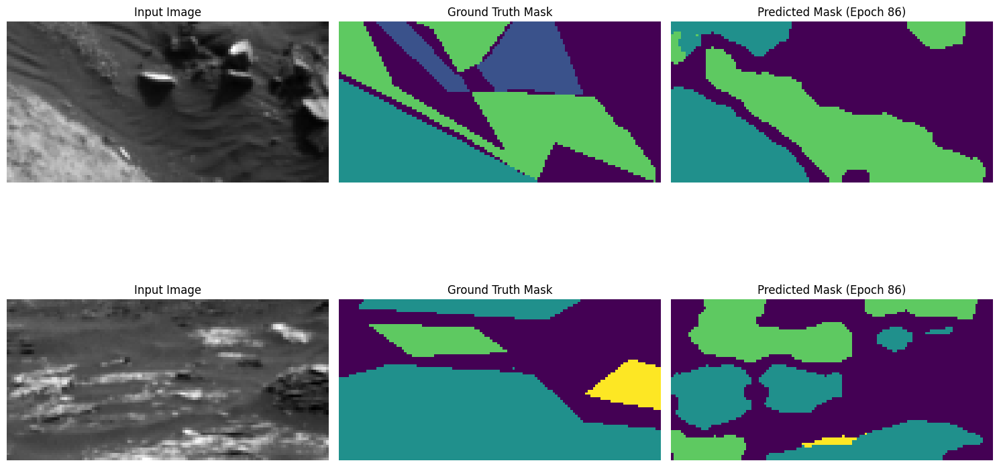

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 236ms/step - accuracy: 0.8150 - loss: 0.6403 - mean_iou: 0.5777 - val_accuracy: 0.7727 - val_loss: 0.6930 - val_mean_iou: 0.4845 - learning_rate: 1.0000e-06
Epoch 87/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - accuracy: 0.8150 - loss: 0.6403 - mean_iou: 0.5777Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 87: val_loss did not improve from 0.69202
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


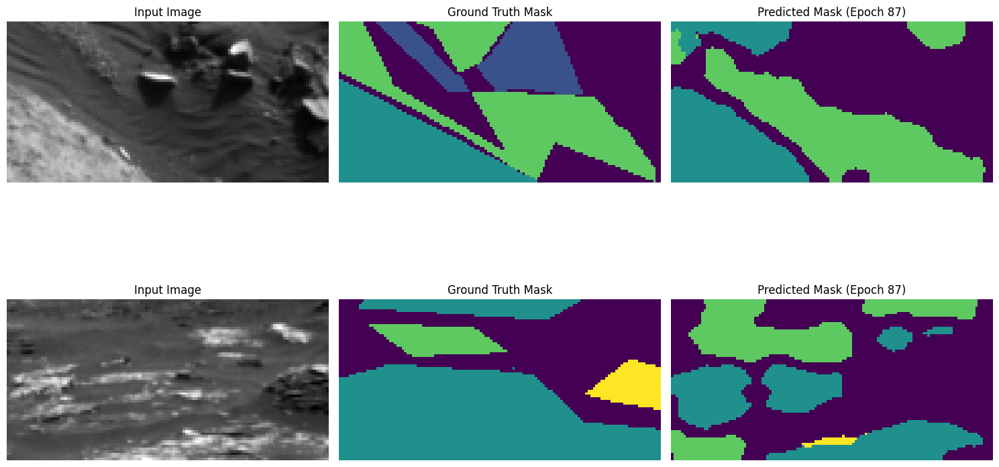

376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 238ms/step - accuracy: 0.8150 - loss: 0.6403 - mean_iou: 0.5777 - val_accuracy: 0.7729 - val_loss: 0.6936 - val_mean_iou: 0.4827 - learning_rate: 1.0000e-06
Epoch 88/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - accuracy: 0.8147 - loss: 0.6402 - mean_iou: 0.5773Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 88: val_loss did not improve from 0.69202
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


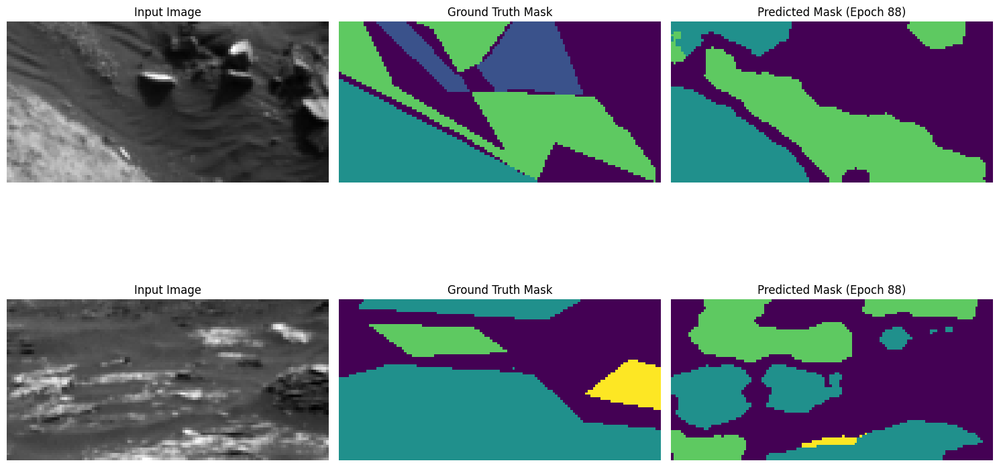

376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 236ms/step - accuracy: 0.8147 - loss: 0.6402 - mean_iou: 0.5772 - val_accuracy: 0.7734 - val_loss: 0.6934 - val_mean_iou: 0.4847 - learning_rate: 1.0000e-06
Epoch 89/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - accuracy: 0.8154 - loss: 0.6401 - mean_iou: 0.5779Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 89: val_loss did not improve from 0.69202
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


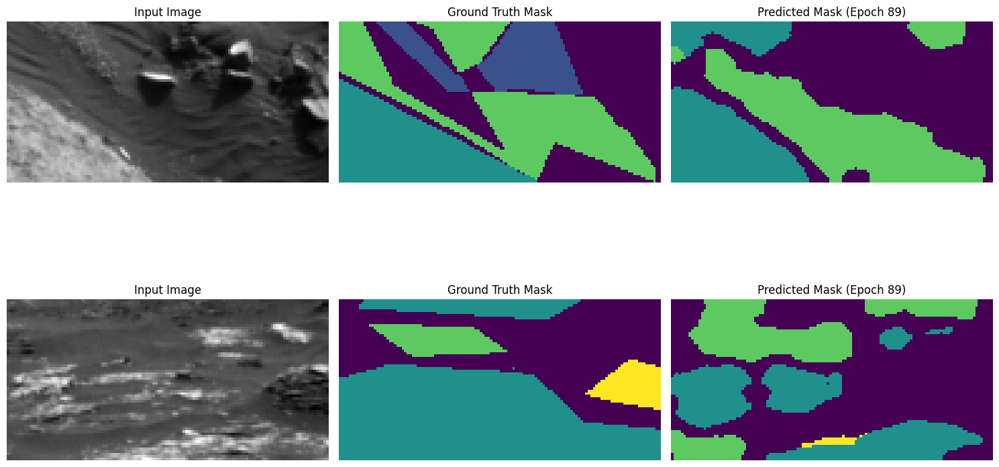

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 233ms/step - accuracy: 0.8154 - loss: 0.6401 - mean_iou: 0.5778 - val_accuracy: 0.7735 - val_loss: 0.6933 - val_mean_iou: 0.4861 - learning_rate: 1.0000e-06
Epoch 90/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - accuracy: 0.8154 - loss: 0.6399 - mean_iou: 0.5783Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 90: val_loss did not improve from 0.69202
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


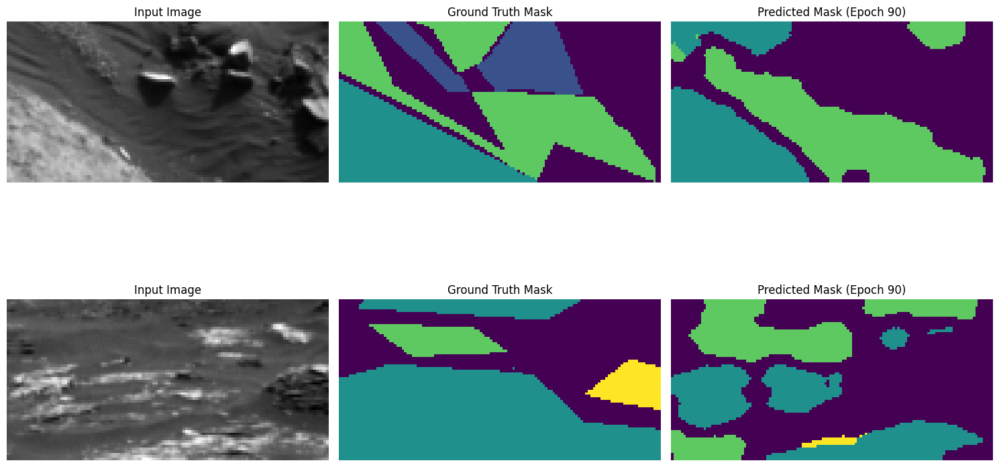

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 234ms/step - accuracy: 0.8154 - loss: 0.6398 - mean_iou: 0.5783 - val_accuracy: 0.7732 - val_loss: 0.6935 - val_mean_iou: 0.4847 - learning_rate: 1.0000e-06
Epoch 91/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - accuracy: 0.8155 - loss: 0.6398 - mean_iou: 0.5782Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 91: val_loss did not improve from 0.69202
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


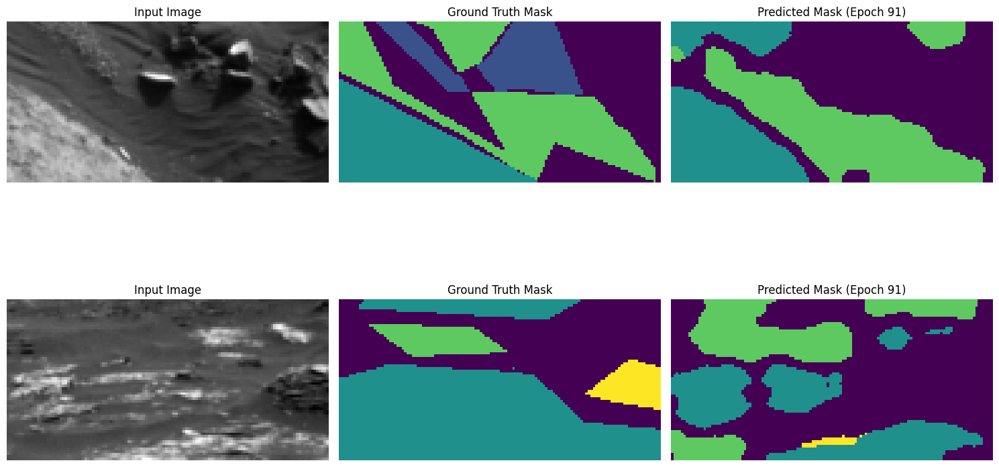

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 234ms/step - accuracy: 0.8155 - loss: 0.6398 - mean_iou: 0.5782 - val_accuracy: 0.7731 - val_loss: 0.6935 - val_mean_iou: 0.4845 - learning_rate: 1.0000e-06
Epoch 92/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - accuracy: 0.8152 - loss: 0.6398 - mean_iou: 0.5779Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 92: val_loss did not improve from 0.69202
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


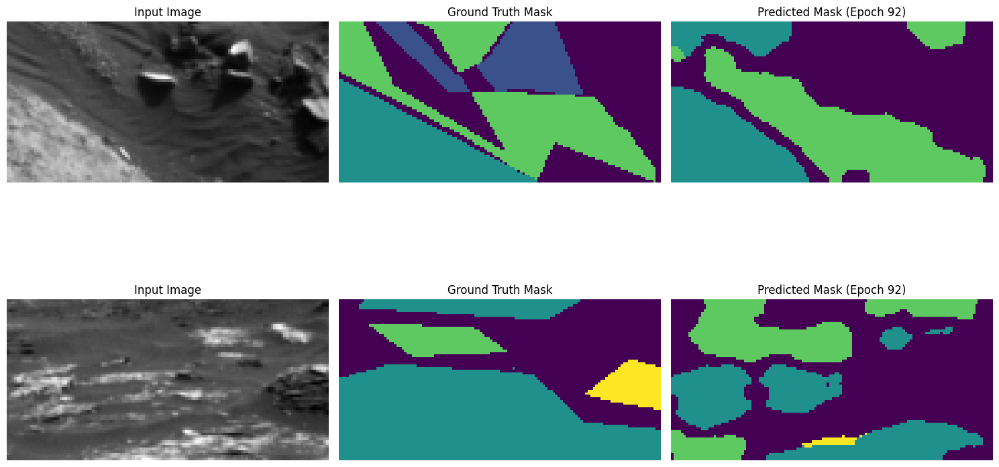

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 235ms/step - accuracy: 0.8153 - loss: 0.6398 - mean_iou: 0.5779 - val_accuracy: 0.7738 - val_loss: 0.6930 - val_mean_iou: 0.4863 - learning_rate: 1.0000e-06
Epoch 93/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - accuracy: 0.8157 - loss: 0.6396 - mean_iou: 0.5791Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 93: val_loss did not improve from 0.69202
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


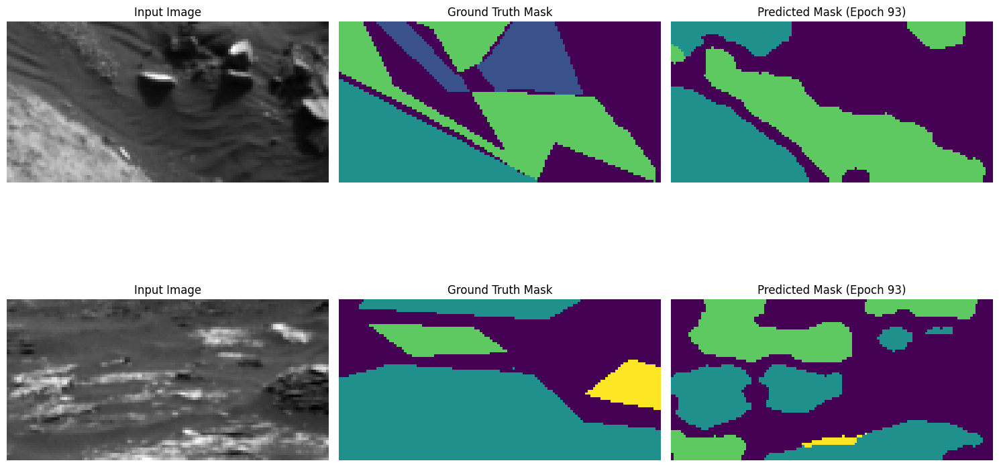

376/376 ━━━━━━━━━━━━━━━━━━━━ 87s 232ms/step - accuracy: 0.8157 - loss: 0.6396 - mean_iou: 0.5791 - val_accuracy: 0.7737 - val_loss: 0.6931 - val_mean_iou: 0.4857 - learning_rate: 1.0000e-06
Epoch 94/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - accuracy: 0.8158 - loss: 0.6395 - mean_iou: 0.5792Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 94: val_loss did not improve from 0.69202
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


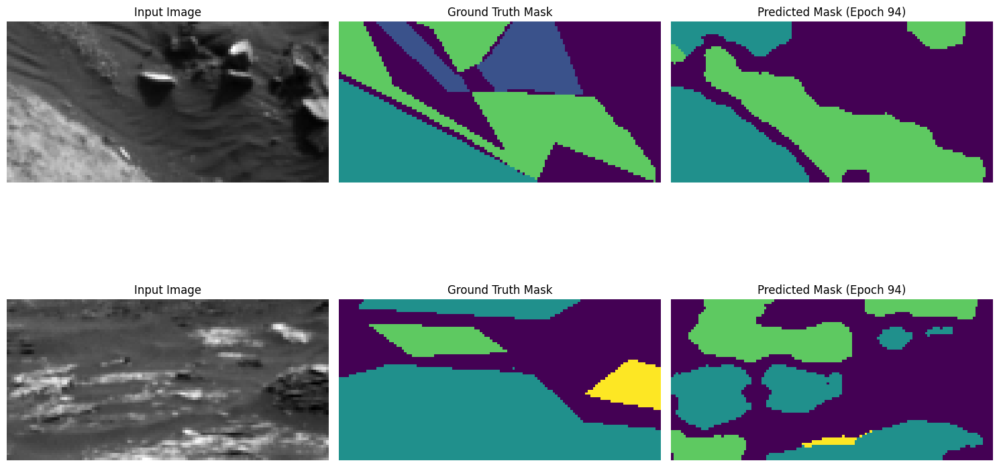

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 234ms/step - accuracy: 0.8159 - loss: 0.6395 - mean_iou: 0.5792 - val_accuracy: 0.7738 - val_loss: 0.6932 - val_mean_iou: 0.4866 - learning_rate: 1.0000e-06
Epoch 95/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - accuracy: 0.8158 - loss: 0.6395 - mean_iou: 0.5792Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 95: val_loss did not improve from 0.69202
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


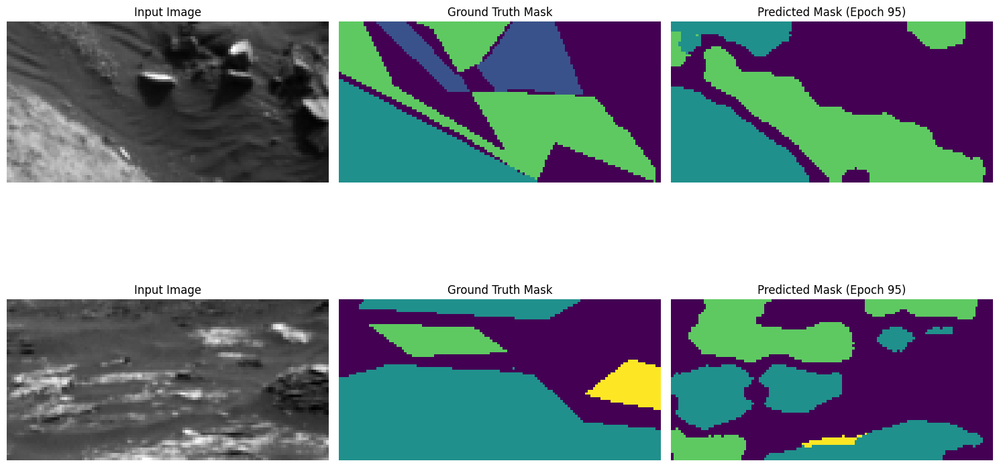

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 235ms/step - accuracy: 0.8158 - loss: 0.6395 - mean_iou: 0.5791 - val_accuracy: 0.7733 - val_loss: 0.6932 - val_mean_iou: 0.4859 - learning_rate: 1.0000e-06
Epoch 96/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - accuracy: 0.8158 - loss: 0.6395 - mean_iou: 0.5798Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 96: val_loss did not improve from 0.69202
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


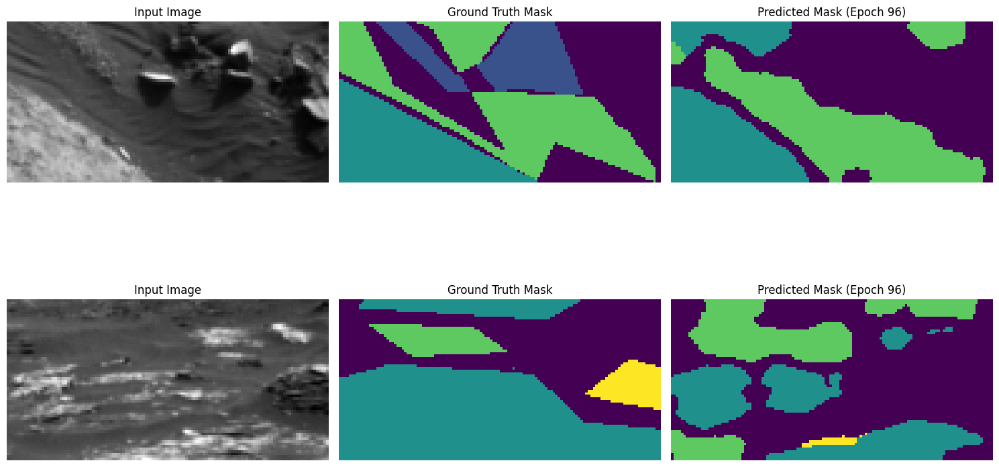

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 234ms/step - accuracy: 0.8158 - loss: 0.6395 - mean_iou: 0.5798 - val_accuracy: 0.7737 - val_loss: 0.6933 - val_mean_iou: 0.4853 - learning_rate: 1.0000e-06
Epoch 97/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - accuracy: 0.8163 - loss: 0.6394 - mean_iou: 0.5792Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 97: val_loss did not improve from 0.69202
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


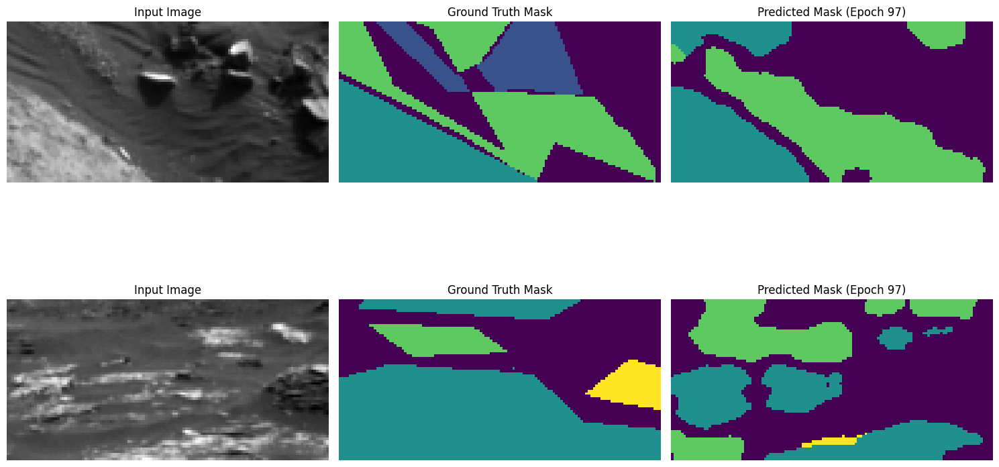

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 235ms/step - accuracy: 0.8163 - loss: 0.6394 - mean_iou: 0.5792 - val_accuracy: 0.7734 - val_loss: 0.6931 - val_mean_iou: 0.4854 - learning_rate: 1.0000e-06
Epoch 98/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - accuracy: 0.8163 - loss: 0.6392 - mean_iou: 0.5801Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 98: val_loss did not improve from 0.69202
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


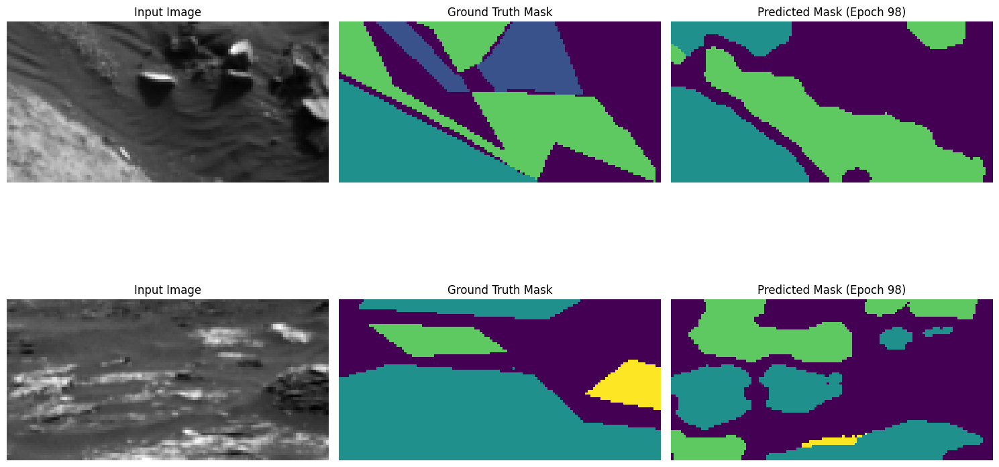

376/376 ━━━━━━━━━━━━━━━━━━━━ 87s 232ms/step - accuracy: 0.8163 - loss: 0.6391 - mean_iou: 0.5801 - val_accuracy: 0.7735 - val_loss: 0.6932 - val_mean_iou: 0.4856 - learning_rate: 1.0000e-06
Epoch 99/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - accuracy: 0.8163 - loss: 0.6392 - mean_iou: 0.5802Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 99: val_loss did not improve from 0.69202
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


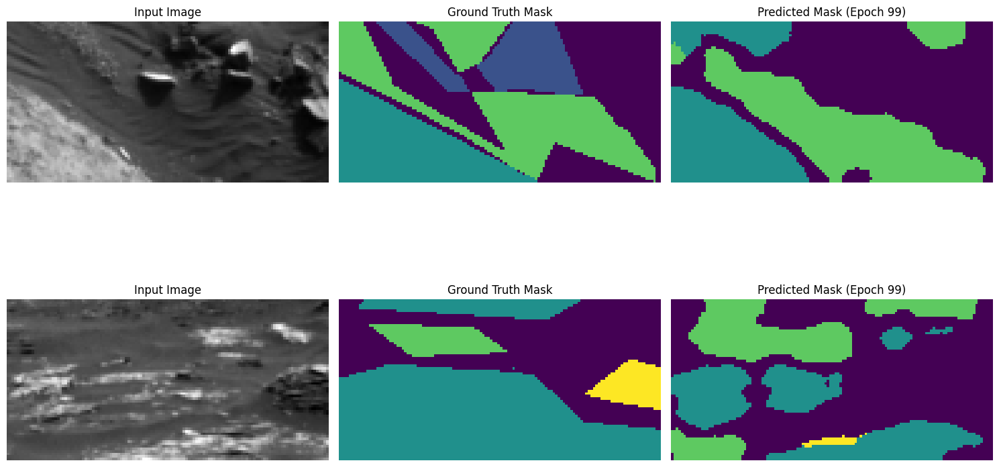

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 233ms/step - accuracy: 0.8163 - loss: 0.6392 - mean_iou: 0.5802 - val_accuracy: 0.7735 - val_loss: 0.6935 - val_mean_iou: 0.4853 - learning_rate: 1.0000e-06
Epoch 100/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - accuracy: 0.8167 - loss: 0.6390 - mean_iou: 0.5801Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 100: val_loss did not improve from 0.69202
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


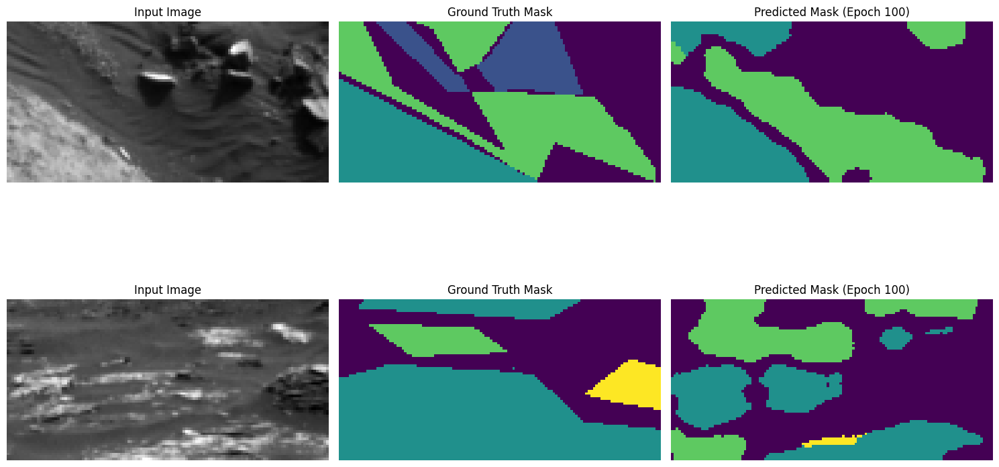

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 233ms/step - accuracy: 0.8167 - loss: 0.6390 - mean_iou: 0.5801 - val_accuracy: 0.7728 - val_loss: 0.6935 - val_mean_iou: 0.4850 - learning_rate: 1.0000e-06
Epoch 101/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - accuracy: 0.8167 - loss: 0.6389 - mean_iou: 0.5806Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 101: val_loss did not improve from 0.69202
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


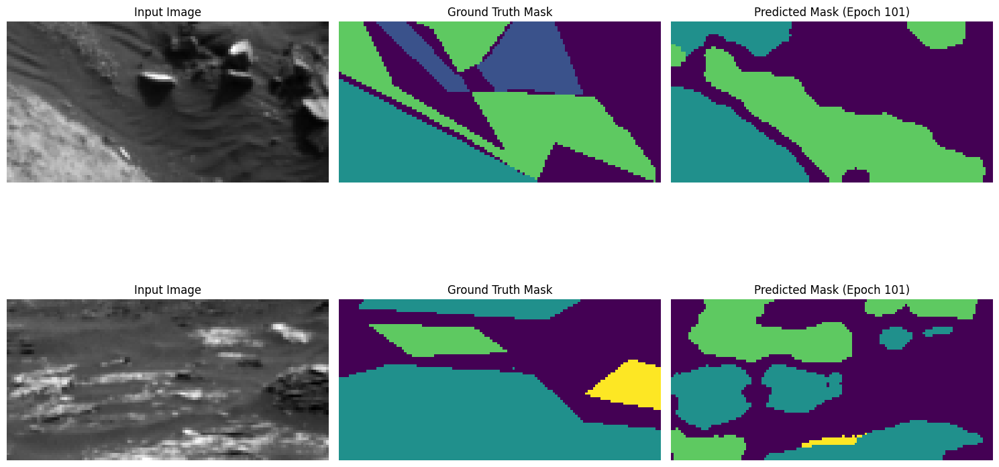

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 233ms/step - accuracy: 0.8167 - loss: 0.6389 - mean_iou: 0.5806 - val_accuracy: 0.7743 - val_loss: 0.6932 - val_mean_iou: 0.4851 - learning_rate: 1.0000e-06
Epoch 102/1000
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - accuracy: 0.8166 - loss: 0.6389 - mean_iou: 0.5806Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 102: val_loss did not improve from 0.69202
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


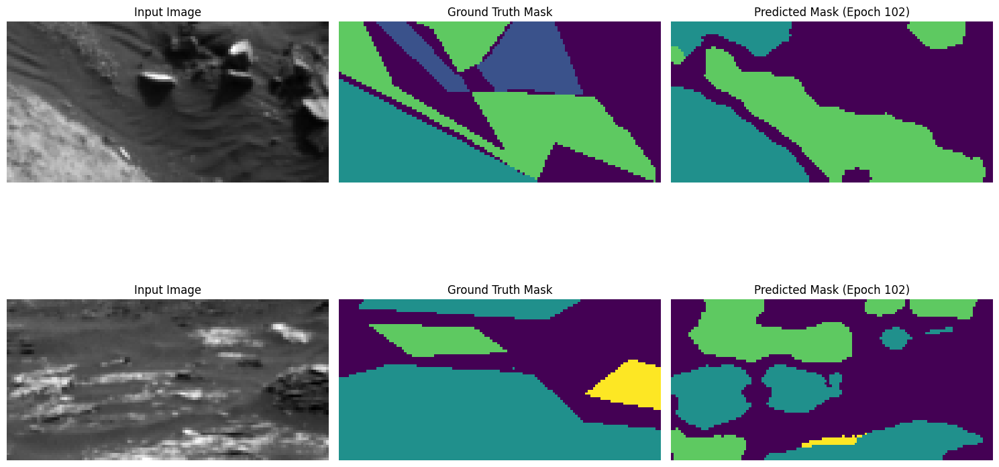

376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 235ms/step - accuracy: 0.8166 - loss: 0.6389 - mean_iou: 0.5806 - val_accuracy: 0.7734 - val_loss: 0.6931 - val_mean_iou: 0.4850 - learning_rate: 1.0000e-06


In [167]:
import tensorflow as tf
from tensorflow.keras import layers as tfkl

# Residual Block with Normalization
def residual_block(x, filters, norm_type='layer'):
    shortcut = x
    x = tfkl.Conv2D(filters, (3, 3), padding='same')(x)
    x = apply_normalization(x, norm_type)
    x = tfkl.Activation('relu')(x)
    x = tfkl.Conv2D(filters, (3, 3), padding='same')(x)
    x = apply_normalization(x, norm_type)
    x = tfkl.Activation('relu')(x)
    shortcut = tfkl.Conv2D(filters, (1, 1), padding='same')(shortcut)
    return tfkl.add([x, shortcut])

# Skip Connection with Learnable Fusion
def learnable_skip_connection(encoder_features, decoder_features, filters):
    # Concatenate encoder and decoder features
    concat_features = tfkl.Concatenate()([encoder_features, decoder_features])
    # Apply a learnable fusion mechanism
    fusion_gate = tfkl.Conv2D(filters, (1, 1), activation='sigmoid')(concat_features)
    weighted_features = fusion_gate * encoder_features + (1 - fusion_gate) * decoder_features
    return weighted_features
def focal_dice_loss(class_weights, gamma=2.0, alpha=0.25, smooth=1e-6):
    def loss(y_true, y_pred):
        # One-hot encode y_true
        y_true_one_hot = tf.one_hot(tf.cast(y_true, tf.int32), depth=len(class_weights))

        # Sıkıştır (fazladan kanal boyutunu kaldır)
        if len(y_true_one_hot.shape) > len(y_pred.shape):
            y_true_one_hot = tf.squeeze(y_true_one_hot, axis=-2)  # Fazladan boyutu sıkıştır
        
        # y_pred'in değerlerini sınırlı bir aralıkta tut
        y_pred = tf.clip_by_value(y_pred, tf.keras.backend.epsilon(), 1 - tf.keras.backend.epsilon())
        
        # Focal Loss
        ce_loss = -y_true_one_hot * tf.math.log(y_pred)
        focal_loss = alpha * tf.pow(1 - y_pred, gamma) * ce_loss
        focal_loss = tf.reduce_mean(tf.reduce_sum(class_weights * focal_loss, axis=-1))
        
        # Dice Loss
        intersection = tf.reduce_sum(y_true_one_hot * y_pred, axis=(1, 2))
        denominator = tf.reduce_sum(y_true_one_hot + y_pred, axis=(1, 2))
        dice_loss = 1 - (2 * intersection * class_weights + smooth) / (denominator * class_weights + smooth)
        dice_loss = tf.reduce_mean(dice_loss)
        
        # Total Loss
        total_loss = focal_loss + dice_loss
        return total_loss
    return loss

# Adaptive Normalization
def apply_normalization(x, norm_type):
    if norm_type == 'layer':
        return tfkl.LayerNormalization()(x)
    elif norm_type == 'instance':
        return tfkl.InstanceNormalization()(x)
    elif norm_type == 'group':
        # For Group Normalization, use TensorFlow Addons
        from tensorflow_addons.layers import GroupNormalization
        return GroupNormalization(groups=8, axis=-1)(x)
    else:
        raise ValueError(f"Unsupported normalization type: {norm_type}")

# U-Net with Residual Connections, Adaptive Normalization, and Learnable Fusion
def enhanced_unet(input_shape, num_classes, norm_type='layer'):
    inputs = tfkl.Input(input_shape)

    # Encoder
    c1 = residual_block(inputs, 64, norm_type=norm_type)
    p1 = tfkl.MaxPooling2D((2, 2))(c1)

    c2 = residual_block(p1, 128, norm_type=norm_type)
    p2 = tfkl.MaxPooling2D((2, 2))(c2)

    c3 = residual_block(p2, 256, norm_type=norm_type)
    p3 = tfkl.MaxPooling2D((2, 2))(c3)

    c4 = residual_block(p3, 512, norm_type=norm_type)

    # Decoder
    u1 = tfkl.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c4)
    u1 = learnable_skip_connection(c3, u1, 256)
    d1 = residual_block(u1, 256, norm_type=norm_type)

    u2 = tfkl.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(d1)
    u2 = learnable_skip_connection(c2, u2, 128)
    d2 = residual_block(u2, 128, norm_type=norm_type)

    u3 = tfkl.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(d2)
    u3 = learnable_skip_connection(c1, u3, 64)
    d3 = residual_block(u3, 64, norm_type=norm_type)

    outputs = tfkl.Conv2D(num_classes, (1, 1), activation='softmax')(d3)

    return tf.keras.Model(inputs, outputs)

# Initialize the enhanced U-Net
input_shape = X_train.shape[1:]  # e.g., (64, 128, 1)
num_classes = 5

model = enhanced_unet(input_shape, num_classes, norm_type='layer')
# Calculate class weights based on pixel proportions
class_pixel_counts = np.bincount(y_train_int.flatten(), minlength=num_classes)  # Count pixels for each class
total_pixels = np.sum(class_pixel_counts)  # Total number of pixels
class_weights = total_pixels / (class_pixel_counts + 1e-6)  # Inverse frequency
class_weights /= np.sum(class_weights)  # Normalize to sum to 1
# Compile the model with the new loss function
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss=focal_dice_loss(class_weights),
    metrics=["accuracy", MeanIntersectionOverUnion(num_classes=num_classes, labels_to_exclude=[0])]
)

model.summary()

# Training
save_best_miou = SaveBestMeanIoU(filepath="best_model_mean_iou.h5", monitor="val_mean_iou", mode="max", verbose=1)
history = model.fit(
    X_train,
    y_train,
    validation_data=(X_val, y_val),
    epochs=1000,
    callbacks=[save_best_miou, early_stopping, model_checkpoint, reduce_lr, visualize_callback]
)


In [168]:

print(f"X_train_finetune shape: {X_train.shape}")
print(f"y_train_finetune shape: {y_train.shape}")
print(f"X_val_top_20_percent shape: {X_val.shape}")
print(f"y_val_top_20_percent shape: {y_val.shape}")

X_train_finetune shape: (12024, 64, 128, 1)
y_train_finetune shape: (12024, 64, 128)
X_val_top_20_percent shape: (501, 64, 128, 1)
y_val_top_20_percent shape: (501, 64, 128, 1)


In [172]:
# Load the saved model
best_model = tf.keras.models.load_model("best_model.keras",compile=False)



In [173]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
X_train_finetune=X_train[top_20_percent_indices]
y_train_finetune=y_train[top_20_percent_indices]
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Veri artırma argümanları
data_gen_args = dict(
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode="nearest"
)

# Hem görüntü hem maske için veri artırma
image_datagen = ImageDataGenerator(**data_gen_args)
mask_datagen = ImageDataGenerator(**data_gen_args)

X_train_aug = []
y_train_aug = []

for x, y in zip(X_train_finetune, y_train_finetune):
    x = np.expand_dims(x, axis=-1) if x.ndim == 2 else x  # Kanal boyutunu ekle
    y = np.expand_dims(y, axis=-1) if y.ndim == 2 else y  # Kanal boyutunu ekle

    # Her görüntü ve maske çifti için aynı random seed kullanılır
    seed = np.random.randint(0, 10000)
    
    # Görüntüyü artır
    image_generator = image_datagen.flow(
        x[np.newaxis, ...],  # Batch boyutu ekle
        batch_size=1,
        seed=seed
    )
    
    # Maskeyi artır
    mask_generator = mask_datagen.flow(
        y[np.newaxis, ...],  # Batch boyutu ekle
        batch_size=1,
        seed=seed
    )

    # Örnekler oluştur
    for _ in range(5):  # Her görüntü için 5 artırılmış örnek oluştur
        augmented_x = next(image_generator)[0]  # İlk örneği al
        augmented_y = next(mask_generator)[0]  # İlk örneği al
        
        # Maskeyi bir kez daha yuvarlayarak tam sayı yap
        augmented_y = np.round(augmented_y).astype(int)

        X_train_aug.append(augmented_x)
        y_train_aug.append(augmented_y)

# Ensure y_train_finetune has the correct dimensions
if y_train_finetune.ndim == 3:  # Check if channel dimension is missing
    y_train_finetune = np.expand_dims(y_train_finetune, axis=-1)

# Veri artırmayı orijinal veriyle birleştir
X_train_finetune = np.concatenate([X_train_finetune, X_train_aug], axis=0)
y_train_finetune = np.concatenate([y_train_finetune, y_train_aug], axis=0)

print(f"Fine-tuning dataset size: {X_train_finetune.shape}, {y_train_finetune.shape}")




Fine-tuning dataset size: (396, 64, 128, 1), (396, 64, 128, 1)


In [190]:
model.load_weights("best_model_mean_iou.h5")

In [191]:
print(f"X_train_finetune shape: {X_train_finetune.shape}")
print(f"y_train_finetune shape: {y_train_finetune.shape}")
print(f"X_val_top_20_percent shape: {X_val_top_20_percent.shape}")
print(f"y_val_top_20_percent shape: {y_val_top_20_percent.shape}")

X_train_finetune shape: (66, 64, 128, 1)
y_train_finetune shape: (66, 64, 128)
X_val_top_20_percent shape: (2, 64, 128)
y_val_top_20_percent shape: (2, 64, 128, 1)


In [192]:

if X_val_top_20_percent.ndim == 3:
    X_val_top_20_percent = np.expand_dims(X_val_top_20_percent, axis=-1)



print(f"X_train_finetune shape: {X_train_finetune.shape}")
print(f"y_train_finetune shape: {y_train_finetune.shape}")
print(f"X_val_top_20_percent shape: {X_val_top_20_percent.shape}")
print(f"y_val_top_20_percent shape: {y_val_top_20_percent.shape}")
# Calculate the additional epochs
additional_epochs = 20 # Adjust if initial training stopped earlier


X_train_finetune=X_train[top_20_percent_indices]
y_train_finetune=y_train[top_20_percent_indices]




# Fine-tuning
history_finetune = model.fit(
    X_train_finetune,
    y_train_finetune,
    validation_data=(X_val_top_20_percent, y_val_top_20_percent),  # Use top 20% validation data
    initial_epoch=94,  # Start from the epoch where training stopped
    epochs=additional_epochs + 94,  # Extend by additional epochs
    callbacks=[early_stopping, reduce_lr, model_checkpoint]
)


X_train_finetune shape: (66, 64, 128, 1)
y_train_finetune shape: (66, 64, 128)
X_val_top_20_percent shape: (2, 64, 128, 1)
y_val_top_20_percent shape: (2, 64, 128, 1)
Epoch 95/114
2/3 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step - accuracy: 0.7616 - loss: 0.6860 - mean_iou: 0.4685
Epoch 95: val_loss did not improve from 0.69202
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 800ms/step - accuracy: 0.7597 - loss: 0.6850 - mean_iou: 0.4734 - val_accuracy: 0.2469 - val_loss: 0.8379 - val_mean_iou: 0.1000 - learning_rate: 1.0000e-06
Epoch 96/114
2/3 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step - accuracy: 0.7619 - loss: 0.6859 - mean_iou: 0.4685
Epoch 96: val_loss did not improve from 0.69202
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - accuracy: 0.7601 - loss: 0.6848 - mean_iou: 0.4735 - val_accuracy: 0.2469 - val_loss: 0.8379 - val_mean_iou: 0.1000 - learning_rate: 1.0000e-06
Epoch 97/114
2/3 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step - accuracy: 0.7623 - loss: 0.6857 - mean_iou: 0.4686
Epoch 97: val_loss did not improve from 0.69202
3/3 

In [193]:
rare_class_eval = model.evaluate(X_val_top_20_percent, y_val_top_20_percent)
print(f"Rare Class Validation Evaluation: {rare_class_eval}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - accuracy: 0.2469 - loss: 0.8379 - mean_iou: 0.1000
Rare Class Validation Evaluation: [0.8379296660423279, 0.24688720703125, 0.10001345723867416]


In [194]:
# Load the saved model
import numpy as np
from sklearn.metrics import confusion_matrix

# Load the saved best model
#best_model = tf.keras.models.load_model("best_model_mean_iou.h5", custom_objects={"MeanIoU": tf.keras.metrics.MeanIoU})

# Predict on validation data
y_val_pred = model.predict(X_val)
y_val_pred_classes = np.argmax(y_val_pred, axis=-1)  # Convert to class predictions

# Reshape the true labels to match the predictions
y_val_true = y_val.squeeze()  # Remove channel dimension if present

# Initialize variables to store IoU per class
num_classes = 5
ious = []

# Compute IoU for each class
for class_id in range(1,num_classes):
    true_class = (y_val_true == class_id).astype(int)
    pred_class = (y_val_pred_classes == class_id).astype(int)
    intersection = np.sum(true_class * pred_class)
    union = np.sum(true_class + pred_class) - intersection
    iou = intersection / union if union > 0 else 0.0
    ious.append(iou)
    print(f"Class {class_id} IoU: {iou:.4f}")

# Display mean IoU
mean_iou = np.mean([iou for iou in ious])  # Exclude zero IoUs
print(f"Mean IoU (excluding zero IoUs): {mean_iou:.4f}")


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 117ms/step
Class 1 IoU: 0.7371
Class 2 IoU: 0.6044
Class 3 IoU: 0.7035
Class 4 IoU: 0.0960
Mean IoU (excluding zero IoUs): 0.5352


In [198]:
import numpy as np

def mean_iou(y_true, y_pred, num_classes):
    """
    Calculate Mean Intersection over Union (IoU)
    :param y_true: Ground truth masks (H, W)
    :param y_pred: Predicted masks (H, W)
    :param num_classes: Number of classes
    :return: Mean IoU for all classes
    """
    iou_per_class = []
    for cls in range(num_classes):
        intersection = np.logical_and(y_true == cls, y_pred == cls).sum()
        union = np.logical_or(y_true == cls, y_pred == cls).sum()
        if union == 0:  # Avoid division by zero
            iou_per_class.append(np.nan)  # Mark as NaN if the class is not present
        else:
            iou_per_class.append(intersection / union)
    mean_iou_value = np.nanmean(iou_per_class)  # Mean ignoring NaNs
    return mean_iou_value, iou_per_class


In [199]:
# Full validation dataset predictions
y_val_pred_full = model.predict(X_val)
y_val_pred_full = np.argmax(y_val_pred_full, axis=-1)  # Convert to class indices

# Top 20% rare class validation dataset predictions
y_val_pred_rare = model.predict(X_val_top_20_percent)
y_val_pred_rare = np.argmax(y_val_pred_rare, axis=-1)


16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


In [200]:
# Full validation dataset
mean_iou_full, iou_per_class_full = mean_iou(y_val.flatten(), y_val_pred_full.flatten(), num_classes)
print("Full Validation Mean IoU:", mean_iou_full)
for cls, iou in enumerate(iou_per_class_full):
    print(f"Class {cls} IoU: {iou:.4f}")

# Top 20% rare class validation dataset
mean_iou_rare, iou_per_class_rare = mean_iou(y_val_top_20_percent.flatten(), y_val_pred_rare.flatten(), num_classes)
print("\nTop 20% Rare Class Validation Mean IoU:", mean_iou_rare)
for cls, iou in enumerate(iou_per_class_rare):
    print(f"Class {cls} IoU: {iou:.4f}")


Full Validation Mean IoU: 0.5172614849842514
Class 0 IoU: 0.4453
Class 1 IoU: 0.7371
Class 2 IoU: 0.6044
Class 3 IoU: 0.7035
Class 4 IoU: 0.0960

Top 20% Rare Class Validation Mean IoU: 0.10210893162914171
Class 0 IoU: 0.0737
Class 1 IoU: nan
Class 2 IoU: nan
Class 3 IoU: 0.0000
Class 4 IoU: 0.2326


In [201]:
#model=best_model

In [202]:
model_filename = f"model_best_normalized_augmented_hvr_best_invert_noise.keras"
model.save(model_filename)

print(f"Model saved to {model_filename}")

Model saved to model_best_normalized_augmented_hvr_best_invert_noise.keras


## 📊 Prepare Your Submission

In our Kaggle competition, submissions are made as `csv` files. To create a proper `csv` file, you need to flatten your predictions and include an `id` column as the first column of your dataframe. To maintain consistency between your results and our solution, please avoid shuffling the test set. The code below demonstrates how to prepare the `csv` file from your model predictions.



In [203]:
import os
# If model_filename is not defined, load the most recent model from Google Drive
if "model_filename" not in globals() or model_filename is None:
    files = [f for f in os.listdir('.') if os.path.isfile(f) and f.startswith('model_') and f.endswith('.keras')]
    files.sort(key=lambda x: os.path.getmtime(x), reverse=True)
    if files:
        model_filename = files[0]
    else:
        raise FileNotFoundError("No model files found in the current directory.")

In [204]:
print(f"X_test shape before reshaping: {X_test.shape}")

X_test shape before reshaping: (10022, 64, 128, 1)


In [205]:
# Generate predictions
preds = model.predict(X_test)
preds = np.argmax(preds, axis=-1)  # Convert probabilities to class labels
print(f"Predictions shape: {preds.shape}")

314/314 ━━━━━━━━━━━━━━━━━━━━ 28s 90ms/step
Predictions shape: (10022, 64, 128)


Randomly selected indices for prediction (seed=42): [3543 5731 4801  416 5125 9915  293 5020 1765 4192 2288 1188  107 7583
  856 5090 9784 5192 6935  850]


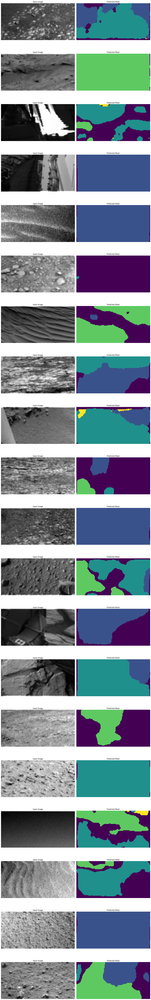

In [206]:
import numpy as np
import matplotlib.pyplot as plt

# Set random seed for reproducibility
np.random.seed(42)
# Randomly select 20 indices for prediction
random_indices = np.random.choice(X_test.shape[0], size=20, replace=False)
print(f"Randomly selected indices for prediction (seed=42): {random_indices}")

# Select 20 random samples and their corresponding masks
X_sample = X_test[random_indices]



predicted_masks = preds

# Visualize the predictions
num_images = len(X_sample)  # Number of images to visualize
fig, axes = plt.subplots(num_images, 2, figsize=(15, num_images * 5))

for i in range(num_images):
    # Original Image
    ax_img = axes[i, 0]
    ax_img.imshow(X_sample[i].squeeze(), cmap="gray")
    ax_img.set_title("Input Image")
    ax_img.axis("off")

    # Predicted Mask
    ax_pred = axes[i, 1]
    ax_pred.imshow(predicted_masks[i], cmap="viridis",vmin=0,vmax=4)
    ax_pred.set_title("Predicted Mask")
    ax_pred.axis("off")

plt.tight_layout()
plt.show()

In [207]:
def y_to_df(y) -> pd.DataFrame:
    """Converts segmentation predictions into a DataFrame format for Kaggle."""
    n_samples = len(y)
    y_flat = y.reshape(n_samples, -1)
    df = pd.DataFrame(y_flat)
    df["id"] = np.arange(n_samples)
    cols = ["id"] + [col for col in df.columns if col != "id"]
    return df[cols]

In [208]:
# Create and download the csv submission file
timestep_str = model_filename.replace("model_", "").replace(".keras", "")
submission_filename = f"submission_{timestep_str}.csv"
submission_df = y_to_df(preds)
submission_df.to_csv(submission_filename, index=False)



In [ ]:
len(submission_df.columns)

In [ ]:
len(submission_df)

In [ ]:
"""import numpy as np
import tensorflow as tf
from skimage.util import random_noise
import matplotlib.pyplot as plt

# Define augmentation functions
def add_noise(image, amount=0.02):
    """Add salt and pepper noise."""
    return np.clip(random_noise(image, mode="s&p", amount=amount), 0, 1)

def adjust_brightness(image, delta):
    """Adjust the brightness of an image."""
    image_tensor = tf.convert_to_tensor(image, dtype=tf.float32)
    adjusted = tf.image.adjust_brightness(image_tensor, delta=delta)
    return np.clip(adjusted.numpy(), 0, 1)

def invert_image(image):
    """Invert the grayscale image."""
    return 1.0 - image

def random_flip(image):
    """Randomly flip the image horizontally or vertically."""
    if np.random.rand() > 0.5:
        image = np.fliplr(image)
    if np.random.rand() > 0.5:
        image = np.flipud(image)
    return image
# Randomly select 5 images for visualization
random_indices = np.random.choice(len(X_test), size=5, replace=False)
selected_images = X_test[random_indices]

# Visualize augmentations
for idx, image in enumerate(selected_images):
    plt.figure(figsize=(15, 5))

    # Original
    plt.subplot(1, 6, 1)
    plt.imshow(image, cmap="gray")
    plt.title("Original")
    plt.axis("off")

    # Add noise
    noisy_image = add_noise(image)
    plt.subplot(1, 6, 2)
    plt.imshow(noisy_image, cmap="gray")
    plt.title("Noise")
    plt.axis("off")

    # Adjust brightness
    brighter_image = adjust_brightness(image, 0.2)
    plt.subplot(1, 6, 3)
    plt.imshow(brighter_image, cmap="gray")
    plt.title("Brighter")
    plt.axis("off")

    darker_image = adjust_brightness(image, -0.2)
    plt.subplot(1, 6, 4)
    plt.imshow(darker_image, cmap="gray")
    plt.title("Darker")
    plt.axis("off")

    # Invert
    inverted_image = invert_image(image)
    plt.subplot(1, 6, 5)
    plt.imshow(inverted_image, cmap="gray")
    plt.title("Inverted")
    plt.axis("off")

    # Random Flip
    flipped_image = random_flip(image)
    plt.subplot(1, 6, 6)
    plt.imshow(flipped_image, cmap="gray")
    plt.title("Flipped")
    plt.axis("off")

    plt.tight_layout()
    plt.show()"""
